In [ ]:
##<script>
##  jQuery(document).ready(function($) {  
##  
##  $(window).on('load', function(){
##    $('#preloader').fadeOut('slow',function(){$(this).remove();});
##  });
##  
##  });
##</script>
##
##<style type="text/css">
##  div#preloader { position: fixed; 
##      left: 0; 
##      top: 0; 
##      z-index: 999; 
##      width: 100%; 
##      height: 100%; 
##      overflow: visible; 
##      background: #fff url('http://preloaders.net/preloaders/720/Moving%20line.gif') no-repeat center center; 
##  }
##
##</style>
##
##<div id="preloader">
##
##</div>

# Food Framing Analysis Script (2018). Polished display Version

#### Adapted from (Folke et al., 2016, NHB) by Pradyumna Sepulveda, Amy Benson and Benedetto de Martino
#### (Analysis 31 participants)

# Contents

# Data Analysis
## [0. Load Data](#load)
## [1. Correlation Graphs](#corr)
## [2. Logistic Plots](#log)
### [2.1. Logistic plots value](#logisticVal)
### [2.2. Logisitc plots familiarity](#logisticFam)
## [3. Regression Analysis](#reg)
### [3.1. Regressions per Condition](#regCond)
### [3.2. Regression per Participant](#regPart)
### [3.3. Regression including Familiarity](#regressionsFam)
#### [3.3.1 Choice](#ChoiceregressionFam)
#### [3.3.2 Confidence](#ConfregressionFam)
#### [3.3.3. Value + Familiarity](#VplusFregressionFam)
#### [3.3.4. Choice factors depending on familiarity](#ChoicFactregressionFam)
#### [3.3.5 BdM Familiarity-Value requested](#RequestregressionFam)
### [3.4. Hierarchical Regression (Pending)]()
# Appendix
## [1. Importing packages](#ImpPkg)
## [2. Loading Functions](#LoadFunc)




<a id='load'></a>
# 0. Load data and excluding participants

Participants 6, 33, 7, 17, 25, 30 should be excluded.Additionally, it was checked that trials in which participants did not fixate in any of the items were were skipped already.
Additionally we take out participants 37 and 38 because they don't follow the instructions (rejecting item in dislike, preferred item in like)
Therefore, 9 participants have been excluded.
Total number subjects = 40
Number of subjects remaining = =31

In [99]:
# Load data all participants
#data_exp1 = pd.read_csv('/Users/pradyumna/Documents/gitDocs/FF2018/Output/DataFoodFramingNotebook_v1.csv') 
data_exp1 = pd.read_csv('/Users/pradyumna/Documents/GiTs/FF2018/Output/DataFoodFramingNotebook_v1.csv') 

for i in [6, 7, 17, 25, 30, 33,37,38]:
    data_exp1 = data_exp1[(data_exp1.Part != i)]
print (data_exp1["Part"].unique())
print ('Number of participants: ' + str(len(data_exp1["Part"].unique())))

[ 1  2  3  4  5  8  9 10 11 12 13 14 15 16 18 19 20 21 22 23 24 26 27 28
 29 31 32 34 35 36 39]
Number of participants: 31


In [100]:
data_exp1=data_exp1.rename(index=str, columns={"ChosenITM":"Choice", 
                              "ChoiceRT":"RT",
                             "RValue":"RVal",
                             "LValue":"LVal",
                             "zRValue":"zRVal",
                             "zLValue":"zLVal",                    
                             "tDDT":"DDT",
                             "absDDT":"zAbsDDT",
                             "lIA_DT":"LDwellTime",
                             "rIA_DT":"RDwellTime",
                             "tGSF":"GSF",
                             "lastFixat":"LastFixat",
                             "DV":"DVal",
                             "zDV":"zDVal",
                             "absDV":"AbsDVal",
                             "zAbsDV":"zAbsDVal",                    
                             "zChoiceRT":"zRT",
                             "FamCh":"ChosenFam",
                              "FamUnCh":"UnchosenFam",
                              "ValCh":"ChosenVal",
                              "ValUnCh":"UnchosenVal",
                             "zFamCh":"zChosenFam",
                              "zFamUnCh":"zUnchosenFam",
                              "zValCh":"zChosenVal",
                              "zValUnCh":"zUnchosenVal",                   
                              "GSFMedSplit":"GSFSplit",
                            "DDTMedSplit":"DDTSplit"})
data_exp1

,Unnamed: 0,Part,TrialN,PairID,LItem,LVal,RItem,RVal,Choice,RT,...,zRVal,zLFam,zRFam,zLValConfBDM,zLFamConfBDM,zRValConfBDM,zRFamConfBDM,ConfSplit,GSFSplit,DDTSplit
0,0,1,1,14,116_boots_caramels.png,0.95,31_beef_jerky.png,2.00,1,3327,...,1.136137,-1.914122,0.732617,-3.876574,0.903717,1.128453,0.903717,1,1,0
1,1,1,2,44,102_propercorn_worcester.png,2.30,26_yorkie.png,1.70,1,3424,...,0.457846,0.732617,-0.149629,-0.122804,0.184006,-0.122804,-1.255416,0,1,1
2,2,1,3,51,59_crunchie.png,1.70,5_caramello.png,1.25,1,3691,...,-0.559590,0.852603,-0.678977,-0.122804,0.903717,0.294282,0.184006,0,0,1
3,3,1,4,12,64_nestle_aero_mint.png,1.55,102_propercorn_worcester.png,2.30,0,8144,...,1.814428,0.852603,0.732617,1.128453,0.903717,-0.122804,0.184006,0,1,0
4,4,1,5,4,44_walkers_french_fries.png,2.00,111_propercorn_sweetnsalty.png,2.00,0,6559,...,1.136137,0.379719,0.852603,0.294282,-1.255416,1.128453,1.383045,1,1,0
5,5,1,6,39,50_nakd_rhubarb_and_custard.png,0.65,39_milkyway.png,1.25,0,5595,...,-0.559590,-2.676383,0.203270,0.711367,1.383045,-0.539889,-1.255416,1,1,0
6,6,1,7,59,54_milkyway_magic_stars.png,1.55,30_starburst_original.png,1.10,1,2470,...,-0.898735,0.852603,0.732617,0.294282,1.383045,0.294282,0.184006,1,0,1
7,7,1,8,16,116_boots_caramels.png,0.95,104_graze_sriracha.png,0.65,1,6091,...,-1.916172,-1.914122,-2.443470,-3.876574,0.903717,-0.122804,-1.255416,1,0,1
8,8,1,9,1,62_cadbury_wispa.png,1.55,47_daim.png,1.70,1,4669,...,0.457846,-0.326078,0.026820,0.294282,-1.255416,0.711367,-1.255416,0,1,1
9,9,1,10,48,44_walkers_french_fries.png,2.00,53_eat_natural_almond_apricot.png,1.10,1,4001,...,-0.898735,0.379719,0.379719,0.294282,-1.255416,-0.539889,0.184006,0,0,1


# Add  % time looked at each item

In [101]:
data_exp1['LGazePC'] = (data_exp1['LDwellTime']) / (data_exp1['RDwellTime'] + data_exp1['LDwellTime'])
data_exp1['RGazePC'] = (data_exp1['RDwellTime']) / (data_exp1['RDwellTime'] + data_exp1['LDwellTime'])

data_exp1['HValGazePC'] = ( data_exp1['LVal'] >= data_exp1['RVal'] ) * data_exp1['LGazePC'] + ( data_exp1['LVal'] <= data_exp1['RVal'] ) * data_exp1['RGazePC']
data_exp1['LValGazePC'] = ( data_exp1['LVal'] <= data_exp1['RVal'] ) * data_exp1['LGazePC'] + ( data_exp1['LVal'] >= data_exp1['RVal'] ) * data_exp1['RGazePC']

data_exp1['zLGazePC'] = z_score1(data_exp1,'Part','LGazePC')
data_exp1['zRGazePC'] = z_score1(data_exp1,'Part','RGazePC')

data_exp1['zHValGazePC'] = z_score1(data_exp1,'Part','HValGazePC')
data_exp1['zLValGazePC'] = z_score1(data_exp1,'Part','LValGazePC')  

## Add % time looked at chosen items

In [102]:
data_exp1['ChosenGazePC'] = ( data_exp1['Choice'] == 0) * data_exp1['LGazePC'] + ( data_exp1['Choice'] == 1) * data_exp1['LGazePC']
data_exp1['UnchosenGazePC'] = ( data_exp1['Choice'] == 1) * data_exp1['LGazePC'] + ( data_exp1['Choice'] == 0)  * data_exp1['RGazePC']

data_exp1['zChosenGazePC'] = z_score1(data_exp1,'Part','ChosenGazePC')
data_exp1['zUnchosenGazePC'] = z_score1(data_exp1,'Part','UnchosenGazePC')  

In [103]:
# Just to generate additional file with all the measures separated by condition
#data_expL = data_exp1.loc[data_exp1['BlockCond'] == 1] # 1 = Like, 2 = Dislike
#data_expD = data_exp1.loc[data_exp1['BlockCond'] == 2] 

#data_expL.to_csv("InputData/FFAllData_Like.csv",index = False)
#data_expD.to_csv("InputData/FFAllData_Dislike.csv",index = False)

# Data Analysis 
-------------------------------------------

### List of parameters available for analysis

In [104]:
figsize(15, 15)
#Transform to numeric values in the dataframe
data_exp1 = data_exp1.apply(pd.to_numeric, errors='ignore')
#data_exp1.head()
#Show the list of data columns
list(data_exp1)

['Unnamed: 0',
 'Part',
 'TrialN',
 'PairID',
 'LItem',
 'LVal',
 'RItem',
 'RVal',
 'Choice',
 'RT',
 'Conf',
 'ConfRT',
 'BlockCond',
 'DDT',
 'LDwellTime',
 'RDwellTime',
 'GSF',
 'LastFixat',
 'DVal',
 'zDVal',
 'AbsDVal',
 'zAbsDVal',
 'zConf',
 'zRT',
 'DFam',
 'LFam',
 'RFam',
 'TotFam',
 'TotVal',
 'ChosenFam',
 'UnchosenFam',
 'ChosenVal',
 'UnchosenVal',
 'Correct',
 'LValConfBDM',
 'LFamConfBDM',
 'RValConfBDM',
 'RFamConfBDM',
 'zDFam',
 'zTotFam',
 'zTotVal',
 'zChosenVal',
 'zUnchosenVal',
 'zChosenFam',
 'zUnchosenFam',
 'zGSF',
 'zDDT',
 'zAbsDDT',
 'zAbsDFam',
 'zLVal',
 'zRVal',
 'zLFam',
 'zRFam',
 'zLValConfBDM',
 'zLFamConfBDM',
 'zRValConfBDM',
 'zRFamConfBDM',
 'ConfSplit',
 'GSFSplit',
 'DDTSplit',
 'LGazePC',
 'RGazePC',
 'HValGazePC',
 'LValGazePC',
 'zLGazePC',
 'zRGazePC',
 'zHValGazePC',
 'zLValGazePC',
 'ChosenGazePC',
 'UnchosenGazePC',
 'zChosenGazePC',
 'zUnchosenGazePC']

<a id='corr'></a>
#  1. Correlation Plots 

## (Like + Dislike) conditions

### Insert the variables to calculate the correlation

In [105]:
x_variable = 'zAbsDVal'
x_varlabel = '|zΔVal|'
y_variable = 'zRT'
y_varlabel =  'zRT'

Pearson's r = -0.131 p =  0.0


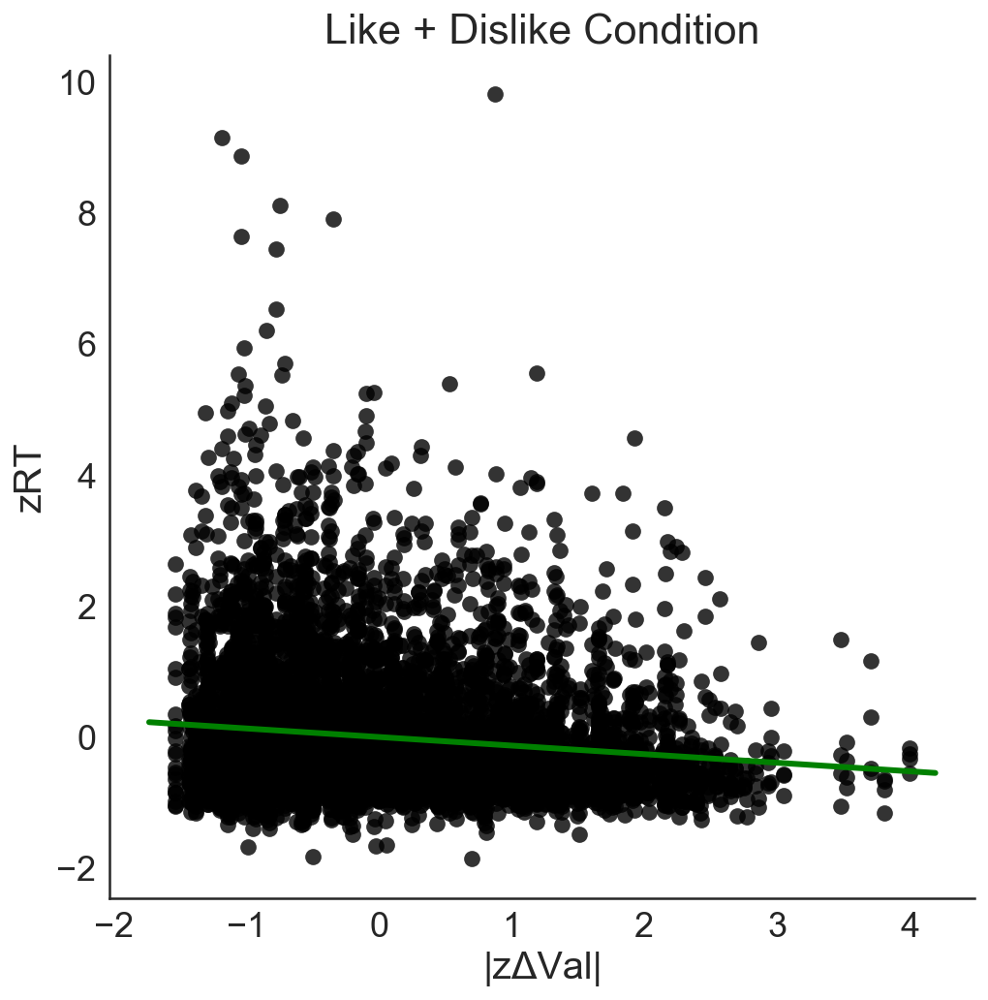

In [106]:
f = plt.figure(figsize=(8, 8))
sns.set(style='white', font_scale=1.8)
ax = sns.regplot(data=data_exp1, x= x_variable, y=y_variable, fit_reg=False, ci=0, color='#000000', scatter_kws={'s':70})
#sns.regplot(data=data_exp1, x='AbsDiffValue', y='Confidence', fit_reg=False, ci=0, color='Black', scatter_kws={'s':50})
ax.set(ylabel=y_varlabel, xlabel=x_varlabel)
#exp1 = mpatches.Patch(color='#000000', label='Experiment c1')
#exp2 = mpatches.Patch(color='#AAAAAA', label='Experiment 2')
#plt.legend(handles=[exp1, exp2], loc=3)
x=data_exp1[x_variable]
y=data_exp1[y_variable]
fit = np.polyfit(x, y, deg=1)
future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
fit_fn = np.poly1d(fit)
future_fit = np.polyval(fit_fn, future)
ax.plot(future, future_fit, color='Green', lw=3)
sns.despine()
ax.set_title('Like + Dislike Condition')



results = pearsonr(data_exp1[x_variable], data_exp1[y_variable])
print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))

Text(0.5,1,'Correlations Full Exp')

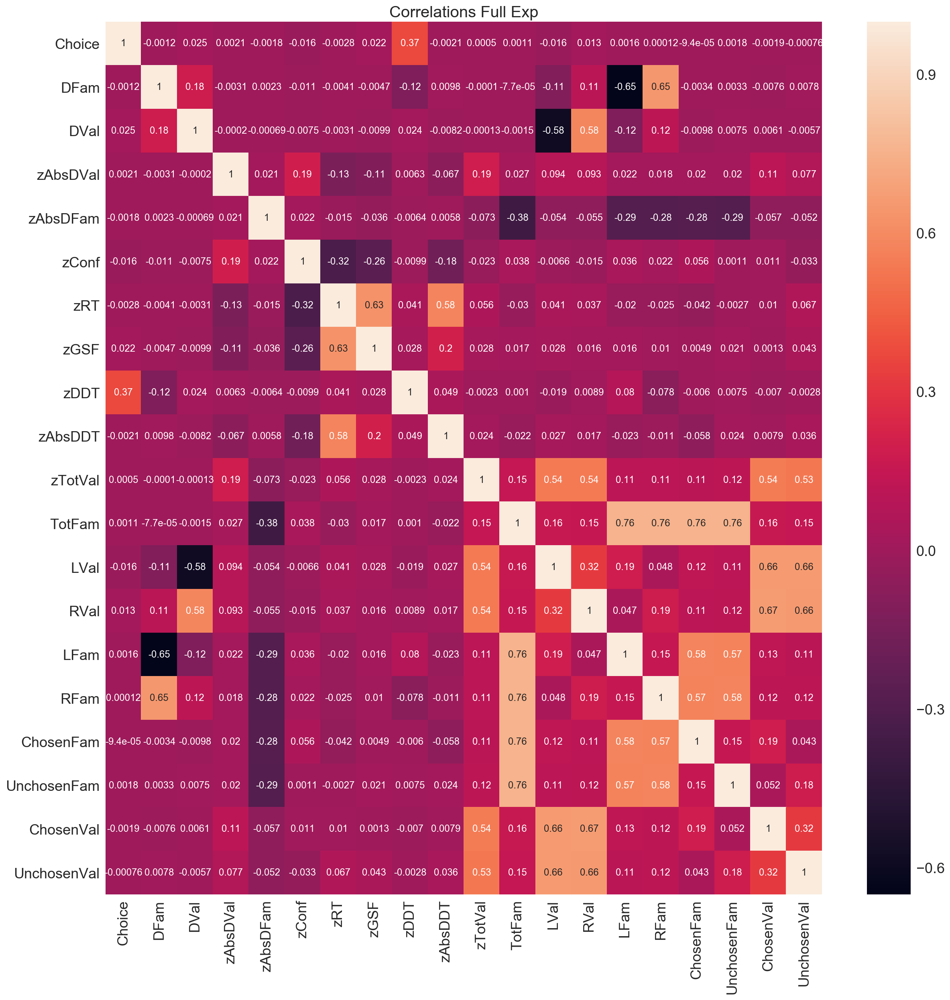

In [107]:
dataColsSelected = data_exp1.loc[:,  ['Choice','DFam','DVal','zAbsDVal','zAbsDFam','zConf','zRT', 'zGSF', 
                                     'zDDT', 'zAbsDDT', 'zTotVal','TotFam', 'LVal','RVal','LFam','RFam', 
                                     'ChosenFam','UnchosenFam','ChosenVal', 'UnchosenVal']]
dataColsSelected
data_corr = dataColsSelected.corr(method='pearson')
data_corr
# plot the heatmap
fig, ax = plt.subplots(figsize=(20,20))         # Sample figsize in inches
sns.heatmap(data_corr, 
       xticklabels=data_corr.columns,
       yticklabels=data_corr.columns, annot=True, annot_kws={"size": 12})

ax.set_title('Correlations Full Exp',fontsize=20)
#sns.set(font_scale=0.8) 

## Like Condition Only

In [108]:
#Select Condition 
data_expL = data_exp1.loc[data_exp1['BlockCond'] == 1] # 1 = Like, 2 = Dislike


### Insert the variables to calculate the correlation

In [109]:
x_variable = 'zDVal'
x_varlabel = '|zΔVal|'
y_variable = 'zRT'
y_varlabel =  'zRT'

#y_variable = 'zRT'
#y_varlabel = 'zRT'
#x_variable = 'zDV'
#x_varlabel =  'zTotVal'

Pearson's r = -0.022 p =  0.17


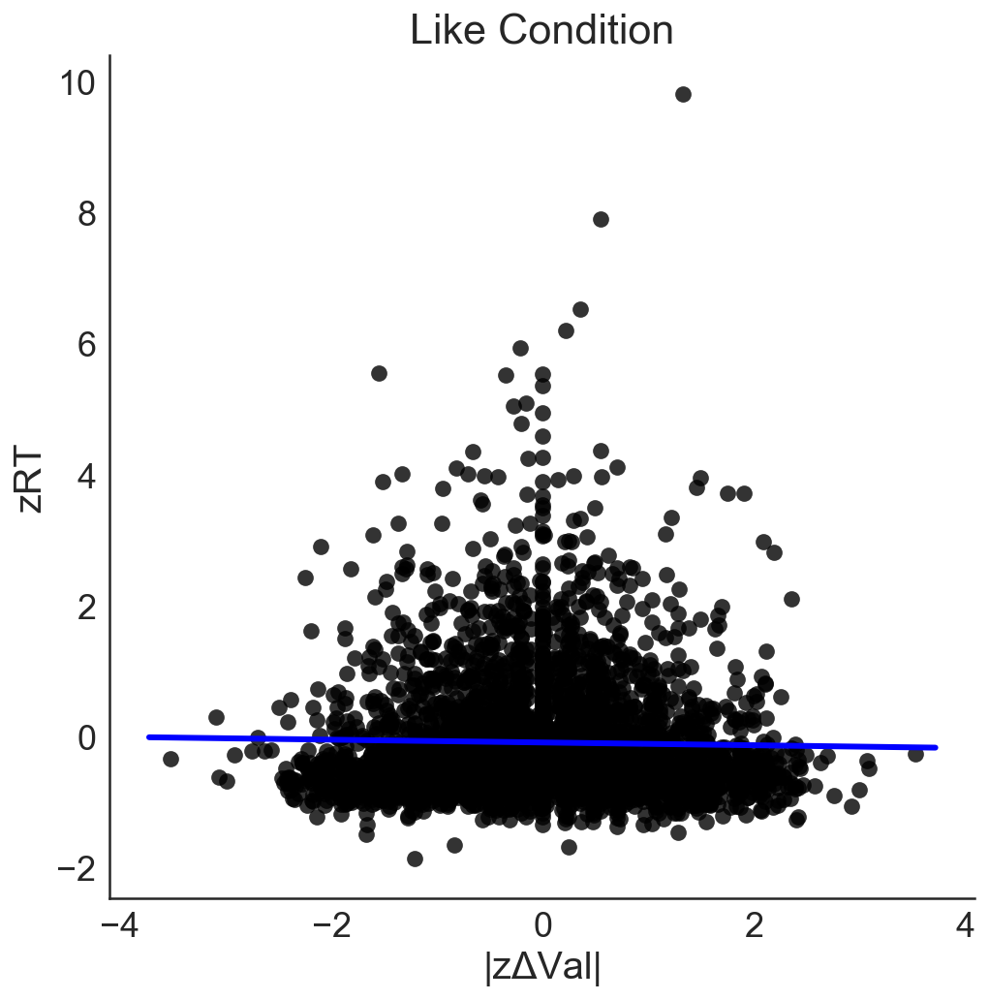

In [110]:
f = plt.figure(figsize=(8, 8))
sns.set(style='white', font_scale=1.8)
ax = sns.regplot(data=data_expL, x= x_variable, y=y_variable, fit_reg=False, ci=0, color='#000000', scatter_kws={'s':70})
#sns.regplot(data=data_exp1, x='AbsDiffValue', y='Confidence', fit_reg=False, ci=0, color='Black', scatter_kws={'s':50})
ax.set(ylabel=y_varlabel, xlabel=x_varlabel)
#exp1 = mpatches.Patch(color='#000000', label='Experiment c1')
#exp2 = mpatches.Patch(color='#AAAAAA', label='Experiment 2')
#plt.legend(handles=[exp1, exp2], loc=3)
x=data_expL[x_variable]
y=data_expL[y_variable]
fit = np.polyfit(x, y, deg=1)
future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
fit_fn = np.poly1d(fit)
future_fit = np.polyval(fit_fn, future)
ax.plot(future, future_fit, color='Blue', lw=3)
sns.despine()
ax.set_title('Like Condition')



results = pearsonr(data_expL[x_variable], data_expL[y_variable])
print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))

Text(0.5,1,'Correlations Like Condition')

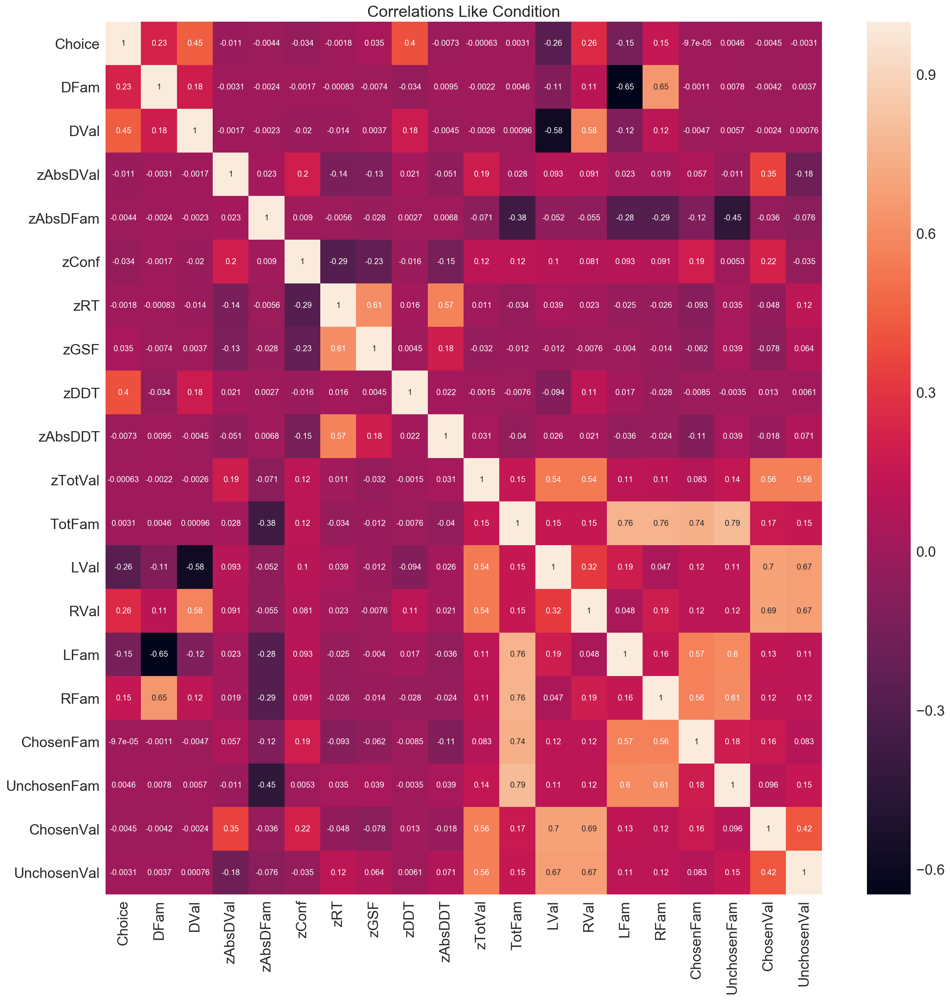

In [111]:
dataColsSelected = data_expL.loc[:, ['Choice','DFam','DVal','zAbsDVal','zAbsDFam','zConf','zRT', 'zGSF', 
                                     'zDDT', 'zAbsDDT', 'zTotVal','TotFam', 'LVal','RVal','LFam','RFam', 
                                     'ChosenFam','UnchosenFam','ChosenVal', 'UnchosenVal']]
dataColsSelected
data_corr = dataColsSelected.corr(method='pearson')
data_corr
# plot the heatmap
fig, ax = plt.subplots(figsize=(20,20))         # Sample figsize in inches
sns.heatmap(data_corr, 
       xticklabels=data_corr.columns,
       yticklabels=data_corr.columns, annot=True, annot_kws={"size": 10})

ax.set_title('Correlations Like Condition',fontsize=20)

Pearson's r = 0.19 p =  0.0


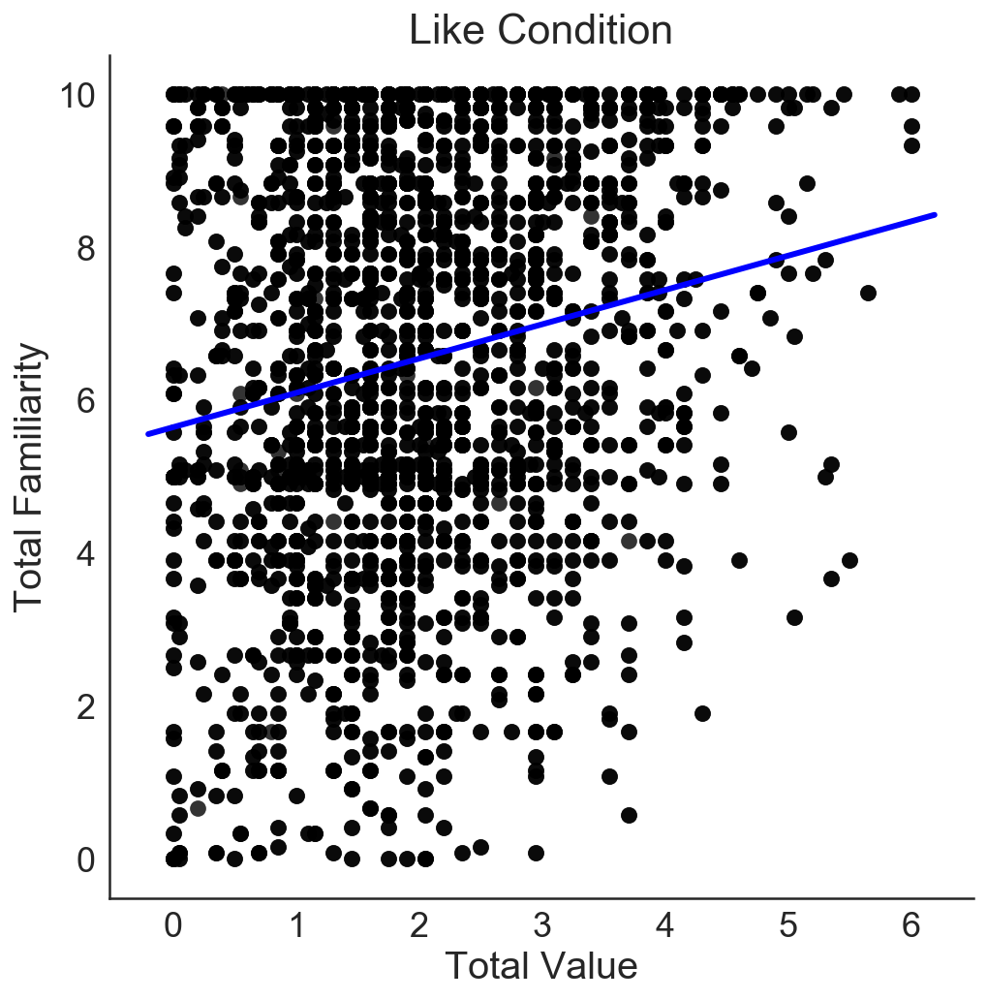

In [112]:
x_variable = 'TotVal'
x_varlabel = 'Total Value'
y_variable = 'TotFam'
y_varlabel =  'Total Familiarity'

f = plt.figure(figsize=(8, 8))
sns.set(style='white', font_scale=1.8)
ax = sns.regplot(data=data_expL, x= x_variable, y=y_variable, fit_reg=False, ci=0, color='#000000', scatter_kws={'s':70})
#sns.regplot(data=data_exp1, x='AbsDiffValue', y='Confidence', fit_reg=False, ci=0, color='Black', scatter_kws={'s':50})
ax.set(ylabel=y_varlabel, xlabel=x_varlabel)
#exp1 = mpatches.Patch(color='#000000', label='Experiment c1')
#exp2 = mpatches.Patch(color='#AAAAAA', label='Experiment 2')
#plt.legend(handles=[exp1, exp2], loc=3)
x=data_expL[x_variable]
y=data_expL[y_variable]
fit = np.polyfit(x, y, deg=1)
future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
fit_fn = np.poly1d(fit)
future_fit = np.polyval(fit_fn, future)
ax.plot(future, future_fit, color='Blue', lw=3)
sns.despine()
ax.set_title('Like Condition')

results = pearsonr(data_expL[x_variable], data_expL[y_variable])
print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))

Pearson's r = 0.121 p =  0.0


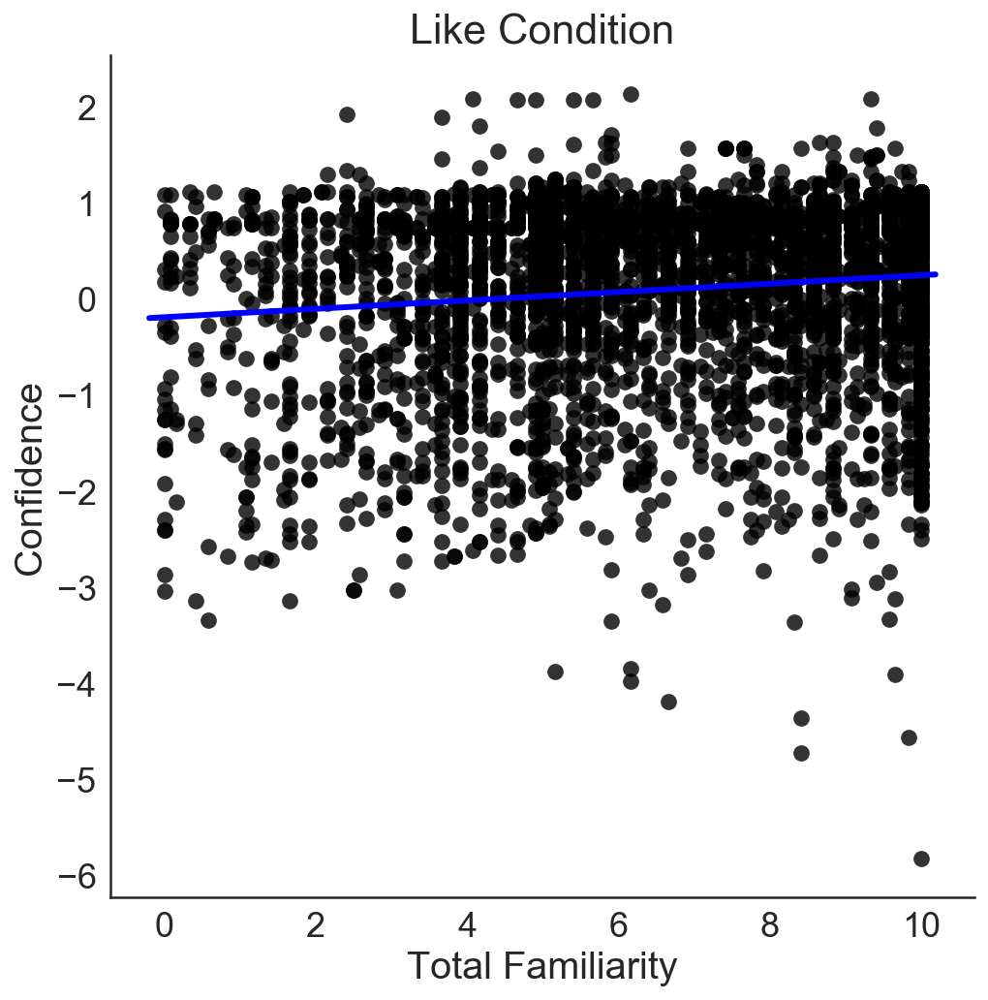

In [113]:
x_variable = 'TotFam'
x_varlabel =  'Total Familiarity'
y_variable = 'zConf'
y_varlabel =  'Confidence'

f = plt.figure(figsize=(8, 8))
sns.set(style='white', font_scale=1.8)
ax = sns.regplot(data=data_expL, x= x_variable, y=y_variable, fit_reg=False, ci=0, color='#000000', scatter_kws={'s':70})
#sns.regplot(data=data_exp1, x='AbsDiffValue', y='Confidence', fit_reg=False, ci=0, color='Black', scatter_kws={'s':50})
ax.set(ylabel=y_varlabel, xlabel=x_varlabel)
#exp1 = mpatches.Patch(color='#000000', label='Experiment c1')
#exp2 = mpatches.Patch(color='#AAAAAA', label='Experiment 2')
#plt.legend(handles=[exp1, exp2], loc=3)
x=data_expL[x_variable]
y=data_expL[y_variable]
fit = np.polyfit(x, y, deg=1)
future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
fit_fn = np.poly1d(fit)
future_fit = np.polyval(fit_fn, future)
ax.plot(future, future_fit, color='Blue', lw=3)
sns.despine()
ax.set_title('Like Condition')

results = pearsonr(data_expL[x_variable], data_expL[y_variable])
print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))

Text(0.5,1,'Like Condition')

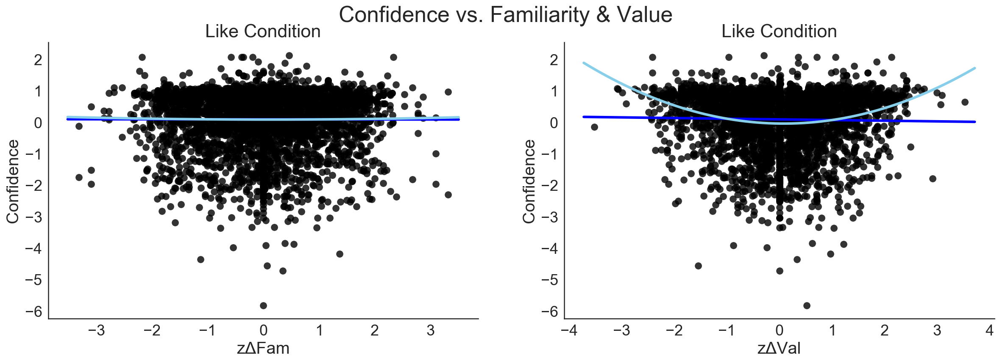

In [114]:

f = plt.figure(figsize=(20,6))
sns.set(style='white', font_scale=1.8)
plt.suptitle('Confidence vs. Familiarity & Value')

plt.subplot(121)
x_variable = 'zDFam'
x_varlabel =  'zΔFam'
y_variable = 'zConf'
y_varlabel =  'Confidence'

ax = sns.regplot(data=data_expL, x= x_variable, y=y_variable, fit_reg=False, ci=0, color='#000000', scatter_kws={'s':70})
#sns.regplot(data=data_exp1, x='AbsDiffValue', y='Confidence', fit_reg=False, ci=0, color='Black', scatter_kws={'s':50})
ax.set(ylabel=y_varlabel, xlabel=x_varlabel)

x=data_expL[x_variable]
y=data_expL[y_variable]
fit = np.polyfit(x, y, deg=1)
future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
fit_fn = np.poly1d(fit)
future_fit = np.polyval(fit_fn, future)
ax.plot(future, future_fit, color='Blue', lw=3)

fit = np.polyfit(x, y, deg=2)
fit_fn = np.poly1d(fit)
future_fit = np.polyval(fit_fn, future)
ax.plot(future, future_fit, color='skyblue', lw=3)

sns.despine()
ax.set_title('Like Condition')

#results = pearsonr(data_expL[x_variable], data_expL[y_variable])
#print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))

plt.subplot(122)
x_variable = 'zDVal'
x_varlabel =  'zΔVal'
y_variable = 'zConf'
y_varlabel =  'Confidence'

ax = sns.regplot(data=data_expL, x= x_variable, y=y_variable, fit_reg=False, ci=0, color='#000000', scatter_kws={'s':70})
#sns.regplot(data=data_exp1, x='AbsDiffValue', y='Confidence', fit_reg=False, ci=0, color='Black', scatter_kws={'s':50})
ax.set(ylabel=y_varlabel, xlabel=x_varlabel)
#exp1 = mpatches.Patch(color='#000000', label='Experiment c1')
#exp2 = mpatches.Patch(color='#AAAAAA', label='Experiment 2')
#plt.legend(handles=[exp1, exp2], loc=3)
x=data_expL[x_variable]
y=data_expL[y_variable]
fit = np.polyfit(x, y, deg=1)
future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
fit_fn = np.poly1d(fit)
future_fit = np.polyval(fit_fn, future)
ax.plot(future, future_fit, color='Blue', lw=3)

fit = np.polyfit(x, y, deg=2)
fit_fn = np.poly1d(fit)
future_fit = np.polyval(fit_fn, future)
ax.plot(future, future_fit, color='skyblue', lw=3)

sns.despine()
ax.set_title('Like Condition')

#results = pearsonr(data_expL[x_variable], data_expL[y_variable])
#print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))

## Dislike Condition Only

In [115]:
data_expD = data_exp1.loc[data_exp1['BlockCond'] == 2] # 1 = Like, 2 = Dislike

### Insert the variables to calculate the correlation

In [116]:
x_variable = 'zAbsDVal'
x_varlabel = '|zΔV|'
y_variable = 'zRT'
y_varlabel =  'RT'

Pearson's r = -0.125 p =  0.0


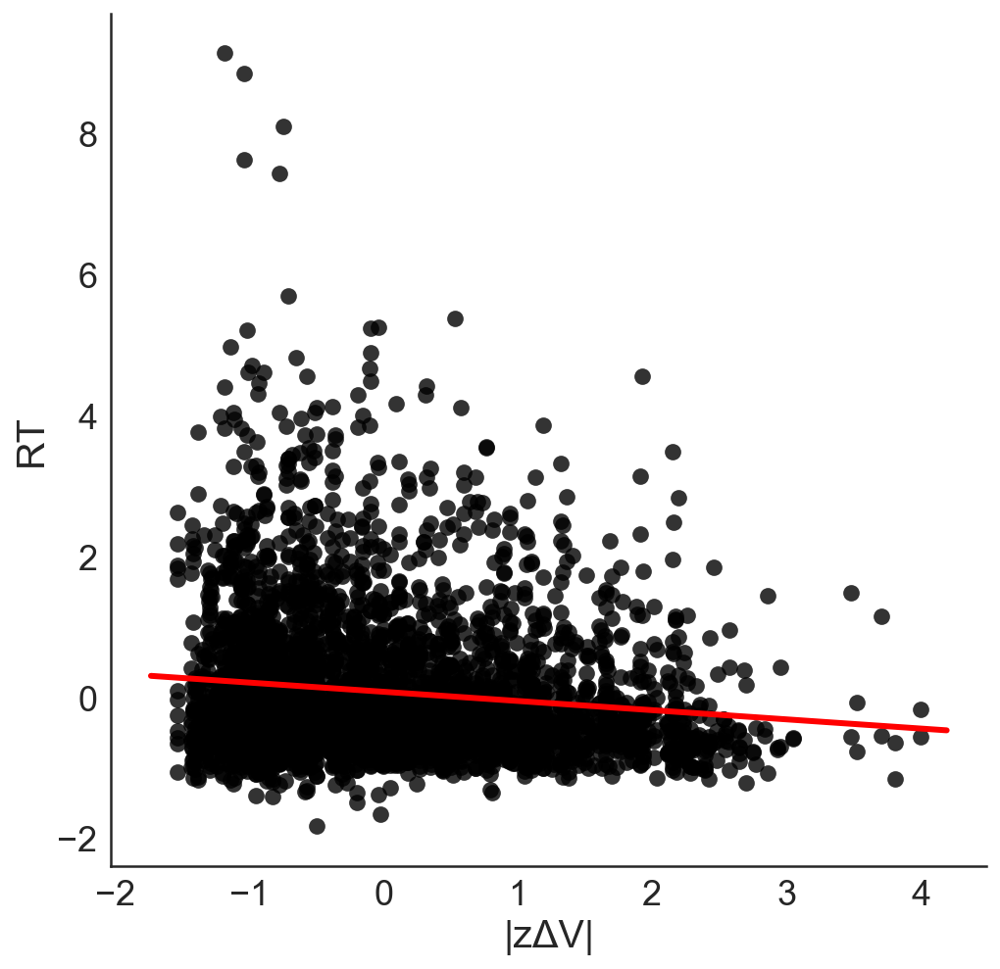

In [117]:
f = plt.figure(figsize=(8, 8))
sns.set(style='white', font_scale=1.8)
ax = sns.regplot(data=data_expD, x= x_variable, y=y_variable, fit_reg=False, ci=0, color='#000000', scatter_kws={'s':70})
#sns.regplot(data=data_exp1, x='AbsDiffValue', y='Confidence', fit_reg=False, ci=0, color='Black', scatter_kws={'s':50})
ax.set(ylabel=y_varlabel, xlabel=x_varlabel)
#exp1 = mpatches.Patch(color='#000000', label='Experiment c1')
#exp2 = mpatches.Patch(color='#AAAAAA', label='Experiment 2')
#plt.legend(handles=[exp1, exp2], loc=3)
x=data_expD[x_variable]
y=data_expD[y_variable]
fit = np.polyfit(x, y, deg=1)
future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
fit_fn = np.poly1d(fit)
future_fit = np.polyval(fit_fn, future)
ax.plot(future, future_fit, color='Red', lw=3)
sns.despine()

results = pearsonr(data_expD[x_variable], data_expD[y_variable])
print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))

Text(0.5,1,'Correlations Dislike Condition')

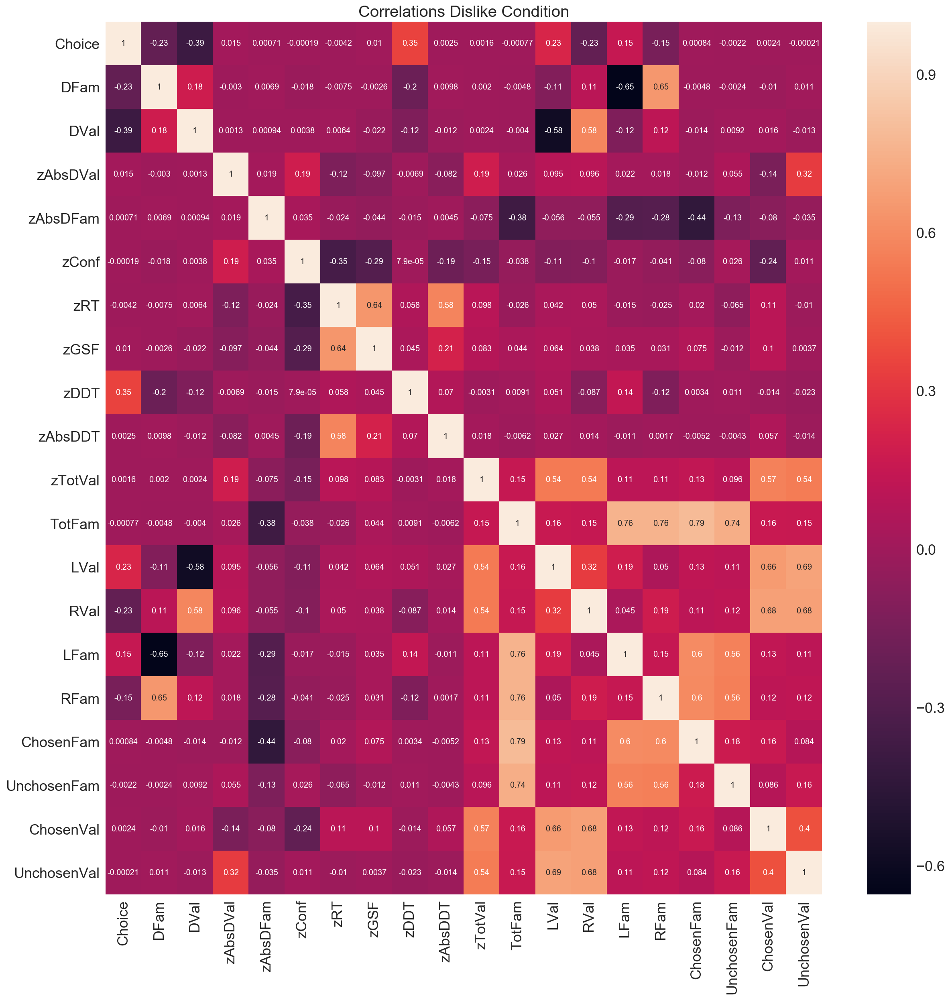

In [118]:
dataColsSelected = data_expD.loc[:, ['Choice','DFam','DVal','zAbsDVal','zAbsDFam','zConf','zRT', 'zGSF', 
                                     'zDDT', 'zAbsDDT', 'zTotVal','TotFam', 'LVal','RVal','LFam','RFam', 
                                     'ChosenFam','UnchosenFam','ChosenVal', 'UnchosenVal']]
dataColsSelected
data_corr = dataColsSelected.corr(method='pearson')
data_corr
# plot the heatmap
fig, ax = plt.subplots(figsize=(20,20))         # Sample figsize in inches
sns.heatmap(data_corr, 
       xticklabels=data_corr.columns,
       yticklabels=data_corr.columns, annot=True, annot_kws={"size": 10})

ax.set_title('Correlations Dislike Condition',fontsize=20)

Pearson's r = 0.19 p =  0.0


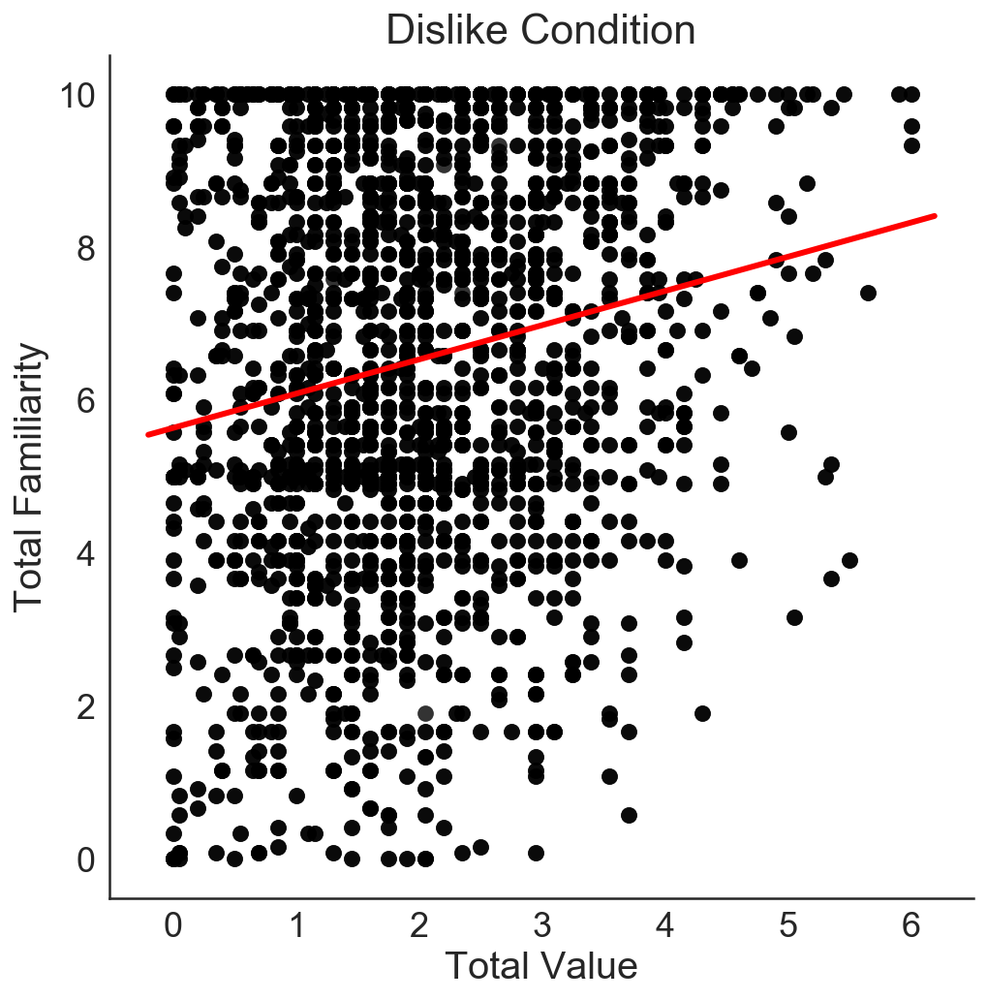

In [119]:
x_variable = 'TotVal'
x_varlabel = 'Total Value'
y_variable = 'TotFam'
y_varlabel =  'Total Familiarity'

f = plt.figure(figsize=(8, 8))
sns.set(style='white', font_scale=1.8)
ax = sns.regplot(data=data_expD, x= x_variable, y=y_variable, fit_reg=False, ci=0, color='#000000', scatter_kws={'s':70})
#sns.regplot(data=data_exp1, x='AbsDiffValue', y='Confidence', fit_reg=False, ci=0, color='Black', scatter_kws={'s':50})
ax.set(ylabel=y_varlabel, xlabel=x_varlabel)
#exp1 = mpatches.Patch(color='#000000', label='Experiment c1')
#exp2 = mpatches.Patch(color='#AAAAAA', label='Experiment 2')
#plt.legend(handles=[exp1, exp2], loc=3)
x=data_expD[x_variable]
y=data_expD[y_variable]
fit = np.polyfit(x, y, deg=1)
future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
fit_fn = np.poly1d(fit)
future_fit = np.polyval(fit_fn, future)
ax.plot(future, future_fit, color='Red', lw=3)
sns.despine()
ax.set_title('Dislike Condition')

results = pearsonr(data_expD[x_variable], data_expD[y_variable])
print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))

Pearson's r = -0.038 p =  0.019


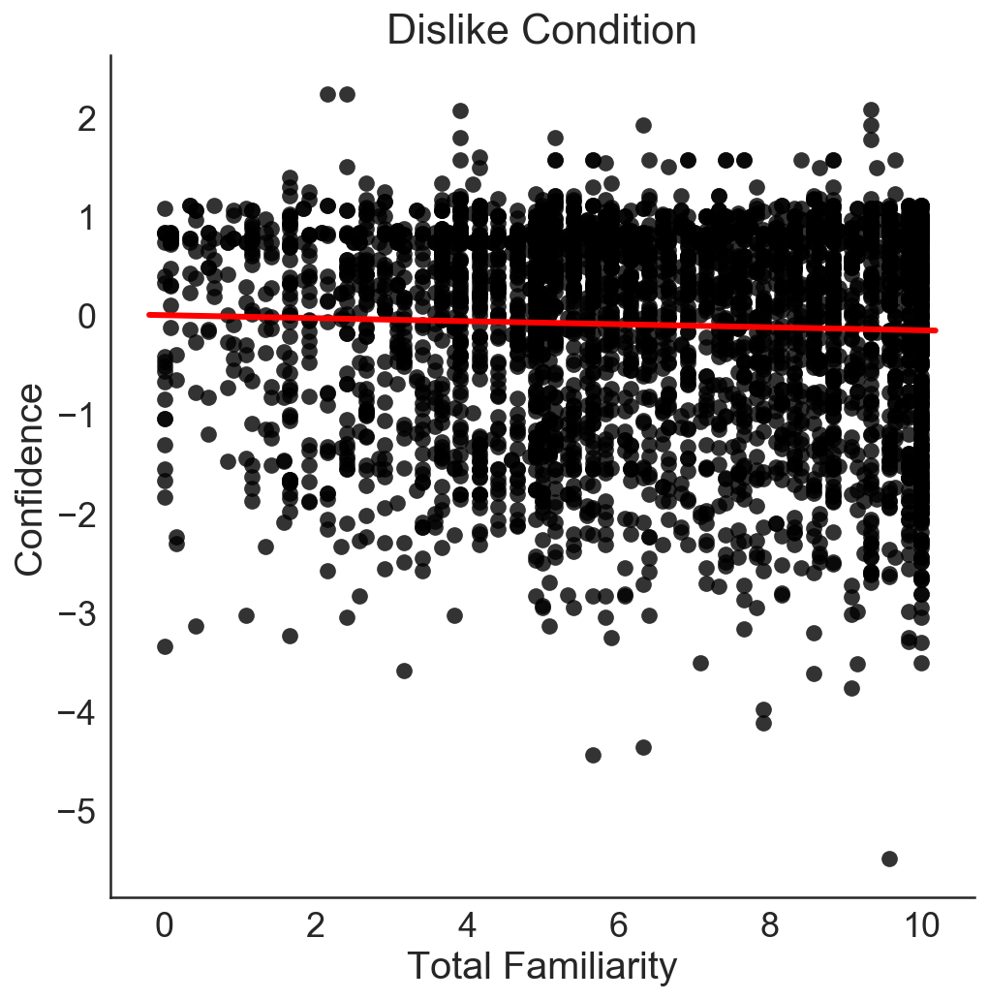

In [120]:
x_variable = 'TotFam'
x_varlabel =  'Total Familiarity'
y_variable = 'zConf'
y_varlabel =  'Confidence'

f = plt.figure(figsize=(8, 8))
sns.set(style='white', font_scale=1.8)
ax = sns.regplot(data=data_expD, x= x_variable, y=y_variable, fit_reg=False, ci=0, color='#000000', scatter_kws={'s':70})
#sns.regplot(data=data_exp1, x='AbsDiffValue', y='Confidence', fit_reg=False, ci=0, color='Black', scatter_kws={'s':50})
ax.set(ylabel=y_varlabel, xlabel=x_varlabel)
#exp1 = mpatches.Patch(color='#000000', label='Experiment c1')
#exp2 = mpatches.Patch(color='#AAAAAA', label='Experiment 2')
#plt.legend(handles=[exp1, exp2], loc=3)
x=data_expD[x_variable]
y=data_expD[y_variable]
fit = np.polyfit(x, y, deg=1)
future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
fit_fn = np.poly1d(fit)
future_fit = np.polyval(fit_fn, future)
ax.plot(future, future_fit, color='Red', lw=3)
sns.despine()
ax.set_title('Dislike Condition')

results = pearsonr(data_expD[x_variable], data_expD[y_variable])
print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))

Text(0.5,1,'Dislike Condition')

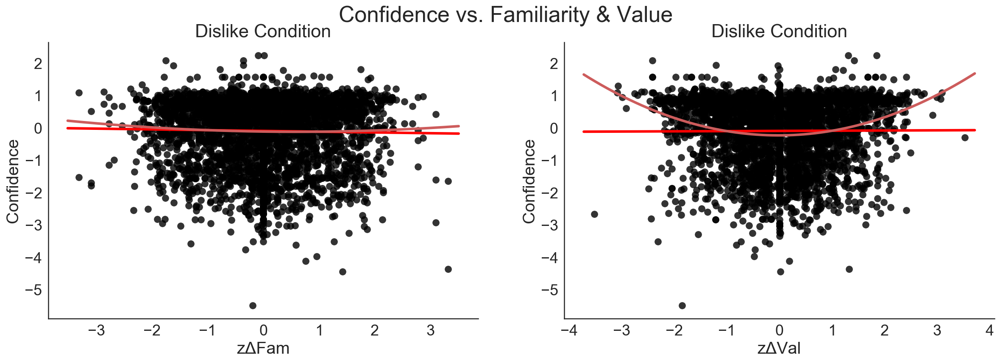

In [121]:

f = plt.figure(figsize=(20,6))
sns.set(style='white', font_scale=1.8)
plt.suptitle('Confidence vs. Familiarity & Value')

plt.subplot(121)
x_variable = 'zDFam'
x_varlabel =  'zΔFam'
y_variable = 'zConf'
y_varlabel =  'Confidence'

ax = sns.regplot(data=data_expD, x= x_variable, y=y_variable, fit_reg=False, ci=0, color='#000000', scatter_kws={'s':70})
#sns.regplot(data=data_exp1, x='AbsDiffValue', y='Confidence', fit_reg=False, ci=0, color='Black', scatter_kws={'s':50})
ax.set(ylabel=y_varlabel, xlabel=x_varlabel)

x=data_expD[x_variable]
y=data_expD[y_variable]
fit = np.polyfit(x, y, deg=1)
future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
fit_fn = np.poly1d(fit)
future_fit = np.polyval(fit_fn, future)
ax.plot(future, future_fit, color='Red', lw=3)

fit = np.polyfit(x, y, deg=2)
fit_fn = np.poly1d(fit)
future_fit = np.polyval(fit_fn, future)
ax.plot(future, future_fit, color='indianred', lw=3)

sns.despine()
ax.set_title('Dislike Condition')

#results = pearsonr(data_expD[x_variable], data_expD[y_variable])
#print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))

plt.subplot(122)
x_variable = 'zDVal'
x_varlabel =  'zΔVal'
y_variable = 'zConf'
y_varlabel =  'Confidence'

ax = sns.regplot(data=data_expD, x= x_variable, y=y_variable, fit_reg=False, ci=0, color='#000000', scatter_kws={'s':70})
#sns.regplot(data=data_exp1, x='AbsDiffValue', y='Confidence', fit_reg=False, ci=0, color='Black', scatter_kws={'s':50})
ax.set(ylabel=y_varlabel, xlabel=x_varlabel)
#exp1 = mpatches.Patch(color='#000000', label='Experiment c1')
#exp2 = mpatches.Patch(color='#AAAAAA', label='Experiment 2')
#plt.legend(handles=[exp1, exp2], loc=3)
x=data_expD[x_variable]
y=data_expD[y_variable]
fit = np.polyfit(x, y, deg=1)
future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
fit_fn = np.poly1d(fit)
future_fit = np.polyval(fit_fn, future)
ax.plot(future, future_fit, color='Red', lw=3)

fit = np.polyfit(x, y, deg=2)
fit_fn = np.poly1d(fit)
future_fit = np.polyval(fit_fn, future)
ax.plot(future, future_fit, color='indianred', lw=3)

sns.despine()
ax.set_title('Dislike Condition')

#results = pearsonr(data_expD[x_variable], data_expD[y_variable])
#print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))

## [Go to Logistic plots for Familiarity ](#logisticFam)

<a id='log'></a>
# 2. Logistic Plots

<a id='logisticVal'></a>
## 2.1. Difference in value (DV) is calculated as (Value_Right  - Value_Left)

## Like Condition

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Low measure:logit coef = [[0.76966156]] ; Intercept:  [0.03627869]
high measure:logit coef = [[1.63392185]] ; Intercept:  [-0.05144388]


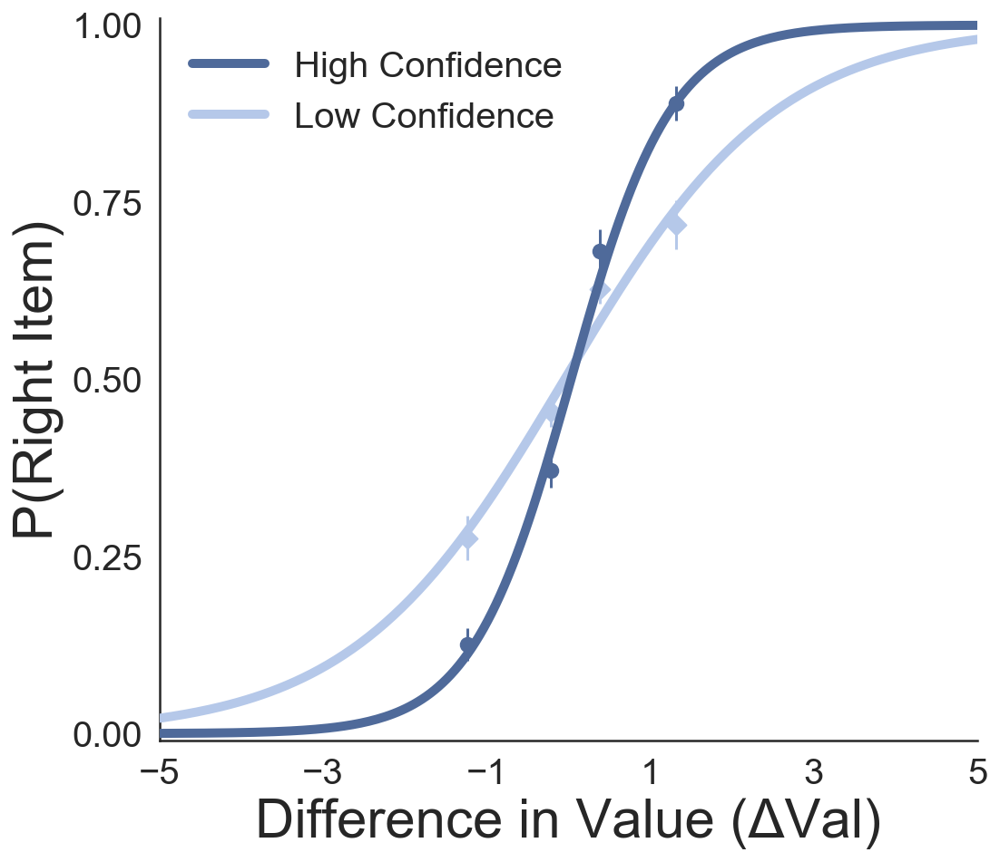

In [113]:
# Split by high/low conf
logisticplot_all('ConfSplit', 'High Confidence', 'Low Confidence', data=data_expL, xaxis='zDVal', yaxis='Choice', ylab='P(Right Item)', xlab='Difference in Value (ΔVal)',
                 modhighcol='#4F6A9A', modlowcol='#B5C8E9', title='empty', parvar='Part')
plt.tight_layout()
plt.savefig('SavedFigures/LogisticChoiceLike_31.svg', format='svg', dpi = 500 )

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Low measure:logit coef = [[1.37381472]] ; Intercept:  [-0.07371604]
high measure:logit coef = [[1.02074213]] ; Intercept:  [0.05601984]


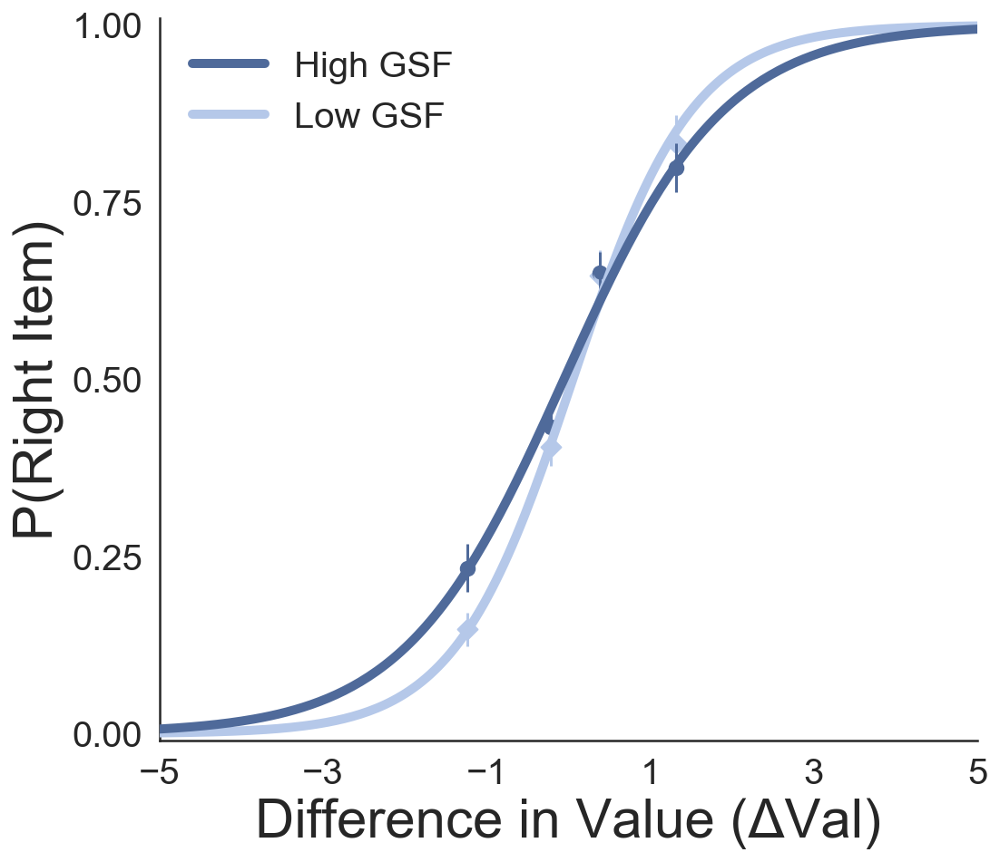

In [114]:
# Split by high/low gaze shift frequency
logisticplot_all('GSFSplit', 'High GSF', 'Low GSF', data=data_expL, xaxis='zDVal', yaxis='Choice', ylab='P(Right Item)', xlab='Difference in Value (ΔVal)',
                 modhighcol='#4F6A9A', modlowcol='#B5C8E9', title='empty', parvar='Part')
plt.tight_layout()

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Low measure:logit coef = [[1.12284662]] ; Intercept:  [-1.06804324]
high measure:logit coef = [[1.16446368]] ; Intercept:  [1.0638124]


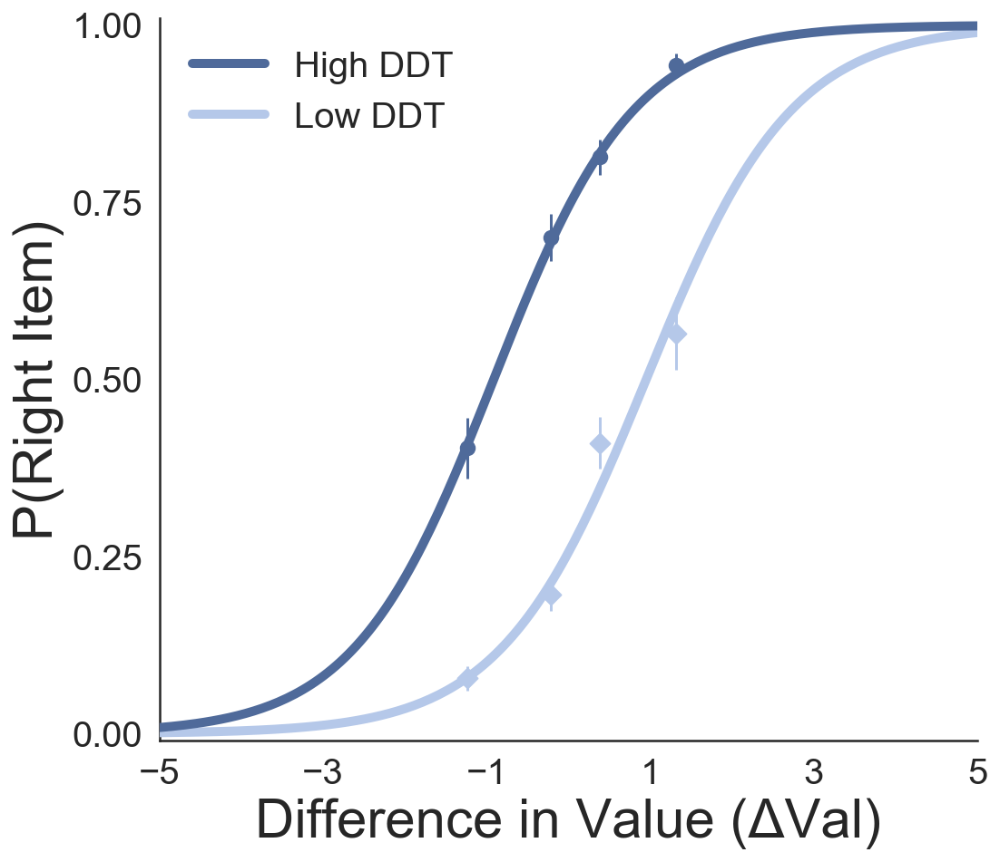

In [115]:
# Split by high/low dwelling time
logisticplot_all('DDTSplit', 'High DDT', 'Low DDT', data=data_expL, xaxis='zDVal', yaxis='Choice', ylab='P(Right Item)', xlab='Difference in Value (ΔVal)',
                 modhighcol='#4F6A9A', modlowcol='#B5C8E9', title='empty', parvar='Part')
plt.tight_layout()

In [116]:
##absolute DDT
#logisticplot_all('absDDTMedSplit', 'High absDDT', 'Low absDDT', data=data_expL
#            , xaxis='zDV', yaxis='ChosenITM', ylab='P(Right Item)', xlab='Difference in Value (DV)',
#                 modhighcol='#000000', modlowcol='#AAAAAA', title='empty', parvar='Part')
#plt.tight_layout()

## Dislike Condition

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Low measure:logit coef = [[-0.6429241]] ; Intercept:  [-0.00475908]
high measure:logit coef = [[-1.36317263]] ; Intercept:  [0.02886479]


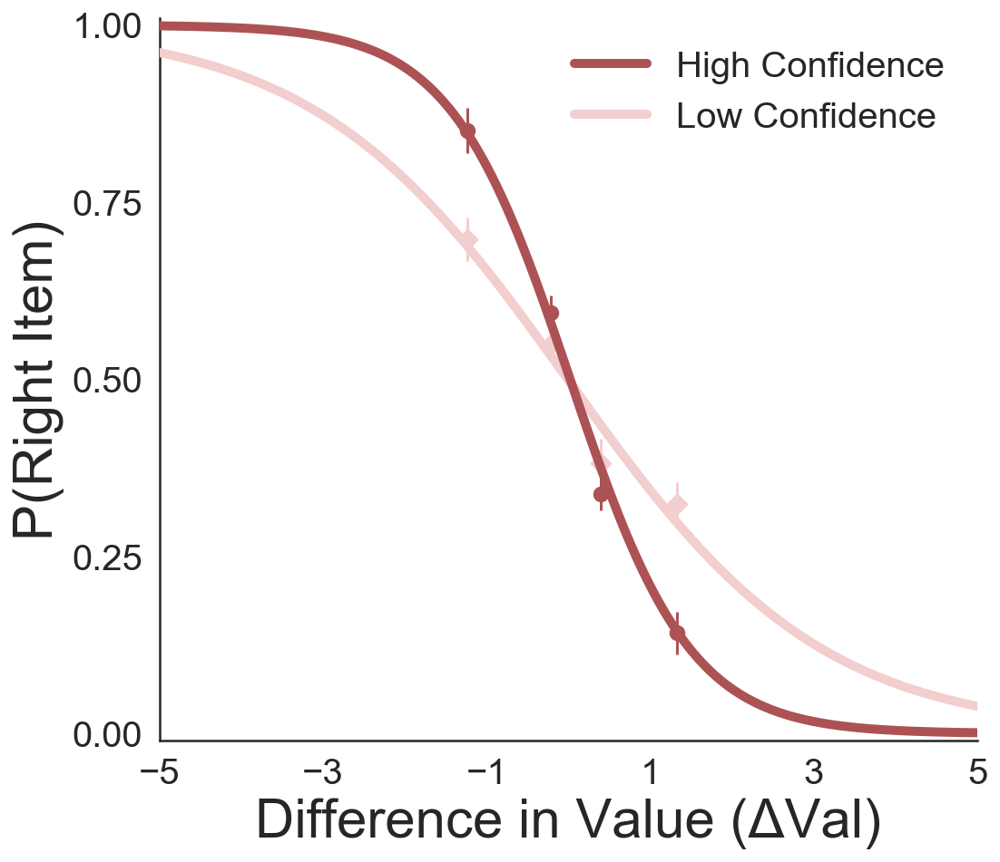

In [117]:
# Split by high/low conf
logisticplot_all('ConfSplit', 'High Confidence', 'Low Confidence', data=data_expD, xaxis='zDVal', yaxis='Choice', ylab='P(Right Item)', xlab='Difference in Value (ΔVal)',
                 modhighcol='#AC5255', modlowcol='#F2CECF', title='empty', parvar='Part')
plt.tight_layout()
plt.savefig('SavedFigures/LogisticChoiceDislike1_31.svg', format='svg', dpi = 500 )

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Low measure:logit coef = [[-1.08241453]] ; Intercept:  [-0.00266759]
high measure:logit coef = [[-0.93753489]] ; Intercept:  [0.02809578]


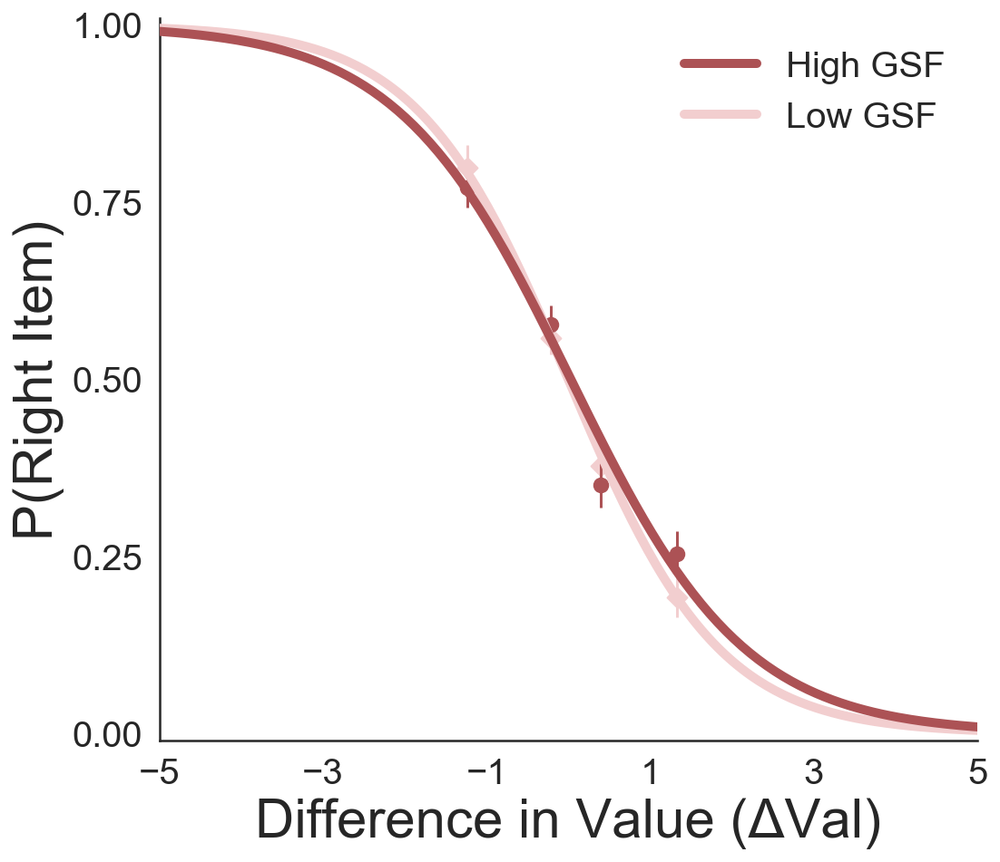

In [118]:
# Split by high/low gaze shift frequency
logisticplot_all('GSFSplit', 'High GSF', 'Low GSF', data=data_expD, xaxis='zDVal', yaxis='Choice', ylab='P(Right Item)', xlab='Difference in Value (ΔVal)',
                 modhighcol='#AC5255', modlowcol='#F2CECF', title='empty', parvar='Part')
plt.tight_layout()

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Low measure:logit coef = [[-1.03369148]] ; Intercept:  [-1.06393854]
high measure:logit coef = [[-0.92731]] ; Intercept:  [1.08798738]


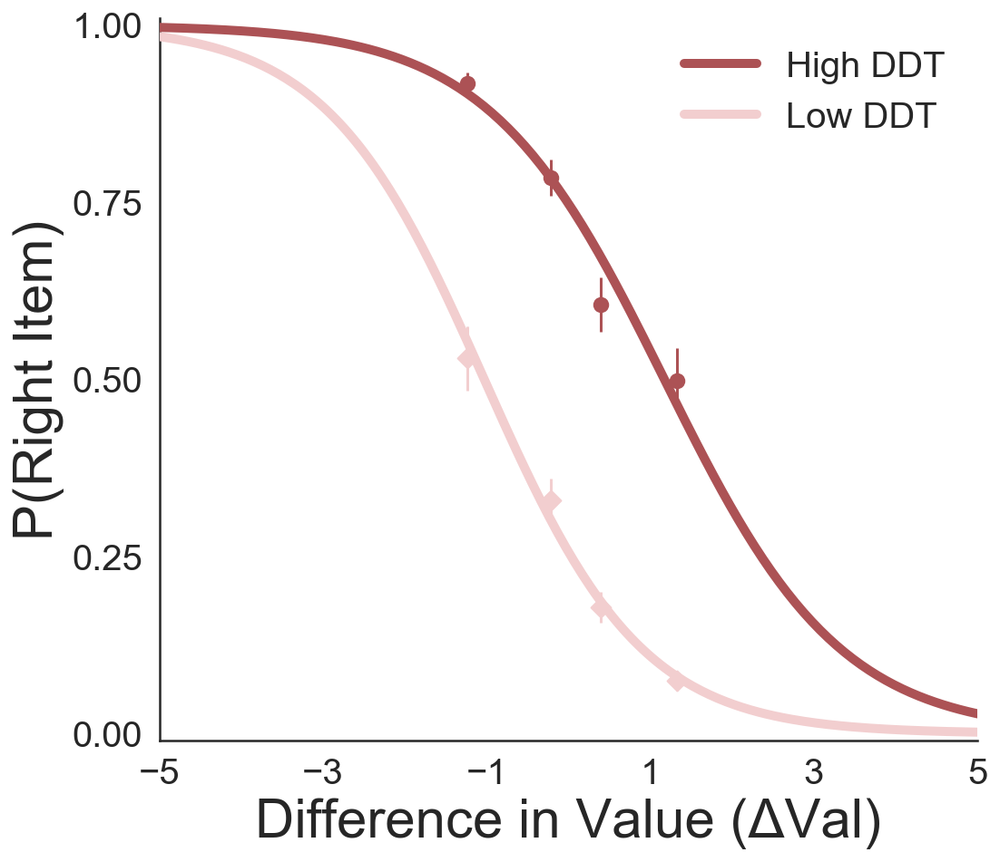

In [119]:
# Split by high/low dwelling time
logisticplot_all('DDTSplit', 'High DDT', 'Low DDT', data=data_expD, xaxis='zDVal', yaxis='Choice', ylab='P(Right Item)', xlab='Difference in Value (ΔVal)',
                 modhighcol='#AC5255', modlowcol='#F2CECF', title='empty', parvar='Part')
plt.tight_layout()

<a id='logisticFam'></a>
## Difference in familiarity (DV) is calculated as (Fam_Right  - Fam_Left)

## Like Condition

Low measure coef [[0.2592563]]
High measure coef [[0.75492415]]


/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


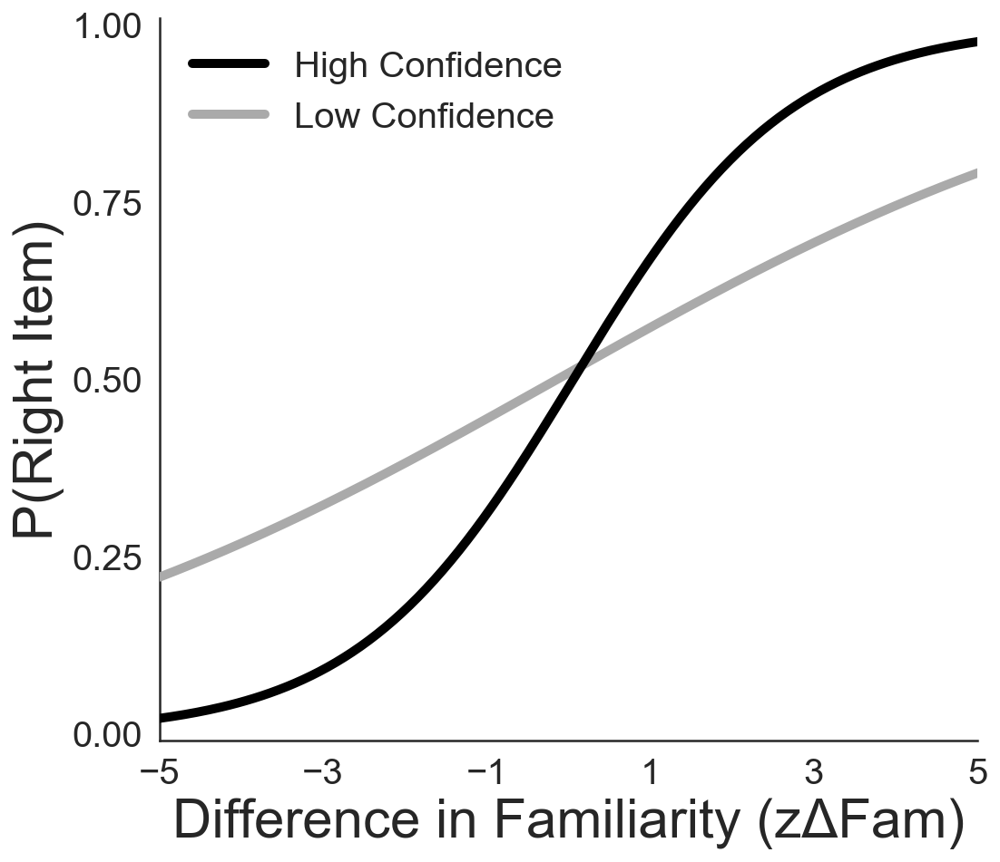

In [120]:
# Split by high/low conf
logisticplot_simpl('ConfSplit', 'High Confidence', 'Low Confidence', data=data_expL, xaxis='zDFam', yaxis='Choice', ylab='P(Right Item)', xlab='Difference in Familiarity (zΔFam)',
                 modhighcol='#000000', modlowcol='#AAAAAA', title='empty', parvar='Part')
plt.tight_layout()

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Low measure coef [[0.60181158]]
High measure coef [[0.37787021]]


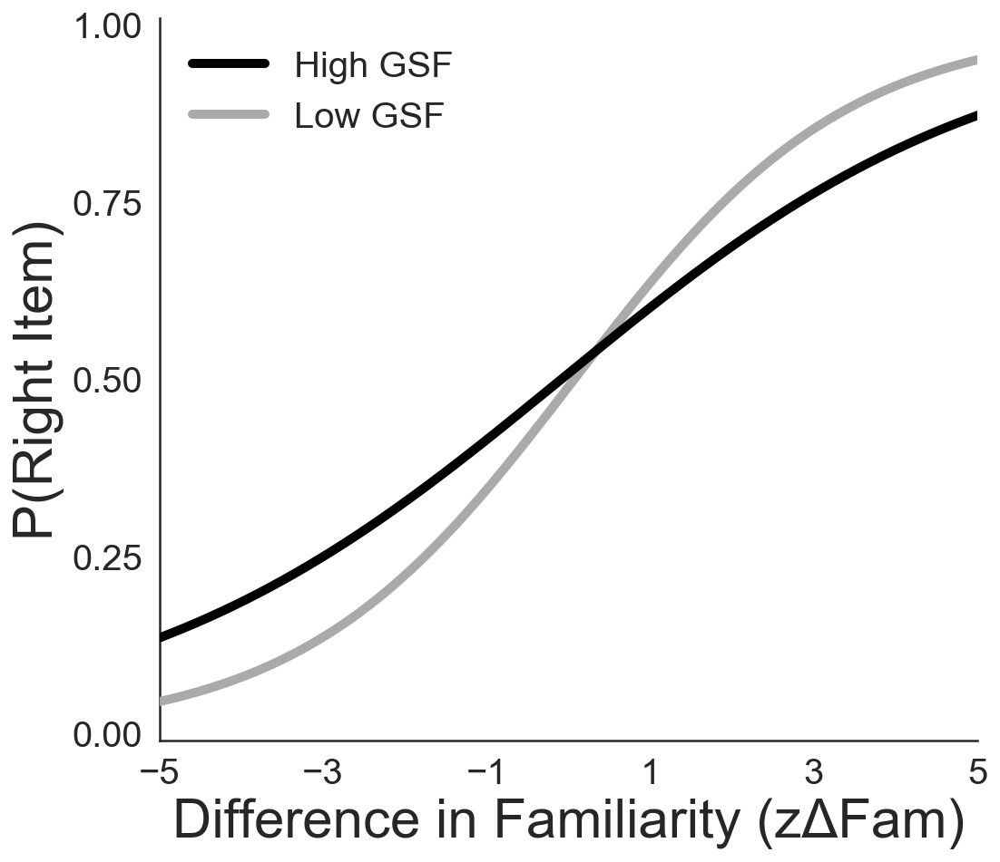

In [121]:
# Split by high/low gaze shift frequency
logisticplot_simpl('GSFSplit', 'High GSF', 'Low GSF', data=data_expL, xaxis='zDFam', yaxis='Choice', ylab='P(Right Item)', xlab='Difference in Familiarity (zΔFam)',
                 modhighcol='#000000', modlowcol='#AAAAAA', title='empty', parvar='Part')
plt.tight_layout()

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Low measure coef [[0.5473723]]
High measure coef [[0.63151156]]


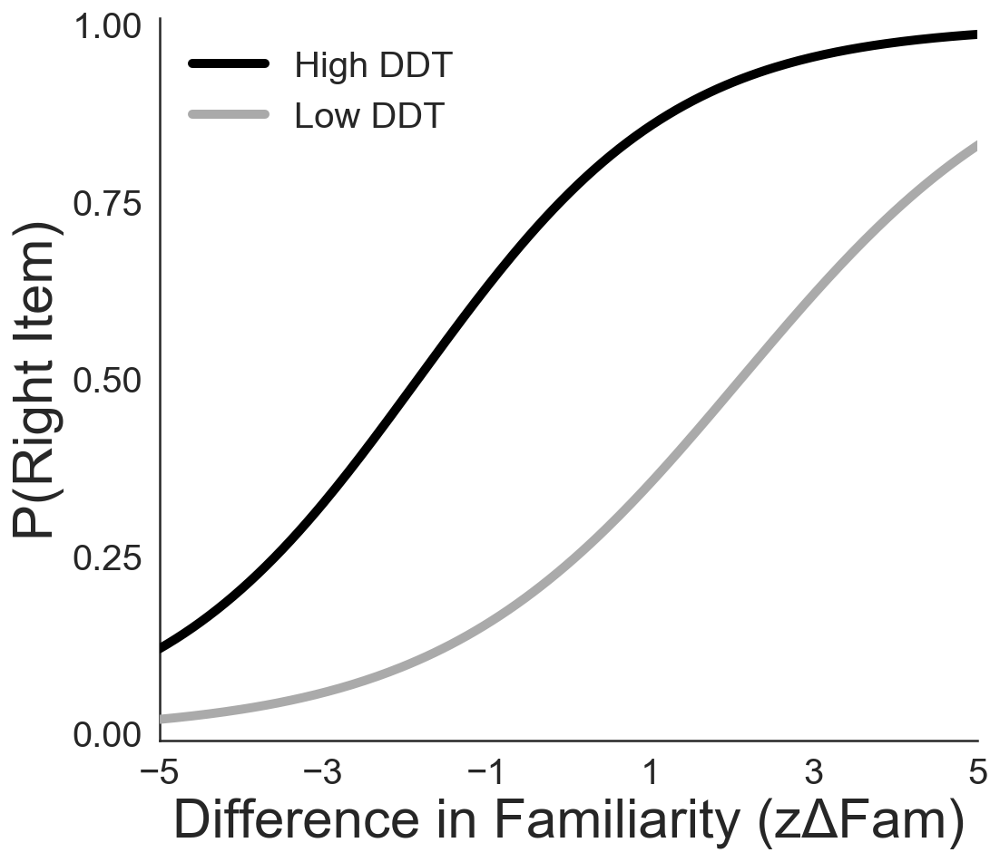

In [122]:
# Split by high/low dwelling time
logisticplot_simpl('DDTSplit', 'High DDT', 'Low DDT', data=data_expL, xaxis='zDFam', yaxis='Choice', ylab='P(Right Item)', xlab='Difference in Familiarity (zΔFam)',
                 modhighcol='#000000', modlowcol='#AAAAAA', title='empty', parvar='Part')
plt.tight_layout()

## Dislike Condition

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Low measure coef [[-0.35283271]]
High measure coef [[-0.59240494]]


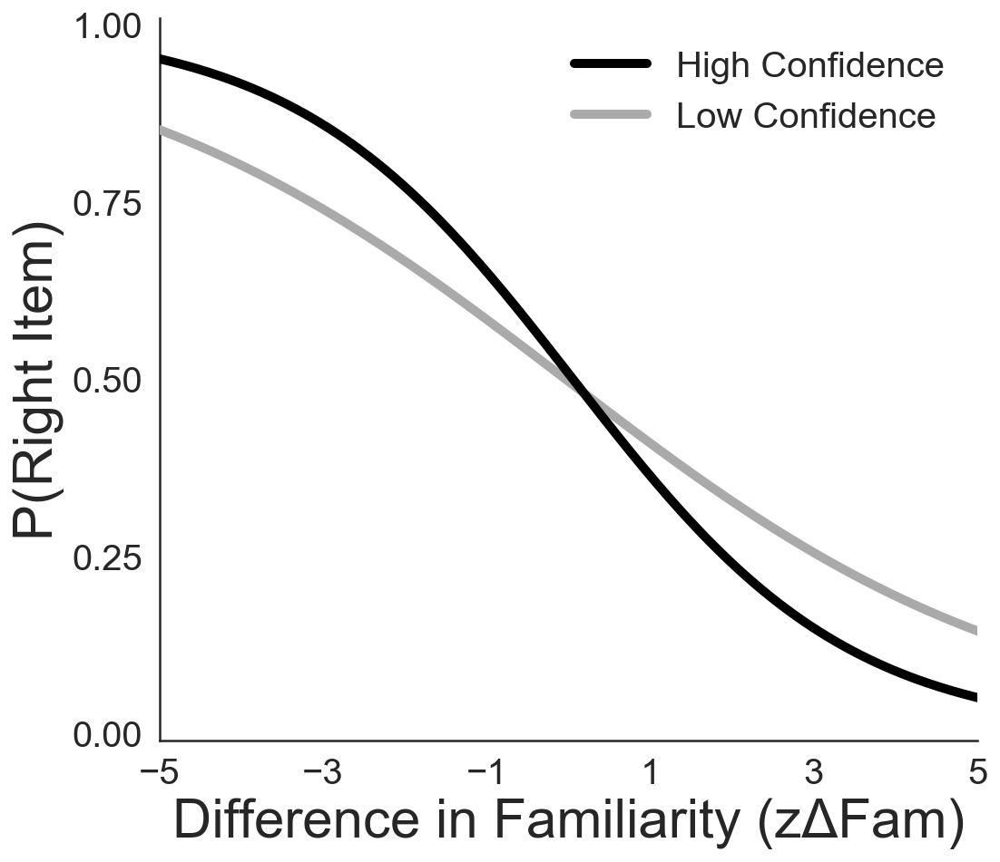

In [123]:
# Split by high/low conf
logisticplot_simpl('ConfSplit', 'High Confidence', 'Low Confidence', data=data_expD, xaxis='zDFam', yaxis='Choice', ylab='P(Right Item)', xlab='Difference in Familiarity (zΔFam)',
                 modhighcol='#000000', modlowcol='#AAAAAA', title='empty', parvar='Part')
plt.tight_layout()

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Low measure coef [[-0.60087139]]
High measure coef [[-0.34747485]]


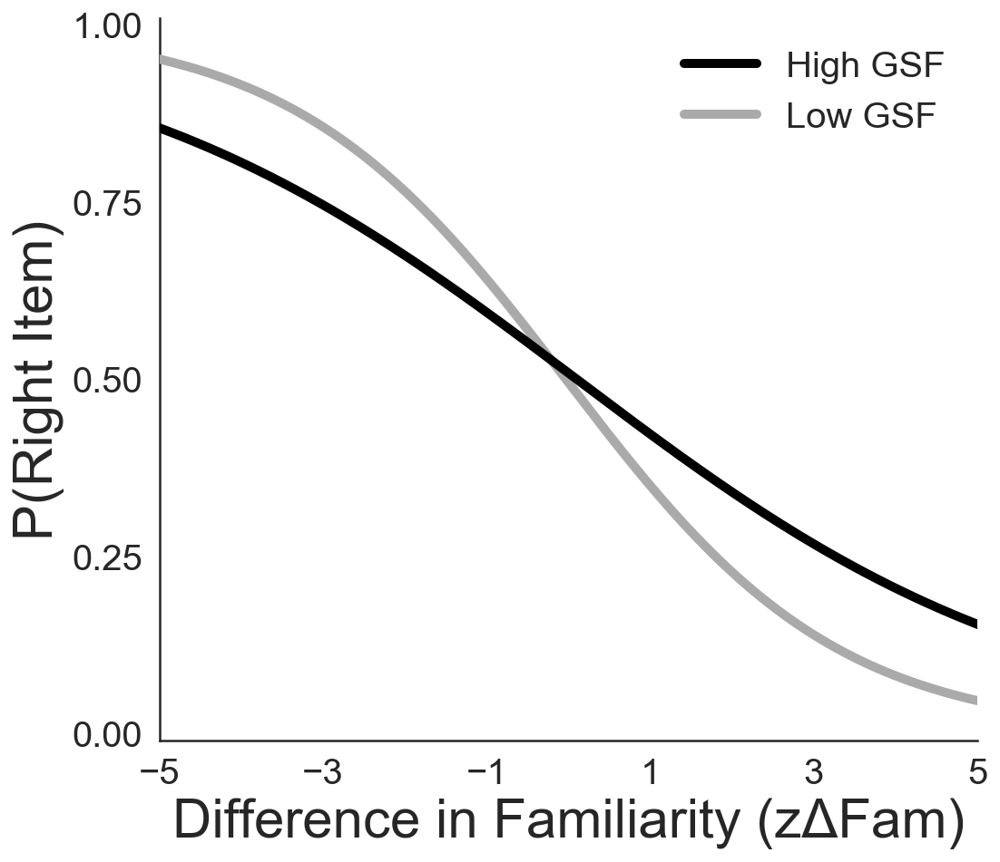

In [124]:
# Split by high/low gaze shift frequency
logisticplot_simpl('GSFSplit', 'High GSF', 'Low GSF', data=data_expD, xaxis='zDFam', yaxis='Choice', ylab='P(Right Item)', xlab='Difference in Familiarity (zΔFam)',
                 modhighcol='#000000', modlowcol='#AAAAAA', title='empty', parvar='Part')
plt.tight_layout()

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Low measure coef [[-0.33720698]]
High measure coef [[-0.35836013]]


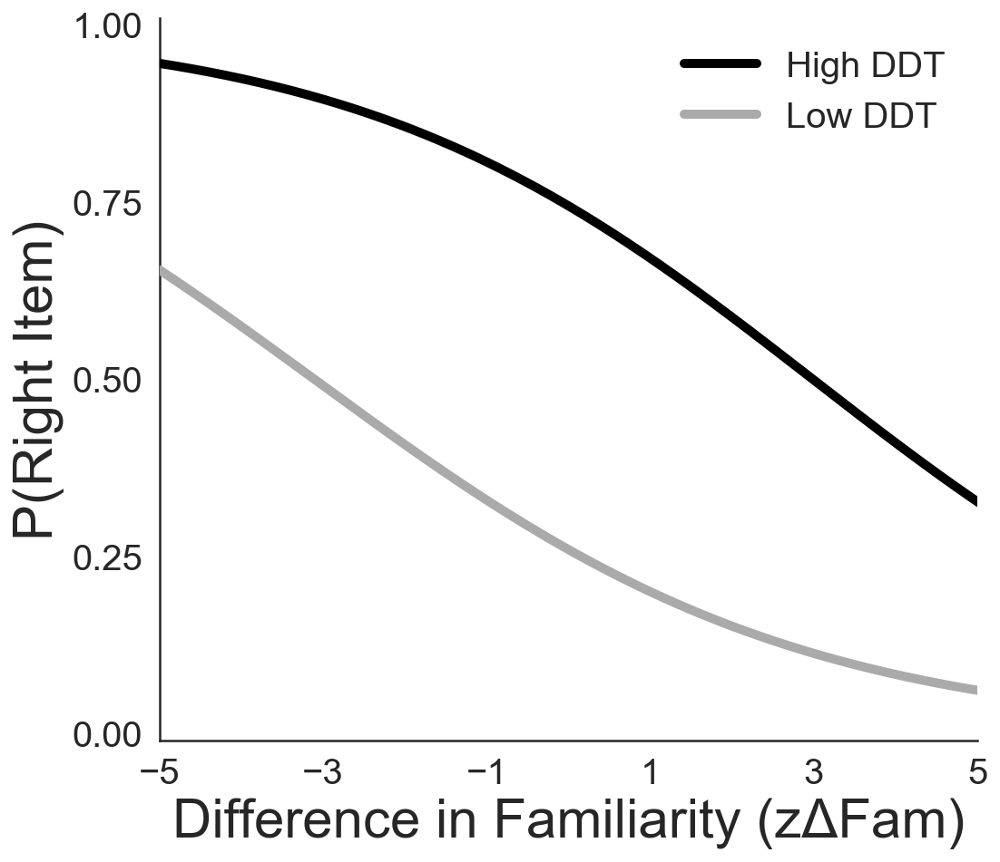

In [125]:
# Split by high/low dwelling time

logisticplot_simpl('DDTSplit', 'High DDT', 'Low DDT', data=data_expD, xaxis='zDFam', yaxis='Choice', ylab='P(Right Item)', xlab='Difference in Familiarity (zΔFam)',
                 modhighcol='#000000', modlowcol='#AAAAAA', title='empty', parvar='Part')
plt.tight_layout()

## [Go to Regression plots for Familiarity ](#regressionFam)

# Check logistic regression values for individual participants (Confidence Split)

## Like + Dislike Condition

## Like Condition

In [126]:
coeficientes_like = logisticplot_all_sbj_slope('ConfSplit', 'High Conf', 'Low Conf', data=data_expL, xaxis='zDVal', yaxis='Choice', ylab='P(Right Item)', xlab='DVal',
                 modhighcol='#4F6A9A', modlowcol='#B5C8E9', title='empty', parvar='Part')
plt.tight_layout()

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/p

## Dislike Condition

In [127]:
coeficientes_dislike = logisticplot_all_sbj_slope('ConfSplit', 'High Confidence', 'Low Confidence', data=data_expD, xaxis='zDVal', yaxis='Choice', ylab='P(Right Item)', xlab='Difference in Value (DVal)',
                 modhighcol='#AC5255', modlowcol='#F2CECF', title='empty', parvar='Part')
plt.tight_layout()

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/pradyumna/anaconda3/lib/p

In [128]:
like_slopes = coeficientes_like['All Coef'].values
dislike_slopes = coeficientes_dislike['All Coef'].values

In [129]:
def ttestsPlot(data1, data2,c1 ='#4F6A9A',c2 = '#AC5255',lab1 = "Like", lab2 = "Dislike",title = ''):

    # t-TEST
    diff = mean(data1) - mean(data2)
    [s, p] = stats.ttest_rel(data1,data2)
    print ("ChoiceSlopes: MeanL = "+ str(mean(data1))+ "; MeanD = "+ str(mean(data2))+"; [Like - Dislike] =  " + str(diff) +"; t =  " + str(round(s,2)) + " ; p-value =" + str(p) )
    
        
    # PLOT LIKE AND DISLIKE VARIABILITY
        
    # Set seaborn style for the plot
    fig = plt.figure(figsize=[6,10])
    sns.set(style='white',font_scale=1.5)
    jittr = np.random.uniform(low=-0.3,high=0.3,size=len(data1))    
    plt.scatter([1]*len(data1)+jittr, data1, c= c1, alpha=0.7,label=lab1)
    plt.scatter([2]*len(data2)+jittr, data2, c= c2, alpha=0.7,label=lab2)
    
    ## add lines between slope points in like and dislike for each participant
    
    for i in range(len(data1)):
        plt.plot( [1 + jittr[i],2 + jittr[i]], [ data1[i] , data2[i]],'--', lw=1.0, color = 'black', alpha = 0.2)
        if data1[i]<data2[i]:
            print ("Participants with slope in Like < Dislike: " + str(i))
            
    
    #legend(loc = 'best')
    plt.xticks([1, 2,], [lab1, lab2],fontsize=18)
    plt.ylabel(title, fontsize=18)
    sns.despine()

ChoiceSlopes: MeanL = 1.6371717753258628; MeanD = -1.3210907772589249; [Like - Dislike] =  2.9582625525847877; t =  8.14 ; p-value =4.416003076086436e-09


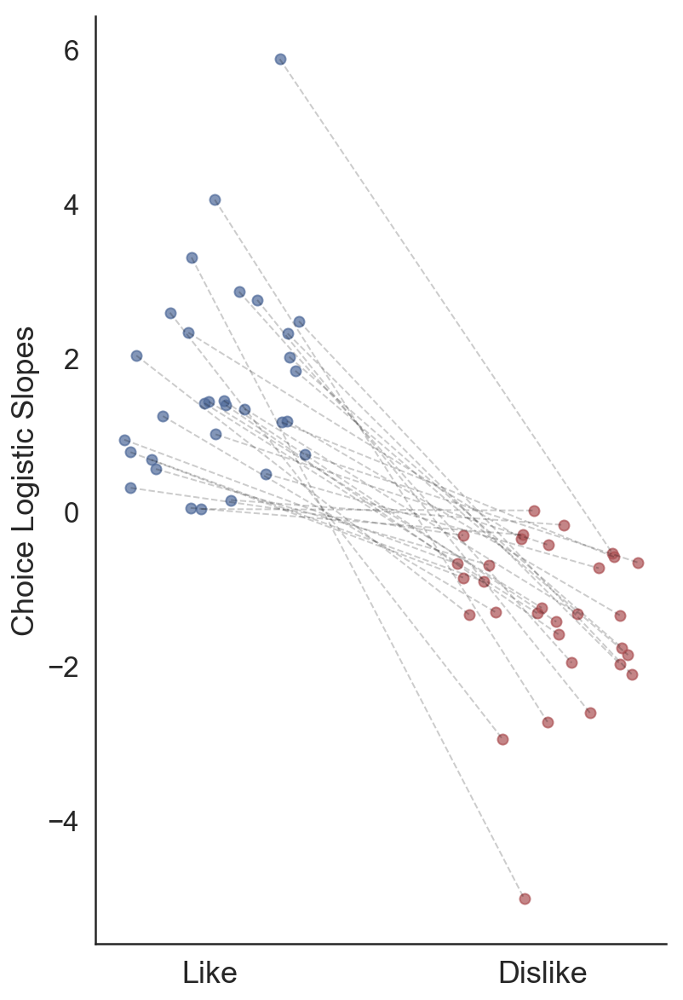

In [130]:
ttestsPlot(like_slopes, dislike_slopes,'#4F6A9A','#AC5255',"Like",  "Dislike",title = 'Choice Logistic Slopes')
plt.savefig('SavedFigures/SlopesConfidenceComparison.svg', format='svg', dpi = 500 )

In [131]:
## Substracting 

In [132]:
np.subtract(like_slopes, dislike_slopes)

array([5.53281783, 3.35804053, 4.57827281, 4.29142715, 8.31678176,
       2.86908906, 1.57923868, 2.9733406 , 0.01898699, 6.41186249,
       1.74849267, 2.52013936, 1.43524444, 3.68575474, 6.77422331,
       2.67218462, 4.81408931, 5.35556396, 0.34945688, 1.2439632 ,
       2.6539471 , 1.62767417, 2.72334855, 1.40777074, 3.77454701,
       2.543733  , 0.61505043, 2.67463309, 1.60825853, 0.32340706,
       1.22479904])

In [133]:
Mean_like_slopes = like_slopes.mean()
Mean_dislike_slopes = dislike_slopes.mean()

abs_like_slopes = np.absolute(like_slopes)
abs_dislike_slopes = np.absolute(dislike_slopes)

abs_like_slopes

print ("Mean Slopes : LIKE : " + str(Mean_like_slopes) + "  /// DISLIKE : " +  str(Mean_dislike_slopes))

Mean Slopes : LIKE : 1.6371717753258628  /// DISLIKE : -1.3210907772589249


ChoiceSlopes: MeanL = 1.6371717753258628; MeanD = 1.3223144904930242; [Like - Dislike] =  0.3148572848328386; t =  1.58 ; p-value =0.1242444484936446
Participants with slope in Like < Dislike: 0
Participants with slope in Like < Dislike: 4
Participants with slope in Like < Dislike: 6
Participants with slope in Like < Dislike: 7
Participants with slope in Like < Dislike: 11
Participants with slope in Like < Dislike: 13
Participants with slope in Like < Dislike: 18
Participants with slope in Like < Dislike: 19
Participants with slope in Like < Dislike: 21
Participants with slope in Like < Dislike: 25
Participants with slope in Like < Dislike: 29
Participants with slope in Like < Dislike: 30


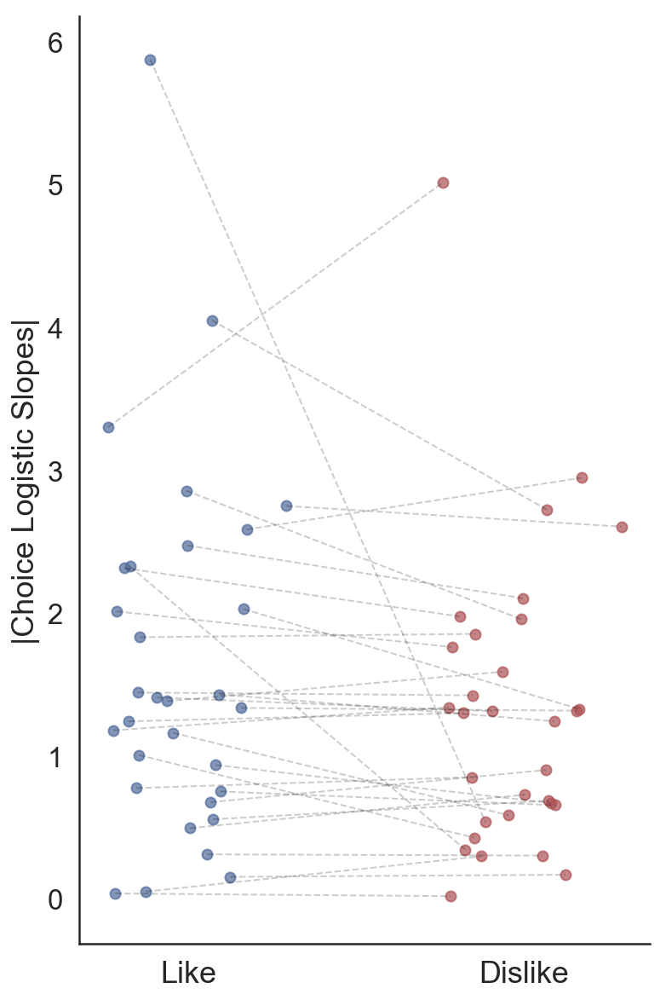

In [134]:
ttestsPlot(abs_like_slopes, abs_dislike_slopes,'#4F6A9A','#AC5255',"Like",  "Dislike",title = '|Choice Logistic Slopes|')

### Non significant difference in magnitude of the slope in LIKE vs DISLIKE

## Check differences between Like and Dislike blocks

In [135]:
partic = []
Correct_like = []
Correct_dislike = []
RT_like = []
RT_dislike = []
Conf_like = []
Conf_dislike = []

DDT_like = []
DDT_dislike = []
GSF_like = []
GSF_dislike = []
DFam_like = []
DFam_dislike = []
DVal_like = []
DVal_dislike = []

for i in unique(data_expL["Part"]):
    
    #if i== 2 or i ==26 or i==35:
    #    continue
        
    Correct_lik = data_expL.loc[(data_expL['Part'] == i),'Correct'].sum()/120
    Correct_dislik = data_expD.loc[(data_expD['Part'] == i),'Correct'].sum()/120
    
    RT_lik = data_expL.loc[(data_expL['Part'] == i),'RT'].sum()/120
    RT_dislik = data_expD.loc[(data_expD['Part'] == i),'RT'].sum()/120
    
    Conf_lik = data_expL.loc[(data_expL['Part'] == i),'zConf'].sum()/120
    Conf_dislik = data_expD.loc[(data_expD['Part'] == i),'zConf'].sum()/120

    DDT_lik = data_expL.loc[(data_expL['Part'] == i),'zAbsDDT'].sum()/120
    DDT_dislik = data_expD.loc[(data_expD['Part'] == i),'zAbsDDT'].sum()/120

    GSF_lik = data_expL.loc[(data_expL['Part'] == i),'zGSF'].sum()/120
    GSF_dislik = data_expD.loc[(data_expD['Part'] == i),'zGSF'].sum()/120
    
    Fam_lik = data_expL.loc[(data_expL['Part'] == i),'LFam'].sum()/120
    Fam_dislik = data_expD.loc[(data_expD['Part'] == i),'LFam'].sum()/120
    
    Val_lik = data_expL.loc[(data_expL['Part'] == i),'LVal'].sum()
    Val_dislik = data_expD.loc[(data_expD['Part'] == i),'LVal'].sum()
    

    
    
    
    Correct_like.append(Correct_lik)
    Correct_dislike.append(Correct_dislik)
    RT_like.append(RT_lik)
    RT_dislike.append(RT_dislik)
    Conf_like.append(Conf_lik)
    Conf_dislike.append(Conf_dislik)
    DDT_like.append(DDT_lik)
    DDT_dislike.append(DDT_dislik)
    GSF_like.append(GSF_lik)
    GSF_dislike.append(GSF_dislik)
    DFam_like.append(Fam_lik)
    DFam_dislike.append(Fam_dislik)
    DVal_like.append(Val_lik)
    DVal_dislike.append(Val_dislik)
    partic.append(i)




In [136]:
## Consider that participants

In [137]:
table_aux= np.column_stack((partic,DVal_like,DVal_dislike))
test_df = pd.DataFrame(table_aux,columns=['part','like','dislike'])
test_df


,part,like,dislike
0,1.0,179.70,179.70
1,2.0,44.65,43.40
2,3.0,135.60,135.60
3,4.0,94.30,94.30
4,5.0,31.90,31.90
5,8.0,86.10,86.10
6,9.0,92.60,92.60
7,10.0,148.50,148.50
8,11.0,199.20,199.20
9,12.0,96.00,96.00


In [138]:
# USING REPEATED MEASURES
diff = mean(Correct_like) - mean(Correct_dislike)
[s, p] = stats.ttest_rel(Correct_like,Correct_dislike)
print ("Correct: MeanL = "+ str(round(mean(Correct_like),2))+ "; MeanD = "+ str(round(mean(Correct_dislike),2))+"; [Like - Dislike] =  " + str(round(diff,2)) +"; t =  " + str(round(s,2)) + " ; p-value =" + str(round(p,2)))
p_correct = p

diff = mean(RT_like) - mean(RT_dislike)
[s, p] = stats.ttest_rel(RT_like,RT_dislike)
print ("RT: MeanL = "+ str(round(mean(RT_like),2))+ "; MeanD = "+ str(round(mean(RT_dislike),2))+"; [Like - Dislike] =  " + str(round(diff,2)) +"; t =  " + str(round(s,2)) + " ; p-value =" + str(round(p,2) ))
p_rt = p

diff = mean(Conf_like) - mean(Conf_dislike)
[s, p] = stats.ttest_rel(Conf_like,Conf_dislike)
print ("Conf: MeanL = "+ str(round(mean(Conf_like),2))+ "; MeanD = "+ str(round(mean(Conf_dislike),2))+"; [Like - Dislike] =  " + str(round(diff,2)) +"; t =  " + str(round(s,2)) + " ; p-value =" + str(round(p,2) ))
p_conf = p

diff = mean(DDT_like) - mean(DDT_dislike)
[s, p] = stats.ttest_rel(DDT_like,DDT_dislike)
print ("DDT: MeanL = "+ str(round(mean(DDT_like),2))+ "; MeanD = "+ str(round(mean(DDT_dislike),2))+"; [Like - Dislike] =  " + str(round(diff,2)) + "; t =  " + str(round(s,2))+ " ; p-value =" + str(round(p,4) ))
p_DDT = p

diff = mean(GSF_like) - mean(GSF_dislike)
[s, p] = stats.ttest_rel(GSF_like,GSF_dislike)
print ("GSF: MeanL = "+ str(round(mean(GSF_like),2))+ "; MeanD = "+ str(round(mean(GSF_dislike),2))+"; [Like - Dislike] =  " + str(round(diff,2)) +"; t =  " + str(round(s,2)) + " ; p-value =" + str(round(p ,2)))
p_GSF = p

diff = mean(DFam_like) - mean(DFam_dislike)
s, p = stats.ttest_rel(DFam_like,DFam_dislike)
print ("DFam: MeanL = "+ str(round(mean(DFam_like),2))+ "; MeanD = "+ str(round(mean(DFam_dislike),2))+"; [Like - Dislike] =  " + str(round(diff,2)) +"; t =  " + str(round(s,2)) + " ; p-value =" + str(round(p,2)) )
p_fam = p

diff = mean(DVal_like) - mean(DVal_dislike)
s, p = stats.ttest_rel(DVal_like,DVal_dislike)
print ("DVAl: MeanL = "+ str(round(mean(DVal_like),2))+ "; MeanD = "+ str(round(mean(DVal_dislike),2))+"; [Like - Dislike] =  " + str(round(diff,2)) +"; t =  " + str(round(s,2)) + " ; p-value =" + str(round(p,2) ))
p_Dval = p



Correct: MeanL = 0.77; MeanD = 0.75; [Like - Dislike] =  0.02; t =  1.71 ; p-value =0.1
RT: MeanL = 2858.2; MeanD = 3152.7; [Like - Dislike] =  -294.5; t =  -2.52 ; p-value =0.02
Conf: MeanL = 0.1; MeanD = -0.1; [Like - Dislike] =  0.19; t =  4.49 ; p-value =0.0
DDT: MeanL = 0.65; MeanD = 0.72; [Like - Dislike] =  -0.07; t =  -2.04 ; p-value =0.0501
GSF: MeanL = -0.05; MeanD = 0.05; [Like - Dislike] =  -0.11; t =  -2.99 ; p-value =0.01
DFam: MeanL = 3.28; MeanD = 3.27; [Like - Dislike] =  0.01; t =  1.43 ; p-value =0.16
DVAl: MeanL = 120.47; MeanD = 120.44; [Like - Dislike] =  0.03; t =  0.25 ; p-value =0.81


In [139]:
# Add asterisk
def add_star(RT_like, RT_dislike):
    x1, x2 = 0, 1   
    y_max = max([np.max(RT_like), np.max(RT_dislike)])
    y, h, col = y_max + y_max/50, y_max/50, 'k'
    plt.plot( [x1+0.25, x2-0.25], [ y+h, y+h], lw=1.5, c=col)
    plt.text((x1+x2)*.5, y+h, "*", ha='center', va='bottom', color=col)
    
    
# Add asterisk
def add_star1(RT_like, RT_dislike, p):
    
    if p<0.001:
        star_text = '***'
    elif p<0.01:
        star_text = '**'
    elif p<0.05:
        star_text = '*'
        
    x1, x2 = 1, 2   
    y_max = max([np.max(RT_like), np.max(RT_dislike)])
    y, h, col = y_max + y_max/50, y_max/50, 'k'
    plt.plot( [x1+0.25, x2-0.25], [ y+h, y+h], lw=1.5, c=col)
    plt.text((x1+x2)*.5, y+h, star_text, ha='center', va='bottom', color=col)

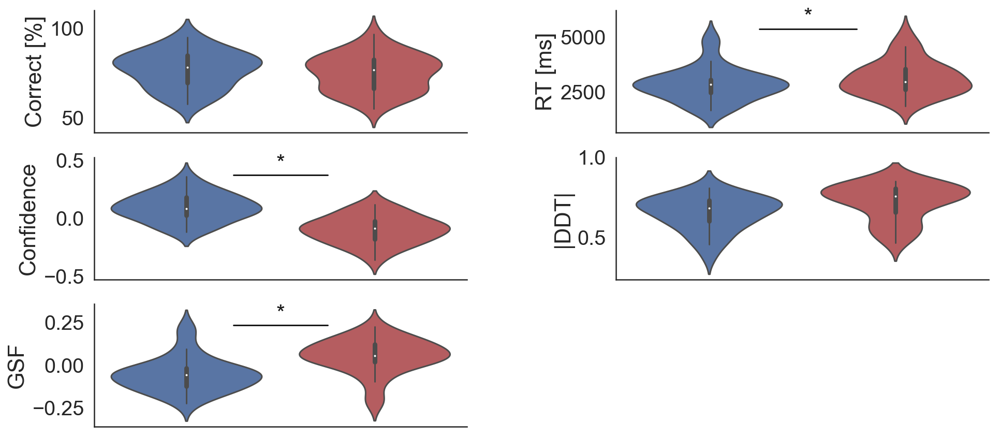

In [140]:
f = plt.figure(figsize=(20,10))
sns.set(style='white', font_scale=1.8)
#plt.suptitle('Like and dislike conditions')

my_pal = {"b","r"}

wspace1 = 0.4
left1 = 0.3 
# FOR CORRECT

plt.subplot(421)

all_arr = [Correct_like,
          Correct_dislike]
bplot = sns.violinplot(data=all_arr , palette=my_pal).set( ylabel='Correct [%]')
plt.xticks([0, 1,], ['Like', 'Dislike'])
plt.yticks([0.5, 1,], [50, 100])
plt.tick_params( axis='x', which='both',bottom=False,top=False,labelbottom=False) 

#plt.subplots_adjust(left=left1, wspace=wspace1)
plt.subplots_adjust(left=0, wspace=wspace1)


# FOR RT
plt.subplot(422)
all_arr1 = [RT_like,
          RT_dislike]
bplot = sns.violinplot(data=all_arr1, palette=my_pal).set(ylabel='RT [ms]')
plt.xticks([0, 1,], ['Like', 'Dislike'])
plt.tick_params( axis='x', which='both',bottom=False,top=False,labelbottom=False)

# Add asterisk
x1, x2 = 0, 1   
y_max = max([np.max(RT_like), np.max(RT_dislike)])
y, h, col = y_max + y_max/50, y_max/50, 'k'
plt.plot( [x1+0.25, x2-0.25], [ y+h, y+h], lw=1.5, c=col)
plt.text((x1+x2)*.5, y+h, "*", ha='center', va='bottom', color=col)

#plt.subplots_adjust(left=left1, wspace=wspace1)
#plt.subplots_adjust(left=left1, wspace=wspace1)


# FOR CONF
plt.subplot(423)
all_arr1 = [Conf_like,
          Conf_dislike]
bplot = sns.violinplot(data=all_arr1, palette=my_pal).set(ylabel='Confidence')
plt.xticks([0, 1,], ['Like', 'Dislike'])
plt.tick_params( axis='x', which='both',bottom=False,top=False,labelbottom=False) 

# Add asterisk
x1, x2 = 0, 1   
y_max = max([np.max(Conf_like), np.max(Conf_dislike)])
y, h, col = y_max + y_max/50, y_max/50, 'k'
plt.plot( [x1+0.25, x2-0.25], [ y+h, y+h], lw=1.5, c=col)
plt.text((x1+x2)*.5, y+h, "*", ha='center', va='bottom', color=col)

#plt.subplots_adjust(left=left1, wspace=wspace1)
plt.subplots_adjust(left=left1, wspace=wspace1)


# FOR DDT
plt.subplot(424)
all_arr1 = [DDT_like,
          DDT_dislike]
bplot = sns.violinplot(data=all_arr1, palette=my_pal).set(ylabel='|DDT|')
plt.xticks([0, 1,], ['Like', 'Dislike'])
plt.tick_params( axis='x', which='both',bottom=False,top=False,labelbottom=False) 



#plt.subplots_adjust(left=left1, wspace=wspace1)
#plt.subplots_adjust(left=left1, wspace=wspace1)


# FOR GSF
plt.subplot(425)
all_arr1 = [GSF_like,
          GSF_dislike]
bplot = sns.violinplot(data=all_arr1, palette=my_pal).set(ylabel='GSF')
plt.xticks([0, 1,], ['Like', 'Dislike'])
plt.tick_params( axis='x', which='both',bottom=False,top=False,labelbottom=False) 

# Add asterisk
x1, x2 = 0, 1   
y_max = max([np.max(GSF_like), np.max(GSF_dislike)])
y, h, col = y_max + y_max/50, y_max/50, 'k'
plt.plot( [x1+0.25, x2-0.25], [ y+h, y+h], lw=1.5, c=col)
plt.text((x1+x2)*.5, y+h, "*", ha='center', va='bottom', color=col)

sns.despine()
## # FOR DVal
## plt.subplot(426)
## all_arr1 = [DVal_like,
##           DVal_dislike]
## bplot = sns.violinplot(data=all_arr1, palette=my_pal).set(ylabel='DVal')
## plt.xticks([0, 1,], ['Like', 'Dislike'])
## 
## # # FOR DFam
## plt.subplot(427)
## all_arr1 = [DFam_like,
##            DFam_dislike]
## bplot = sns.violinplot(data=all_arr1, palette=my_pal).set(ylabel='DFam')
## plt.xticks([0, 1,], ['Like', 'Dislike'])

f.savefig(str('SavedFigures/BehaviouralComparisonLikeDislike_31.png'), dpi = 200 )

## Second version violinplots

In [141]:
def adjacent_values(vals, q1, q3):
    upper_adjacent_value = q3 + (q3 - q1) * 1.5
    upper_adjacent_value = np.clip(upper_adjacent_value, q3, vals[-1])

    lower_adjacent_value = q1 - (q3 - q1) * 1.5
    lower_adjacent_value = np.clip(lower_adjacent_value, vals[0], q1)
    return lower_adjacent_value, upper_adjacent_value

def add_violin(all_arr):
    parts = plt.violinplot( all_arr, showmeans=False, showextrema=False, showmedians=False)
    for i, face in enumerate(parts['bodies']):
       # face.set_hatch('//')
        face.set_facecolor(colr_dict[i])
        face.set_edgecolor('white')
        face.set_alpha(1)
  #  parts2 = plt.violinplot( all_arr
   #                         , showmeans=False, showextrema=False, showmedians=False)
  #  for i, face in enumerate(parts2['bodies']):
       # face.set_hatch('//')
       # face.set_facecolor('None')
   #     face.set_alpha(1)

    quartile1, medians, quartile3 = np.percentile(all_arr, [25, 50, 75], axis=1)
    whiskers = np.array([
        adjacent_values(sorted_array, q1, q3) \
        for sorted_array, q1, q3 in zip(all_arr, quartile1, quartile3)])
    whiskersMin, whiskersMax = whiskers[:, 0], whiskers[:, 1]

    inds = np.arange(1, len(medians)+1)
    plt.vlines(inds, quartile1, quartile3, color='k', linestyle='-', lw=3,alpha = 0.7)
    plt.vlines(inds, whiskersMin, whiskersMax, color='k', linestyle='-', lw=1,alpha = 0.7)
    plt.scatter(inds, medians, marker='o', color='white', s=2, zorder=2,alpha = 1)    

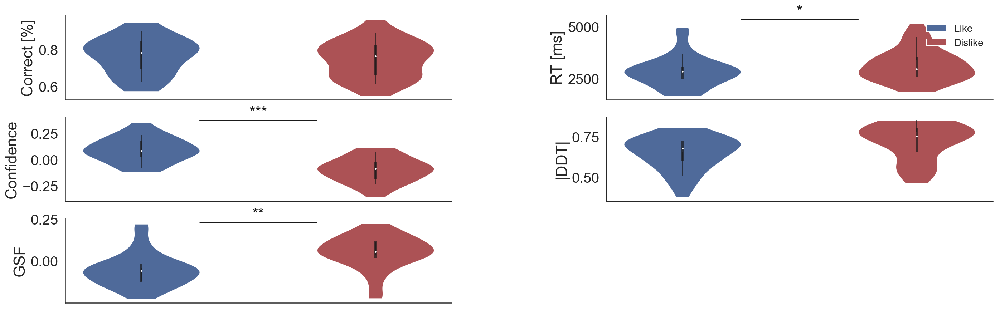

In [142]:
f = plt.figure(figsize=(20,10))
sns.set(style='white', font_scale=1.8)
#plt.suptitle('Like and dislike conditions')

#my_pal = {'#AC5255','#4F6A9A'}
#my_pal = {'#4F6A9A','#4F6A9A','#AC5255'}
my_pal = {0 :"b", 1 : "r"}
colr_dict = { 0:'#4F6A9A', 1:'#AC5255' }

wspace1 = 0.4
left1 = 0.3 
# FOR CORRECT

plt.subplot(421)

all_arr = [Correct_like,
          Correct_dislike]

# set up color and hatching on the violins
add_violin( all_arr)
#add_box_to_violin(plt,all_arr)
plt.xticks([1, 2], ['Most', 'Few'])
plt.tick_params( axis='x', which='both',bottom=False,top=False,labelbottom=False) 
plt.ylabel('Correct [%]')

plt.subplots_adjust(left=0, wspace=wspace1)

# FOR RT
plt.subplot(422)
all_arr1 = [RT_like,
          RT_dislike]
# set up color and hatching on the violins
add_violin(all_arr1)
#add_box_to_violin(plt,all_arr1)
plt.xticks([1, 2], ['Most', 'Few'])
plt.ylabel('RT [ms]')

plt.tick_params( axis='x', which='both',bottom=False,top=False,labelbottom=False) 

add_star1(RT_like, RT_dislike,p_rt)

# PLot legend
patch1 = mpatches.Patch(facecolor=colr_dict[0],hatch=r'', label='Like')
patch2 = mpatches.Patch(facecolor=colr_dict[1],hatch=r'', label='Dislike')
leg = plt.legend(handles=[patch1,patch2],fontsize=14,loc = "upper right")
leg.get_frame().set_facecolor('none')
leg.get_frame().set_linewidth(0.0)


# FOR CONF
plt.subplot(423)
all_arr1 = [Conf_like,
          Conf_dislike]
add_violin( all_arr1)
#add_box_to_violin(plt,all_arr1)
plt.xticks([1,2], ['Most', 'Few'])
plt.tick_params( axis='x', which='both',bottom=False,top=False,labelbottom=False) 
plt.ylabel('Confidence')
add_star1(Conf_like, Conf_dislike, p_conf)

plt.subplots_adjust(left=0, wspace=wspace1)

# FOR DDT
plt.subplot(424)
all_arr1 = [DDT_like,
          DDT_dislike]
add_violin( all_arr1)
#add_box_to_violin(plt,all_arr1)
plt.xticks([1, 2,], ['Most', 'Few'])
plt.tick_params( axis='x', which='both',bottom=False,top=False,labelbottom=False) 
plt.ylabel('|DDT|')


# FOR GSF
plt.subplot(425)
all_arr1 = [GSF_like,
          GSF_dislike]
add_violin(all_arr1)
#add_box_to_violin(plt,all_arr1)
plt.xticks([0, 1], ['Most', 'Few'])
plt.tick_params( axis='x', which='both',bottom=False,top=False,labelbottom=False) 
plt.ylabel('GSF')

add_star1(GSF_like, GSF_dislike, p_GSF)

sns.despine()

#f.savefig(str('SavedFigures/BehaviouralComparisonLikeDislike_31.png'), dpi = 200 )

## Confidence split by error / mistake

In [143]:
Like_Correct = data_expL.loc[(data_expL['Correct'] == 1)]
Like_Error = data_expL.loc[(data_expL['Correct'] == 0)]

Dislike_Correct = data_expD.loc[(data_expD['Correct'] == 1)]
Dislike_Error = data_expD.loc[(data_expD['Correct'] == 0)]

Data 1: Pearson's r = 0.247 , p =  0.0 , slope =  0.0
Data 2: Pearson's r = -0.011 , p =  0.757


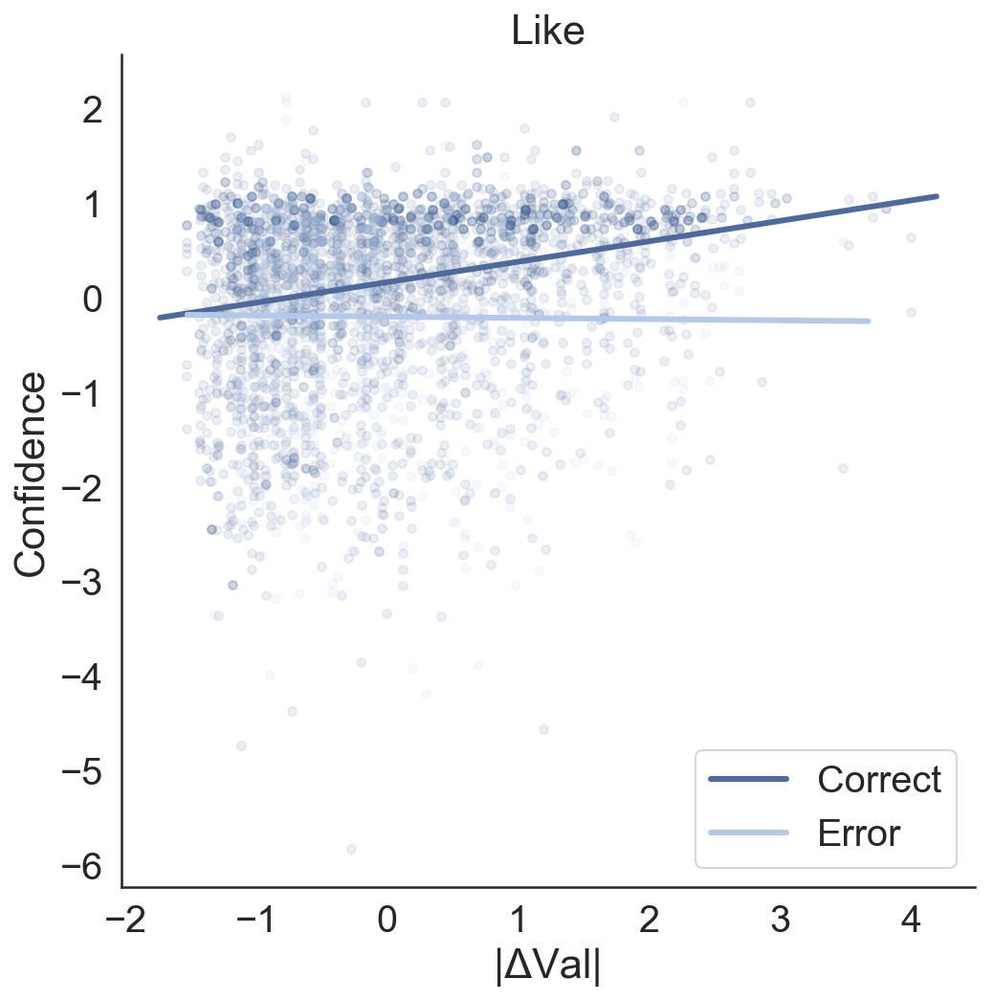

Data 1: Pearson's r = 0.246 , p =  0.0 , slope =  0.0
Data 2: Pearson's r = -0.007 , p =  0.826


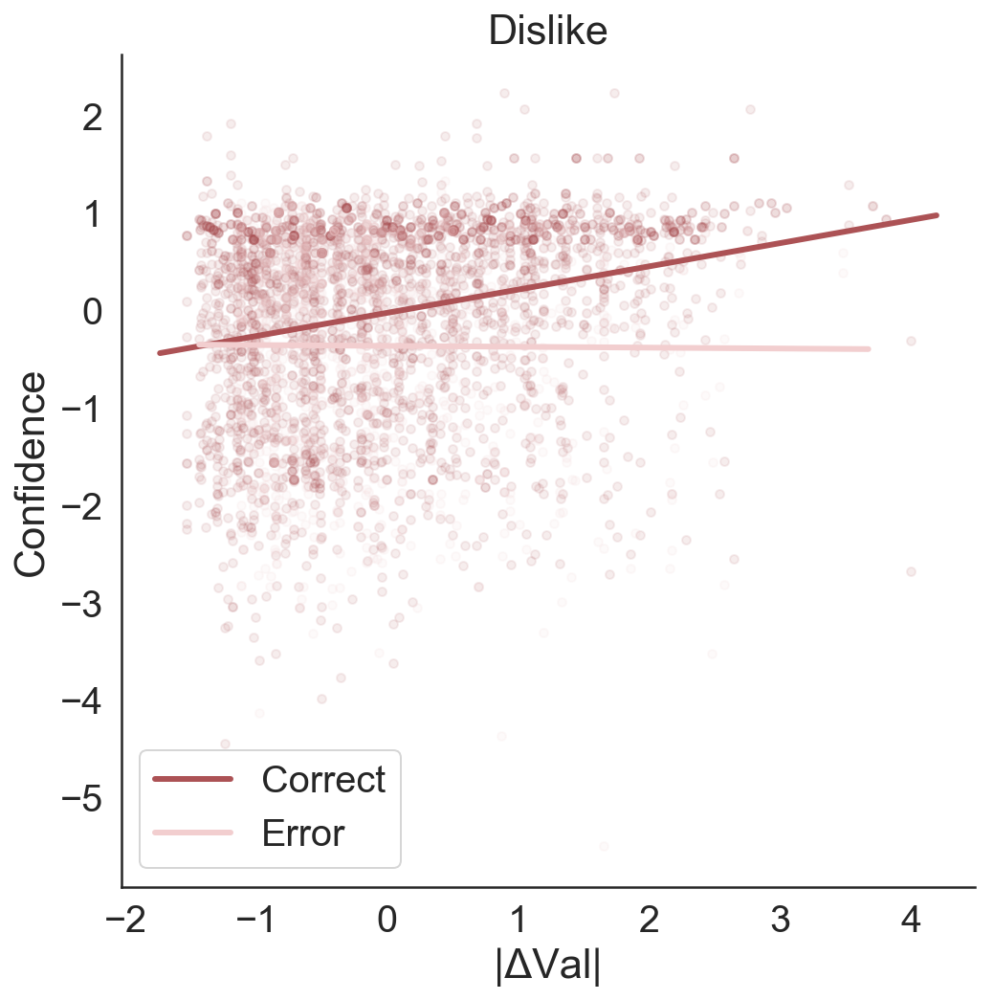

In [144]:
correl_plot2 (Like_Correct,Like_Error,'zAbsDVal','zConf',color1 = '#4F6A9A',color2 = '#B5C8E9',x_varlabel ='|ΔVal|' ,y_varlabel = 'Confidence', title = "Like")
correl_plot2 (Dislike_Correct,Dislike_Error,'zAbsDVal','zConf',color1 = '#AC5255',color2 = '#F2CECF',x_varlabel ='|ΔVal|' ,y_varlabel = 'Confidence', title = "Dislike")

## Relationship RT and TotVal

In [145]:
data_exp1['logzRT'] = log(data_exp1['zRT'])
data_exp1['logRT'] = log(data_exp1['RT'])
data_exp1["zlogRT"] = z_score1(data_exp1,'Part',"logRT")


/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in log
  """Entry point for launching an IPython kernel.


In [146]:
data_expL = data_exp1.loc[data_exp1['BlockCond'] == 1] # 1 = Like, 2 = Dislike
data_expD = data_exp1.loc[data_exp1['BlockCond'] == 2] # 1 = Like, 2 = Dislike

Data 1: Pearson's r = 0.136 , p =  0.0 , slope =  0.0
Data 2: Pearson's r = 0.154 , p =  0.0


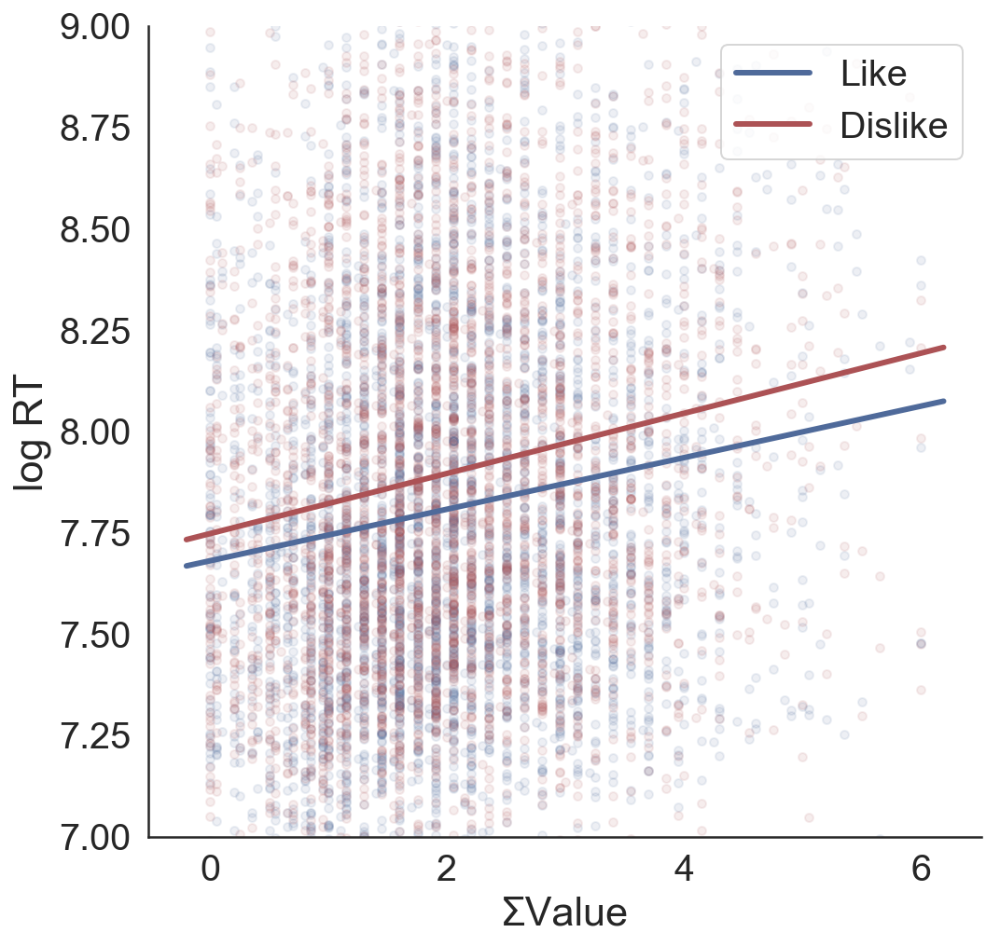

In [147]:
correl_plot2 (data_expL,data_expD,'TotVal','logRT',color1 = '#4F6A9A',color2 = '#AC5255',x_varlabel ='ΣValue' ,y_varlabel = 'log RT', title = "",data_label =('Like', 'Dislike'),ylims=(7,9))

## Time percent looking the most valuable item

In [122]:
def SE_calc (a):
    b = np.std(a)/np.sqrt(len(a))
    return b

In [123]:
LikeHighValGaze  =  []
LikeLowValGaze  =  []
DislikeHighValGaze  =  []
DislikeLowValGaze  =  []

LikeChoGaze  =  []
LikeUnchoGaze  =  []
DislikeChoGaze  =  []
DislikeUnchoGaze  =  []

for i in data_expL.Part.unique():
    
    Lik_MeanHValGazePC = data_expL.loc[(data_expL['Part'] == i)].HValGazePC.mean()
    Dlik_MeanHValGazePC = data_expD.loc[(data_expD['Part'] == i)].HValGazePC.mean()
    
    Lik_MeanLValGazePC = data_expL.loc[(data_expL['Part'] == i)].LValGazePC.mean()
    Dlik_MeanLValGazePC = data_expD.loc[(data_expD['Part'] == i)].LValGazePC.mean()
    
    LikeHighValGaze.append(Lik_MeanHValGazePC)
    LikeLowValGaze.append(Lik_MeanLValGazePC)
    DislikeHighValGaze.append(Dlik_MeanHValGazePC)
    DislikeLowValGaze.append(Dlik_MeanLValGazePC)
    
    
    Lik_MeanChoGazePC = data_expL.loc[(data_expL['Part'] == i)].ChosenGazePC.mean()
    Dlik_MeanChoGazePC = data_expD.loc[(data_expD['Part'] == i)].ChosenGazePC.mean()
    
    Lik_MeanUnchoGazePC = data_expL.loc[(data_expL['Part'] == i)].UnchosenGazePC.mean()
    Dlik_MeanUnchoGazePC = data_expD.loc[(data_expD['Part'] == i)].UnchosenGazePC.mean()
    
    LikeChoGaze.append(Lik_MeanChoGazePC)
    LikeUnchoGaze.append(Lik_MeanUnchoGazePC)
    DislikeChoGaze.append(Dlik_MeanChoGazePC)
    DislikeUnchoGaze.append(Dlik_MeanUnchoGazePC)
    
    
error_LikeHighValGaze  = SE_calc(LikeHighValGaze)
error_LikeLowValGaze  =  SE_calc(LikeLowValGaze)
error_DislikeHighValGaze  = SE_calc(DislikeHighValGaze)
error_DislikeLowValGaze  =  SE_calc(DislikeLowValGaze)

avg_LikeHighValGaze  = np.mean(LikeHighValGaze)
avg_LikeLowValGaze  =   np.mean(LikeLowValGaze)
avg_DislikeHighValGaze  =  np.mean(DislikeHighValGaze)
avg_DislikeLowValGaze  =   np.mean(DislikeLowValGaze)

error_LikeChoGaze  = SE_calc(LikeChoGaze)
error_LikeUnchoGaze  =  SE_calc(LikeUnchoGaze)
error_DislikeChoGaze  = SE_calc(DislikeChoGaze)
error_DislikeUnchoGaze  =  SE_calc(DislikeUnchoGaze)

avg_LikeChoGaze  = np.mean(LikeChoGaze)
avg_LikeUnchoGaze  =   np.mean(LikeUnchoGaze)
avg_DislikeChoGaze  =  np.mean(DislikeChoGaze)
avg_DislikeUnchoGaze =   np.mean(DislikeUnchoGaze)



In [81]:
# t-test
diff = avg_LikeHighValGaze - avg_DislikeHighValGaze
[s1, p1] = stats.ttest_rel(LikeHighValGaze,DislikeHighValGaze)
print (" Like High Val Gaze =  "+ str(round(mean(avg_LikeHighValGaze),2))+ " ; Mean Dislike High Val Gaze =  "+ str(round(mean(avg_DislikeHighValGaze),2))+"; [Like - Dislike] =  " + str(round(diff,2)) +"; t =  " + str(round(s1,2)) + " ; p-value =" + str(round(p1,2) ))

diff = avg_LikeLowValGaze - avg_DislikeLowValGaze
[s2, p2] = stats.ttest_rel(LikeLowValGaze,DislikeLowValGaze)
print (" Like High Val Gaze =  "+ str(round(mean(avg_LikeLowValGaze),2))+ " ; Mean Dislike High Val Gaze =  "+ str(round(mean(avg_DislikeLowValGaze),2))+"; [Like - Dislike] =  " + str(round(diff,2)) +"; t =  " + str(round(s2,2)) + " ; p-value =" + str(round(p2,2) ))


diff = avg_LikeHighValGaze - avg_LikeLowValGaze
[s3, p3] = stats.ttest_rel(LikeHighValGaze,LikeLowValGaze)
print (" Like High=  "+ str(round(mean(avg_LikeHighValGaze),2))+ " ;   Low  =  "+ str(round(mean(avg_LikeLowValGaze),2))+"; [High - low] =  " + str(round(diff,2)) +"; t =  " + str(round(s3,2)) + " ; p-value =" + str(round(p3,2) ))

diff = avg_DislikeHighValGaze - avg_DislikeLowValGaze
[s4, p4] = stats.ttest_rel(DislikeHighValGaze,DislikeLowValGaze)
print (" DisLike High=  "+ str(round(mean(avg_DislikeHighValGaze),2))+ " ;   Low  =  "+ str(round(mean(avg_DislikeLowValGaze),2))+"; [high - low] =  " + str(round(diff,2)) +"; t =  " + str(round(s4,2)) + " ; p-value =" + str(round(p4,2) ))



 Like High Val Gaze =  0.59 ; Mean Dislike High Val Gaze =  0.53; [Like - Dislike] =  0.06; t =  7.37 ; p-value =0.0
 Like High Val Gaze =  0.52 ; Mean Dislike High Val Gaze =  0.58; [Like - Dislike] =  -0.06; t =  -7.24 ; p-value =0.0
 Like High=  0.59 ;   Low  =  0.52; [High - low] =  0.07; t =  7.56 ; p-value =0.0
 DisLike High=  0.53 ;   Low  =  0.58; [high - low] =  -0.05; t =  -4.99 ; p-value =0.0


In [94]:
 
# Add asterisk
def add_star2(RT_like, RT_dislike, p,x1,x2):
    
    if p<0.001:
        star_text = '***'
    elif p<0.01:
        star_text = '**'
    elif p<0.05:
        star_text = '*'
    y_max = max([np.max(RT_like), np.max(RT_dislike)])
    y, h, col = y_max + y_max/50, y_max/50, 'k'
    plt.plot( [x1+0.8, x2-0.8], [ y+h, y+h], lw=1.5, c=col)
    plt.text((x1+x2)*.5, y+h, star_text, ha='center', va='bottom', color=col)

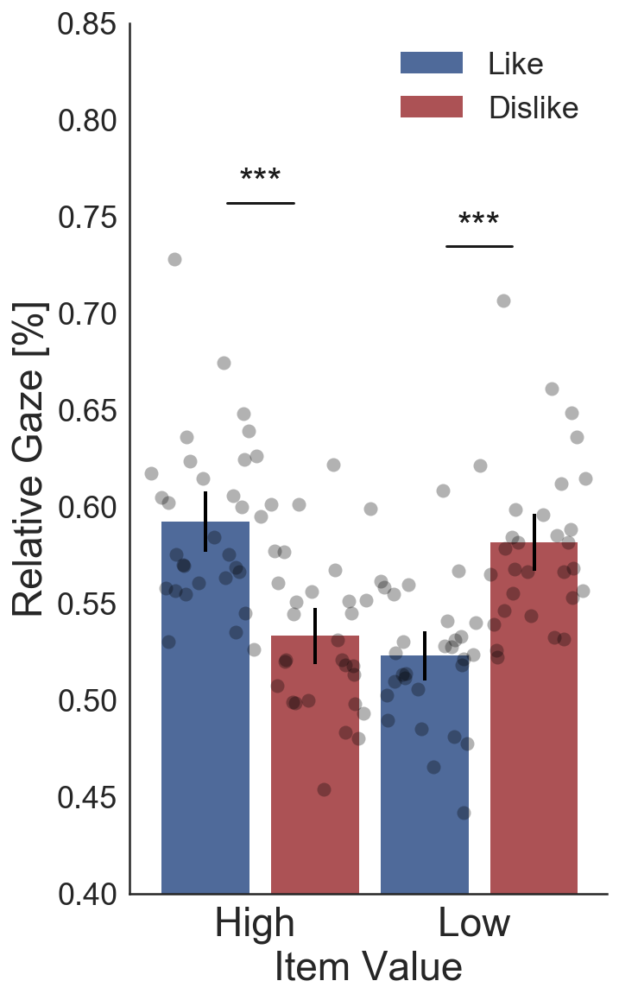

In [97]:
fig = plt.figure(figsize=[6,10])
gs = GridSpec(1,1,bottom=0.18,left=0.18,right=0.82)

ax = fig.add_subplot(gs[0,0])
# bars
ax.bar(1, np.mean(LikeHighValGaze), width=0.8,color= '#4F6A9A')
ax.bar(2, np.mean(DislikeHighValGaze), width=0.8,color='#AC5255')
ax.bar(3, np.mean(LikeLowValGaze), width=0.8,color= '#4F6A9A')
ax.bar(4, np.mean(DislikeLowValGaze), width=0.8,color='#AC5255')

# error
ax.errorbar(1, np.mean(LikeHighValGaze), yerr=error_LikeHighValGaze*1.96, lw=2, color='#000000')
ax.errorbar(2, np.mean(DislikeHighValGaze), yerr=error_DislikeHighValGaze*1.96, lw=2, color='#000000')
ax.errorbar(3, np.mean(LikeLowValGaze), yerr=error_LikeLowValGaze*1.96, lw=2, color='#000000')
ax.errorbar(4, np.mean(DislikeLowValGaze), yerr=error_DislikeLowValGaze*1.96, lw=2, color='#000000')
       

for i in range(1,len(LikeHighValGaze)):
        jittr = np.random.uniform(low=-0.5,high=0.5)
        ax.plot(1+jittr, LikeHighValGaze[i], marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")
        ax.plot(2+jittr, DislikeHighValGaze[i], marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")
        ax.plot(3+jittr, LikeLowValGaze[i], marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")
        ax.plot(4+jittr, DislikeLowValGaze[i], marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")

ax.set_xticks([1.5,3.5])
ax.set_xticklabels(["High ","Low "], rotation=0, fontsize=23)
ax.set_ylabel('Relative Gaze [%]', fontsize=23)
ax.set_xlabel('Item Value', fontsize=23)

ax.set_ylim([0.4,0.85])

sns.despine()

patch1 = mpatches.Patch(facecolor='#4F6A9A',hatch=r'', label='Like')
patch2 = mpatches.Patch(facecolor='#AC5255',hatch=r'', label='Dislike')
leg = plt.legend(handles=[patch1,patch2],fontsize=18,loc = "upper right",frameon = False)

add_star2(LikeHighValGaze, DislikeHighValGaze, p1,1,2)
add_star2(LikeLowValGaze, DislikeLowValGaze, p1,3,4)

#ax.errorbar(position, regtable.loc['coefficient', Coefficient],
#yerr=regtable.loc['se', Coefficient]*1.96, lw=2, color='#000000')

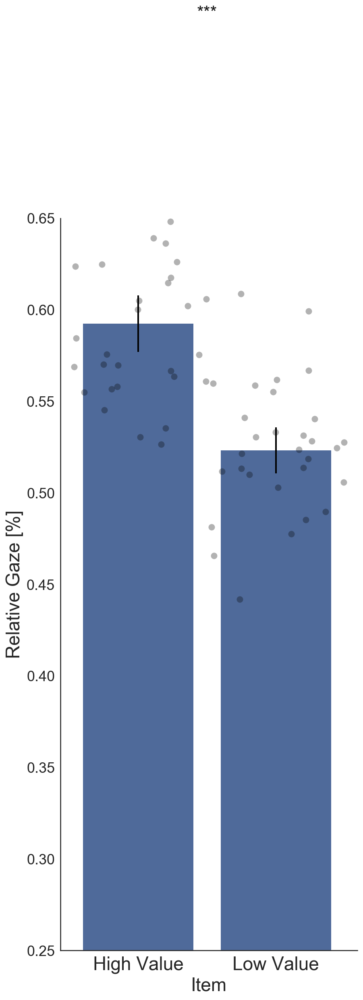

In [89]:
# Plot for like

fig = plt.figure(figsize=[8,18])
gs = GridSpec(1,1,bottom=0.18,left=0.18,right=0.82)

ax = fig.add_subplot(gs[0,0])
# bars
ax.bar(1, np.mean(LikeHighValGaze), width=0.8,color= '#4F6A9A')
ax.bar(2, np.mean(LikeLowValGaze), width=0.8,color= '#4F6A9A')

# error
ax.errorbar(1, np.mean(LikeHighValGaze), yerr=error_LikeHighValGaze*1.96, lw=2, color='#000000')
ax.errorbar(2, np.mean(LikeLowValGaze), yerr=error_LikeLowValGaze*1.96, lw=2, color='#000000')
       

for i in range(1,len(LikeHighValGaze)):
        jittr = np.random.uniform(low=-0.5,high=0.5)
        ax.plot(1+jittr, LikeHighValGaze[i], marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")
        ax.plot(2+jittr, LikeLowValGaze[i], marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")

ax.set_xticks([1,2])
ax.set_xticklabels(["High Value","Low Value"], rotation=0, fontsize=23)
ax.set_ylabel('Relative Gaze [%]', fontsize=23)
ax.set_xlabel('Item', fontsize=23)

ax.set_ylim([0.25,0.65])

sns.despine()

#patch1 = mpatches.Patch(facecolor='#4F6A9A',hatch=r'', label='Like')
#patch2 = mpatches.Patch(facecolor='#AC5255',hatch=r'', label='Dislike')
#leg = plt.legend(handles=[patch1,patch2],fontsize=18,loc = "upper right",frameon = False)

add_star2(LikeHighValGaze, DislikeHighValGaze, p1,1,2)



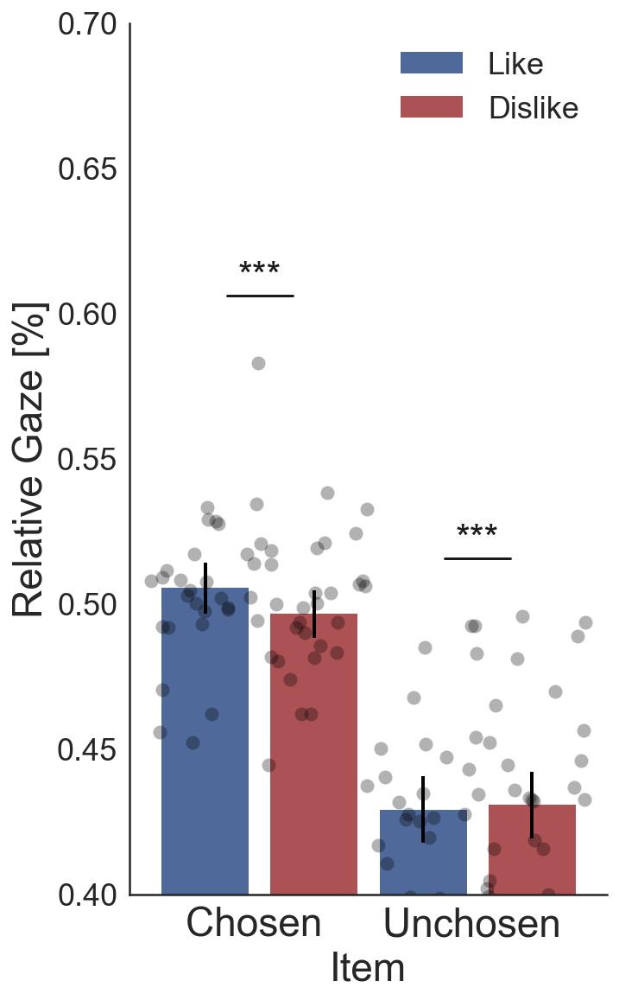

In [126]:
# plot for choice

fig = plt.figure(figsize=[6,10])
gs = GridSpec(1,1,bottom=0.18,left=0.18,right=0.82)

ax = fig.add_subplot(gs[0,0])
# bars
ax.bar(1, np.mean(LikeChoGaze), width=0.8,color= '#4F6A9A')
ax.bar(2, np.mean(DislikeChoGaze), width=0.8,color='#AC5255')
ax.bar(3, np.mean(LikeUnchoGaze), width=0.8,color= '#4F6A9A')
ax.bar(4, np.mean(DislikeUnchoGaze), width=0.8,color='#AC5255')

# error
ax.errorbar(1, np.mean(LikeChoGaze), yerr=error_LikeChoGaze*1.96, lw=2, color='#000000')
ax.errorbar(2, np.mean(DislikeChoGaze), yerr=error_DislikeChoGaze*1.96, lw=2, color='#000000')
ax.errorbar(3, np.mean(LikeUnchoGaze), yerr=error_LikeUnchoGaze*1.96, lw=2, color='#000000')
ax.errorbar(4, np.mean(DislikeUnchoGaze), yerr=error_DislikeUnchoGaze*1.96, lw=2, color='#000000')
       

for i in range(1,len(LikeHighValGaze)):
        jittr = np.random.uniform(low=-0.5,high=0.5)
        ax.plot(1+jittr, LikeChoGaze[i], marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")
        ax.plot(2+jittr, DislikeChoGaze[i], marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")
        ax.plot(3+jittr, LikeUnchoGaze[i], marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")
        ax.plot(4+jittr, DislikeUnchoGaze[i], marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")

ax.set_xticks([1.5,3.5])
ax.set_xticklabels(["Chosen ","Unchosen "], rotation=0, fontsize=23)
ax.set_ylabel('Relative Gaze [%]', fontsize=23)
ax.set_xlabel('Item', fontsize=23)

ax.set_ylim([0.4,0.70])

sns.despine()

patch1 = mpatches.Patch(facecolor='#4F6A9A',hatch=r'', label='Like')
patch2 = mpatches.Patch(facecolor='#AC5255',hatch=r'', label='Dislike')
leg = plt.legend(handles=[patch1,patch2],fontsize=18,loc = "upper right",frameon = False)

add_star2(LikeChoGaze, DislikeChoGaze, p1,1,2)
add_star2(LikeUnchoGaze, DislikeUnchoGaze, p1,3,4)

#ax.errorbar(position, regtable.loc['coefficient', Coefficient],
#yerr=regtable.loc['se', Coefficient]*1.96, lw=2, color='#000000')

In [85]:
def Coefpresplot_bar(regtable, mixtable, intercept=False, barcol='#000000', title='Regression Coefficients', size='big', ylimits=(), ymultiple=0.5, ticklabsize=25, n_ET_predictors = 0 ):

    # Import itertools so that we can iterate through the colours
    import itertools
    
    # Import locators so that we can tidy up the yaxis
    from matplotlib.ticker import MultipleLocator, FormatStrFormatter
    
    # rounding function to get edges to even 0.5 values
    def round_to(n, precision):
        correction = 0.5 if n >= 0 else -0.5
        return int( n/precision+correction ) * precision

    def round_to_5(n):
        return round_to(n, 0.5)
            
    # Set seaborn style for the plot
    sns.set(style='white')
    
    # Generate the figure
    if size=='big':
        fig = plt.figure(figsize=[20,8])
    elif size=='long':
        fig = plt.figure(figsize=[20,4])
    elif size=='narrow':
        fig = plt.figure(figsize=[10,4])
        
    fig.suptitle(title, fontsize=20)
    gs = GridSpec(1,1,bottom=0.18,left=0.18,right=0.82)
    ax = fig.add_subplot(gs[0,0])
    
    # Set axis limits based on whether to include the intercept or not    
    if intercept == True:
        XLim = (0, len(regtable.columns) + 1)
        YLim = (round_to_5(np.min(mixtable)-0.2), round_to_5(np.max(mixtable)+0.2))
    else:
        XLim = (0, len(regtable.columns) )
        YLim = (round_to_5(np.min(mixtable)-0.2), round_to_5(np.max(mixtable)+0.2))
    if ylimits != ():
        YLim = ylimits
    ax.set_xlim(XLim)
    ax.set_ylim(YLim)
    
    # Draw a line through the 0-value on the y-axis
    line = ax.plot(XLim, [0, 0], color='black', ls='--', alpha = 0.5, lw=3)
    
    
    # If intercept is true, plot the coefficient for the intercept
    if intercept == True:
        Coefficients = regtable.columns
    else:
        Coefficients = regtable.columns[1:]
        
    # Determine the colours for the coefficients based on the n_ET_variable
    n_predictors = len(Coefficients)
    n_non_ET_predictors = n_predictors - n_ET_predictors
    
    colourlist = [barcol] * n_non_ET_predictors + ['#03719c'] * n_ET_predictors
    
        
    # Plot all the coefficients with 95% CI
    position = 0
    for Coefficient in Coefficients:
        position += 1
        ax.bar(position, regtable.loc['coefficient', Coefficient], width=0.8,color=colourlist[position-1],)
        ax.errorbar(position, regtable.loc['coefficient', Coefficient],
                    yerr=regtable.loc['se', Coefficient]*1.96, lw=2, color='#000000')
        
   # Plot dots for the individual coefficients
    coef_num = len(mixtable)
    for i in range(1,coef_num):
        part_coefs = mixtable[i]
        position_parts= np.full(len(part_coefs), i, dtype=int)
        jittr = np.random.uniform(low=-0.5,high=0.5,size=len(part_coefs))/2
        ax.plot(position_parts+jittr, part_coefs, marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")

        

    # Setting the x-axis major tick's location
    ax.set_xticks(range(1, position+1))
    
    # set the y-axis major tick position
    ax.yaxis.set_major_locator(MultipleLocator(ymultiple))


    # Setting the x-axis major tick's label
    if intercept == True:
        ax.set_xticklabels(regtable.columns, rotation=40)
    else: 
        ax.set_xticklabels(regtable.columns[1:], rotation=40)
    
    ax.tick_params(axis='both', which='major', labelsize=ticklabsize)
    ax.set_ylabel('Regression Coefficients', fontsize=18)
    
    # Autoformats the ticklabels for the xaxis
    fig.autofmt_xdate()
    
    sns.despine()

<a id='reg'></a>
# 3. Regression Analysis
 

## Loading data in R

In [149]:
%R -i data_exp1
data_exp1

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/rpy2/robjects/pandas2ri.py:191: FutureWarning: from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.
  res = PandasDataFrame.from_items(items)


,Unnamed: 0,Part,TrialN,PairID,LItem,LVal,RItem,RVal,Choice,RT,...,ConfSplit,GSFSplit,DDTSplit,LGazePC,RGazePC,zLGazePC,zRGazePC,logzRT,logRT,zlogRT
0,0,1,1,14,116_boots_caramels.png,0.95,31_beef_jerky.png,2.00,1,3327,...,1,1,0,0.749001,0.250999,2.016413,-2.016413,-2.321648,8.109826,0.341765
1,1,1,2,44,102_propercorn_worcester.png,2.30,26_yorkie.png,1.70,1,3424,...,0,1,1,0.405242,0.594758,-0.987045,0.987045,-1.837756,8.138565,0.404289
2,2,1,3,51,59_crunchie.png,1.70,5_caramello.png,1.25,1,3691,...,0,0,1,0.327869,0.672131,-1.663062,1.663062,-1.117021,8.213653,0.567654
3,3,1,4,12,64_nestle_aero_mint.png,1.55,102_propercorn_worcester.png,2.30,0,8144,...,0,1,0,0.602035,0.397965,0.732354,-0.732354,1.141180,9.005037,2.289424
4,4,1,5,4,44_walkers_french_fries.png,2.00,111_propercorn_sweetnsalty.png,2.00,0,6559,...,1,1,0,0.632134,0.367866,0.995333,-0.995333,0.757383,8.788593,1.818520
5,5,1,6,39,50_nakd_rhubarb_and_custard.png,0.65,39_milkyway.png,1.25,0,5595,...,1,1,0,0.744329,0.255671,1.975595,-1.975595,0.422545,8.629629,1.472669
6,6,1,7,59,54_milkyway_magic_stars.png,1.55,30_starburst_original.png,1.10,1,2470,...,1,0,1,0.330212,0.669788,-1.642590,1.642590,NaN,7.811973,-0.306257
7,7,1,8,16,116_boots_caramels.png,0.95,104_graze_sriracha.png,0.65,1,6091,...,1,0,1,0.368139,0.631861,-1.311213,1.311213,0.608720,8.714568,1.657466
8,8,1,9,1,62_cadbury_wispa.png,1.55,47_daim.png,1.70,1,4669,...,0,1,1,0.411916,0.588084,-0.928735,0.928735,-0.058780,8.448700,1.079034
9,9,1,10,48,44_walkers_french_fries.png,2.00,53_eat_natural_almond_apricot.png,1.10,1,4001,...,0,0,1,0.170119,0.829881,-3.041336,3.041336,-0.649319,8.294300,0.743113


In [150]:
%%R
library(lme4)
#library(car)
library(optimx)
library(ggplot2)
library(MASS)
library(broom)
library(dplyr)
library(reshape2)
library(arm)
library(multcomp)
library(pbkrtest)

In [151]:
%R
##Change Column name for better regression presentation
#colnames(data_exp1)[which(names(data_exp1) == "zChoiceRT")] <- "zRT"
#colnames(data_exp1)[which(names(data_exp1) == "ChoiceRT")] <- "RT"

In [152]:
%%R
# Separating the data for both conditions 
data_exp1_Like <- data_exp1[ which(data_exp1$BlockCond=='1'), ]
data_exp1_DisLike <- data_exp1[ which(data_exp1$BlockCond=='2'), ]

<a id='regCond'></a>
# 3.1.  Regressions per Condition (Like/Dislike)
## ChoiceITM regression

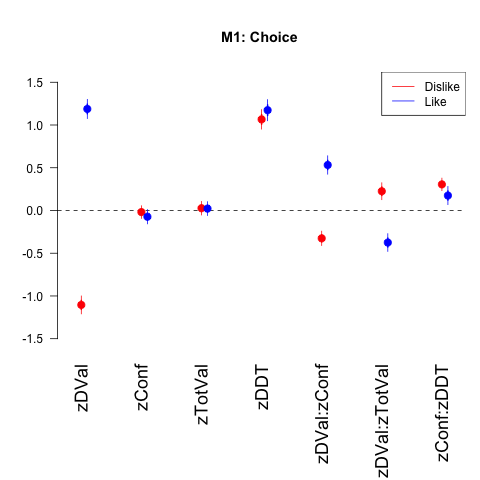

In [153]:
%%R
# Figure replicating Folke 2016.

title_plot = "M1: Choice "

ModelChoiceL_1 <- glm(Choice ~ zDVal + zConf + zTotVal + zDVal:zConf + zDVal:zTotVal + zDDT + zConf:zDDT, data=data_exp1_Like, family=binomial(link="logit"))
ModelChoiceD_1 <- glm(Choice ~ zDVal + zConf + zTotVal + zDVal:zConf + zDVal:zTotVal + zDDT + zConf:zDDT, data=data_exp1_DisLike, family=binomial(link="logit"))

coefplot(ModelChoiceD_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-1.5, 1.5) ,main=title_plot)
coefplot(ModelChoiceL_1, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

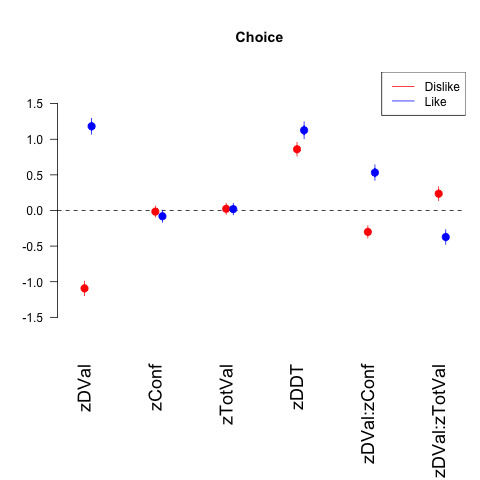

In [30]:
%%R
# Figure replicating Folke 2016.

title_plot = "Choice "

ModelChoiceL_1 <- glm(Choice ~ zDVal + zConf + zTotVal + zDVal:zConf + zDVal:zTotVal + zDDT , data=data_exp1_Like, family=binomial(link="logit"))
ModelChoiceD_1 <- glm(Choice ~ zDVal + zConf + zTotVal + zDVal:zConf + zDVal:zTotVal + zDDT , data=data_exp1_DisLike, family=binomial(link="logit"))

coefplot(ModelChoiceD_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-1.8, 1.8) ,main=title_plot)
coefplot(ModelChoiceL_1, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

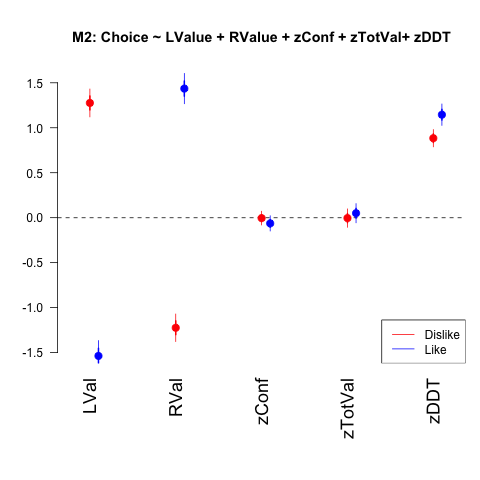

In [31]:
%%R
title_plot = ("M2: Choice ~ LValue + RValue + zConf + zTotVal+ zDDT")

ModelChoiceL_3 <- glm(Choice ~ LVal + RVal + zConf + zTotVal+ zDDT , data=data_exp1_Like, family=binomial(link="logit"))
ModelChoiceD_3 <- glm(Choice ~ LVal + RVal + zConf + zTotVal + zDDT , data=data_exp1_DisLike, family=binomial(link="logit"))

#print(summary(ModelChoiceL_3))

coefplot(ModelChoiceD_3,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-1.5, 1.5) ,main=title_plot)
coefplot(ModelChoiceL_3, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("bottomright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

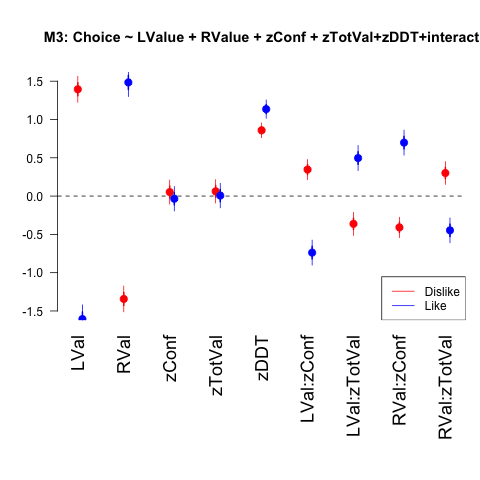

In [32]:
%%R

title_plot = ("M3: Choice ~ LValue + RValue + zConf + zTotVal+zDDT+interact")

ModelChoiceL_4 <- glm(Choice ~ LVal + RVal + zConf + zTotVal+ zDDT + LVal:zConf + LVal:zTotVal + RVal:zConf + RVal:zTotVal, data=data_exp1_Like, family=binomial(link="logit"))
ModelChoiceD_4 <- glm(Choice ~ LVal + RVal + zConf + zTotVal + zDDT + LVal:zConf + LVal:zTotVal + RVal:zConf + RVal:zTotVal, data=data_exp1_DisLike, family=binomial(link="logit"))

coefplot(ModelChoiceD_4,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(10,4,5,1) ,ylim=c(-1.5, 1.5) ,main=title_plot)
coefplot(ModelChoiceL_4, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(10,4,5,1))
legend("bottomright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

### Confidence regression

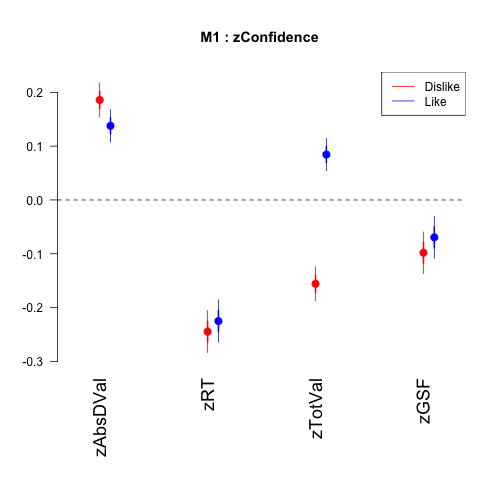

In [33]:
%%R
# Figure replicating Folke 2016. 
title_plot = ("M1 : zConfidence ")

ModelConfidenceL_1 <- glm(zConf ~ zAbsDVal + zRT  + zTotVal + zGSF , data=data_exp1_Like)
ModelConfidenceD_1 <- glm(zConf ~ zAbsDVal + zRT + zTotVal + zGSF , data=data_exp1_DisLike)

#summary(logitMod_FF2017)
#summary(logitModLike_FF2017)
#summary(logitModUnlike_FF2017)

coefplot(ModelConfidenceD_1,intercept=FALSE, vertical = FALSE, col.pts="red", cex.var=1.5, cex.pts=2, offset = 0.05, mar = c(8,4,5,1) ,main=title_plot)
coefplot(ModelConfidenceL_1, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1),main="RegEstim")
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

ValCh: Value Chosen Item 

ValUnCh: Value Unchosen Item

[1] "Like BIC:"
[1] 9676.692
[1] "DisLike BIC:"
[1] 10177.71


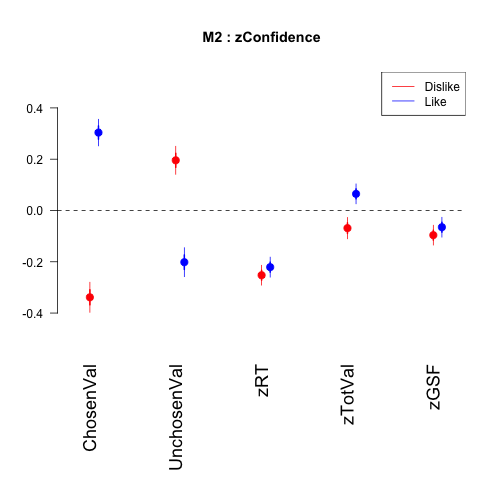

In [34]:
%%R
#title
title_plot = ("M2 : zConfidence")

ModelConfidenceL_2 <- glm(zConf ~  ChosenVal + UnchosenVal + zRT + zTotVal + zGSF, data=data_exp1_Like)
ModelConfidenceD_2 <- glm(zConf ~  ChosenVal + UnchosenVal + zRT + zTotVal + zGSF, data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_2)
BIC2 = BIC(ModelConfidenceD_2)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_2,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-.5, .5) ,main=title_plot)
coefplot(ModelConfidenceL_2, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 34042.1
[1] "DisLike BIC:"
[1] 34791.95


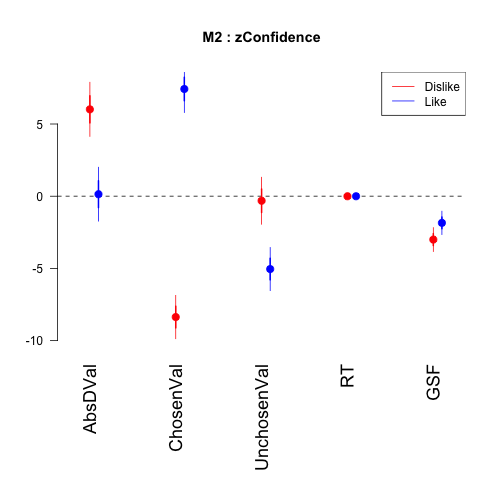

In [35]:
%%R
#title
title_plot = ("M2 : zConfidence")

ModelConfidenceL_2 <- glm(Conf ~ AbsDVal+ ChosenVal + UnchosenVal + RT + GSF, data=data_exp1_Like)
ModelConfidenceD_2 <- glm(Conf ~ AbsDVal+ ChosenVal + UnchosenVal + RT + GSF, data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_2)
BIC2 = BIC(ModelConfidenceD_2)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_2,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,main=title_plot)
coefplot(ModelConfidenceL_2, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 9658.131
[1] "DisLike BIC:"
[1] 10127.92


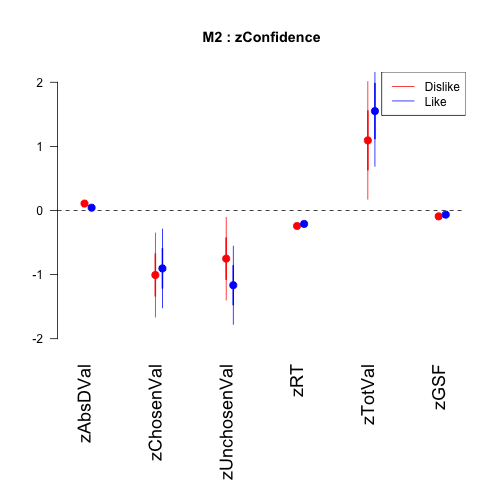

In [36]:
%%R
#title
title_plot = ("M2 : zConfidence")

ModelConfidenceL_2 <- glm(zConf ~ zAbsDVal + zChosenVal + zUnchosenVal + zRT + zTotVal + zGSF, data=data_exp1_Like)
ModelConfidenceD_2 <- glm(zConf ~ zAbsDVal +  zChosenVal + zUnchosenVal + zRT + zTotVal + zGSF, data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_2)
BIC2 = BIC(ModelConfidenceD_2)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_2,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-2, 2) ,main=title_plot)
coefplot(ModelConfidenceL_2, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 9679.703
[1] "DisLike BIC:"
[1] 10180.5


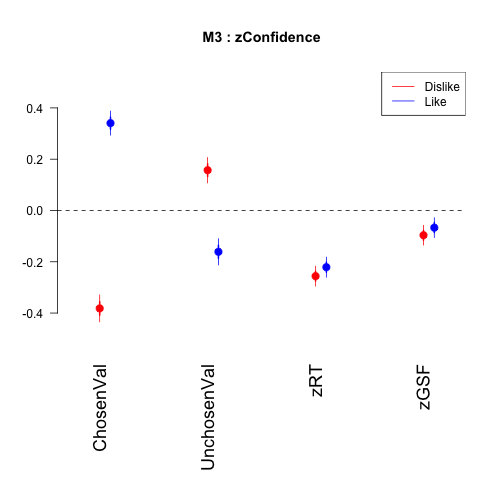

In [37]:
%%R
#title
title_plot = ("M3 : zConfidence")

ModelConfidenceL_2 <- glm(zConf ~  ChosenVal + UnchosenVal + zRT + zGSF, data=data_exp1_Like)
ModelConfidenceD_2 <- glm(zConf ~  ChosenVal + UnchosenVal + zRT + zGSF, data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_2)
BIC2 = BIC(ModelConfidenceD_2)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_2,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-.5, .5) ,main=title_plot)
coefplot(ModelConfidenceL_2, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 9798.191
[1] "DisLike BIC:"
[1] 10344.15


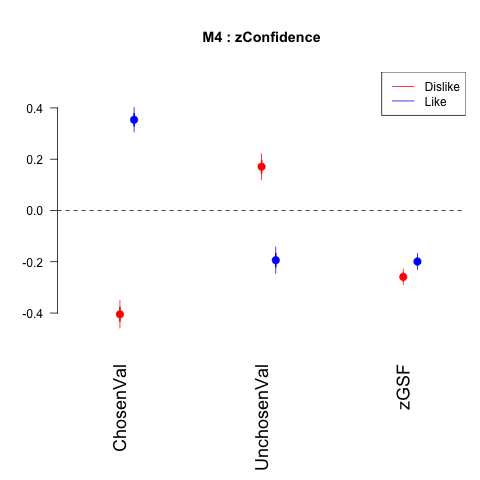

In [38]:
%%R
#title
title_plot = ("M4 : zConfidence")

ModelConfidenceL_2 <- glm(zConf ~  ChosenVal + UnchosenVal  + zGSF, data=data_exp1_Like)
ModelConfidenceD_2 <- glm(zConf ~  ChosenVal + UnchosenVal + zGSF, data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_2)
BIC2 = BIC(ModelConfidenceD_2)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_2,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-.5, .5) ,main=title_plot)
coefplot(ModelConfidenceL_2, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

<a id='regPart'></a>
# 3.2. Generate regression plots for condition and individual participants 
## ChoiceITM~ BehavioralParams + DDT

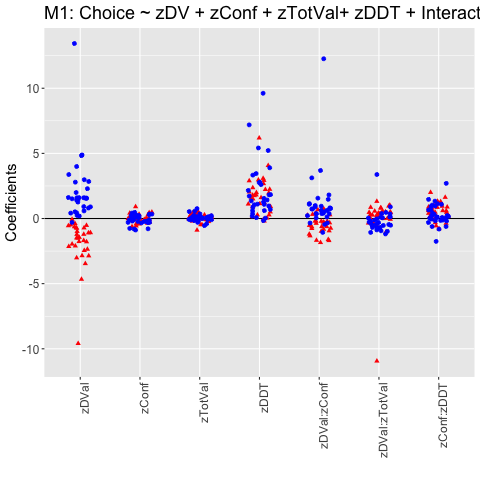

In [39]:
%%R
#Run for all the participants

#Define number of regressors to use
numCol = 7
# Extract values for LIKE Regression
#Initialize the matrix
partCoefs <- matrix(, nrow = 0, ncol = numCol)

for (i in unique(data_exp1_Like[,"Part"])){
    data_rgrs_subj  <- data_exp1_Like[ which(data_exp1_Like$Part==i), ]
    rsults <- glm(Choice ~ zDVal + zConf + zTotVal + zDVal:zConf + zDVal:zTotVal + zDDT + zConf:zDDT, data=data_rgrs_subj, family=binomial(link="logit"))
    # To avoid plotting the intercept
    partCoefs <- rbind(partCoefs,summary(rsults)$coefficients[2:(numCol+1)])      
}

#transform coefficiencts by participant vector to dataframe
CoefsDataFrameLike <- data.frame(partCoefs)

#extract the name of the coefficients
a <- names (rsults$coefficients)

#replace names for coefficients in dataframe
for (j in 2: length(a)){
    colnames(CoefsDataFrameLike)[j-1] <- a[j]
}
CoefsDataFrameLike

#print(rsults)
#print(CoefsDataFrameLike)

# Extract values for DISLIKE Regression
#Initialize the matrix
partCoefs <- matrix(, nrow = 0, ncol = numCol)
for (i in unique(data_exp1_DisLike[,"Part"])){
    data_rgrs_subj  <- data_exp1_DisLike[ which(data_exp1_DisLike$Part==i), ]
    rsults <- glm(Choice ~ zDVal + zConf + zTotVal + zDVal:zConf + zDVal:zTotVal + zDDT + zConf:zDDT, data=data_rgrs_subj, family=binomial(link="logit"))
    # To avoid plotting the intercept
    partCoefs <- rbind(partCoefs,summary(rsults)$coefficients[2:(numCol+1)])      
}
#transform coefficiencts by participant vector to dataframe
CoefsDataFrameDislike <- data.frame(partCoefs)
#extract the name of the coefficients
a <- names (rsults$coefficients)
#replace names for coefficients in dataframe
for (j in 2: length (a)){
    colnames(CoefsDataFrameDislike)[j-1] <- a[j]
}

CoefsDataFrameDislike

jitter <- position_jitter(width = 0.2)
plot2 <- ggplot()  + geom_hline(yintercept = 0) + 
      geom_point(data = melt(CoefsDataFrameDislike),aes(x=variable, y=value), shape = 17, color='red', position = jitter) +
      geom_point(data = melt(CoefsDataFrameLike), aes(x=variable, y=value),color='blue', position = jitter) + labs(x = "", y = "Coefficients") +
      ggtitle("M1: Choice ~ zDV + zConf + zTotVal+ zDDT + Interactions") + theme(legend.position="Top",text = element_text(size=15),
        axis.text.x = element_text(angle=90, hjust=1))



#save as an image
#ggsave("Output/Choice_Reg_Participant.tiff", units="in", width=6, height=4, dpi=300, compression = 'lzw')
plot2

## Confidence ~ BehavParams + GSF

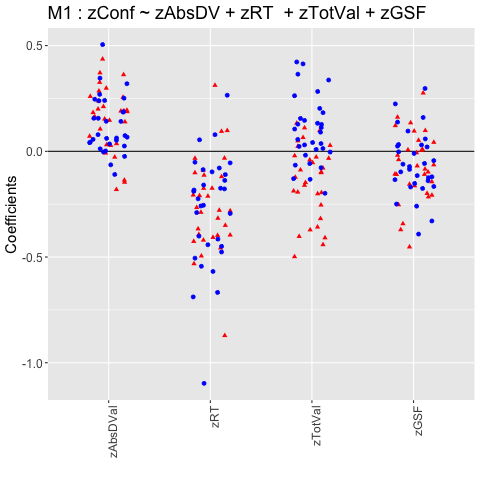

In [40]:
%%R
#Generate regression plots for individual participants 

#Run for all the participants
numCol = 4
# Extract values for LIKE Regression
#Initialize the matrix
partCoefs <- matrix(, nrow = 0, ncol = numCol)
for (i in unique(data_exp1_Like[,"Part"])){
data_rgrs_subj  <- data_exp1_Like[ which(data_exp1_Like$Part==i), ]
rsults <- glm(zConf ~ zAbsDVal + zRT  + zTotVal + zGSF, data=data_rgrs_subj)
#print(summary(rsults)$coefficients )
partCoefs <- rbind(partCoefs,summary(rsults)$coefficients[2:(numCol+1)])      
}

#transform coefficiencts by participant vector to dataframe
CoefsDataFrameLike <- data.frame(partCoefs)
#extract the name of the coefficients
a <- names (rsults$coefficients)
#replace names for coefficients in dataframe
for (j in 2: length (a)){
colnames(CoefsDataFrameLike)[j-1] <- a[j]
}
CoefsDataFrameLike

#print(rsults)
#print(CoefsDataFrameLike)



# Extract values for DISLIKE Regression
#Initialize the matrix
partCoefs <- matrix(, nrow = 0, ncol = numCol)
for (i in unique(data_exp1_DisLike[,"Part"])){
data_rgrs_subj  <- data_exp1_DisLike[ which(data_exp1_DisLike$Part==i), ]
rsults <- glm(zConf ~ zAbsDVal + zRT  + zTotVal + zGSF, data=data_rgrs_subj)
#print(summary(rsults)$coefficients )
partCoefs <- rbind(partCoefs,summary(rsults)$coefficients[2:(numCol+1)])      
}
#transform coefficiencts by participant vector to dataframe
CoefsDataFrameDislike <- data.frame(partCoefs)
#extract the name of the coefficients
a <- names (rsults$coefficients)
#replace names for coefficients in dataframe
for (j in 2: length (a)){
colnames(CoefsDataFrameDislike)[j-1] <- a[j]
}
CoefsDataFrameDislike

jitter <- position_jitter(width = 0.2)
plot2 <- ggplot()  + geom_hline(yintercept = 0) + 
      geom_point(data = melt(CoefsDataFrameDislike),aes(x=variable, y=value), shape = 17, color='red', position = jitter) +
      geom_point(data = melt(CoefsDataFrameLike), aes(x=variable, y=value),color='blue', position = jitter) + labs(x = "", y = "Coefficients") +
      ggtitle("M1 : zConf ~ zAbsDV + zRT  + zTotVal + zGSF") + theme(legend.position="Top",text = element_text(size=15),
        axis.text.x = element_text(angle=90, hjust=1))
      
#ggsave("Output/Confidence_Reg_Participant.tiff", units="in", width=5, height=4, dpi=300, compression = 'lzw')

plot2


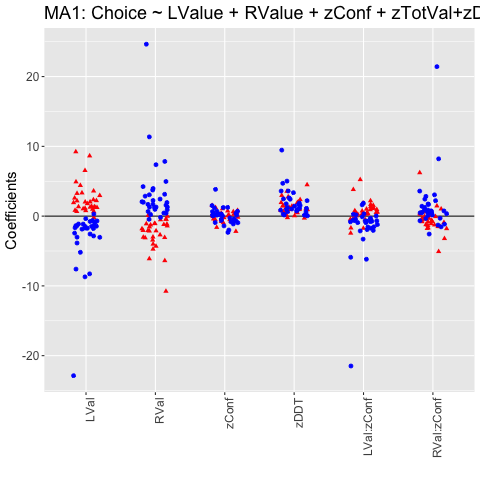

In [41]:
%%R
#Run for all the participants

#Define number of regressors to use
numCol = 6
# Extract values for LIKE Regression
#Initialize the matrix
partCoefs <- matrix(, nrow = 0, ncol = numCol)

for (i in unique(data_exp1_Like[,"Part"])){
    data_rgrs_subj  <- data_exp1_Like[ which(data_exp1_Like$Part==i), ]
    rsults <- glm(Choice ~ LVal + RVal + zConf + zDDT + LVal:zConf  + RVal:zConf  , data=data_rgrs_subj, family=binomial(link="logit"))
    # To avoid plotting the intercept
    partCoefs <- rbind(partCoefs,summary(rsults)$coefficients[2:(numCol+1)])   
   #print (rsults)
}

#transform coefficiencts by participant vector to dataframe
CoefsDataFrameLike <- data.frame(partCoefs)

#extract the name of the coefficients
a <- names (rsults$coefficients)

#replace names for coefficients in dataframe
for (j in 2: length(a)){
    colnames(CoefsDataFrameLike)[j-1] <- a[j]
}
CoefsDataFrameLike

# Extract values for DISLIKE Regression
#Initialize the matrix
partCoefs <- matrix(, nrow = 0, ncol = numCol)
for (i in unique(data_exp1_DisLike[,"Part"])){
    data_rgrs_subj  <- data_exp1_DisLike[ which(data_exp1_DisLike$Part==i), ]
    rsults <- glm(Choice ~ LVal + RVal + zConf + zDDT + LVal:zConf  + RVal:zConf, data=data_rgrs_subj, family=binomial(link="logit"))
    # To avoid plotting the intercept
    partCoefs <- rbind(partCoefs,summary(rsults)$coefficients[2:(numCol+1)])      
}

#transform coefficiencts by participant vector to dataframe
CoefsDataFrameDislike <- data.frame(partCoefs)
#extract the name of the coefficients
a <- names (rsults$coefficients)

#replace names for coefficients in dataframe
for (j in 2: length (a)){
    colnames(CoefsDataFrameDislike)[j-1] <- a[j]
}

CoefsDataFrameDislike

jitter <- position_jitter(width = 0.2)
plot2 <- ggplot()  + geom_hline(yintercept = 0) + 
      geom_point(data = melt(CoefsDataFrameDislike),aes(x=variable, y=value), shape = 17, color='red', position = jitter) +
      geom_point(data = melt(CoefsDataFrameLike), aes(x=variable, y=value),color='blue', position = jitter) + labs(x = "", y = "Coefficients") +
      ggtitle("MA1: Choice ~ LValue + RValue + zConf + zTotVal+zDDT+interactions") + theme(legend.position="Top",text = element_text(size=15),
        axis.text.x = element_text(angle=90, hjust=1))

#save as an image
#ggsave("Output/Choice_Reg_Participant.tiff", units="in", width=6, height=4, dpi=300, compression = 'lzw')
plot2


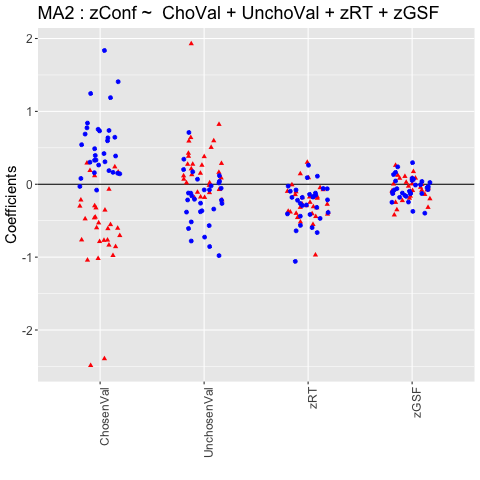

In [42]:
%%R
#Generate regression plots for individual participants 

#Run for all the participants
#Select the number of columns that correspond to actual parameter if not the matrix (and the figure) will include the values for the std errors
numCol = 4
# Extract values for LIKE Regression
#Initialize the matrix
partCoefs <- matrix(, nrow = 0, ncol = numCol)
for (i in unique(data_exp1_Like[,"Part"])){
data_rgrs_subj  <- data_exp1_Like[ which(data_exp1_Like$Part==i), ]
rsults <- glm(zConf ~  ChosenVal + UnchosenVal + zRT + zGSF, data=data_rgrs_subj)
#print(summary(rsults)$coefficients )
partCoefs <- rbind(partCoefs,summary(rsults)$coefficients[2:(numCol+1)])      
}

#transform coefficiencts by participant vector to dataframe
CoefsDataFrameLike <- data.frame(partCoefs)
#extract the name of the coefficients
a <- names (rsults$coefficients)
#replace names for coefficients in dataframe
for (j in 2: length (a)){
colnames(CoefsDataFrameLike)[j-1] <- a[j]
}
CoefsDataFrameLike

#print(rsults)
#print(CoefsDataFrameLike)

# Extract values for DISLIKE Regression
#Initialize the matrix
partCoefs <- matrix(, nrow = 0, ncol = numCol)
for (i in unique(data_exp1_DisLike[,"Part"])){
data_rgrs_subj  <- data_exp1_DisLike[ which(data_exp1_DisLike$Part==i), ]
rsults <- glm(zConf ~   ChosenVal + UnchosenVal  + zRT + zGSF, data=data_rgrs_subj)
#print(summary(rsults)$coefficients )
partCoefs <- rbind(partCoefs,summary(rsults)$coefficients[2:(numCol+1)])      
}
#transform coefficiencts by participant vector to dataframe
CoefsDataFrameDislike <- data.frame(partCoefs)
#extract the name of the coefficients
a <- names (rsults$coefficients)
#replace names for coefficients in dataframe
for (j in 2: length (a)){
colnames(CoefsDataFrameDislike)[j-1] <- a[j]
}
CoefsDataFrameDislike

jitter <- position_jitter(width = 0.2)
plot2 <- ggplot()  + geom_hline(yintercept = 0) + 
      geom_point(data = melt(CoefsDataFrameDislike),aes(x=variable, y=value), shape = 17, color='red', position = jitter) +
      geom_point(data = melt(CoefsDataFrameLike), aes(x=variable, y=value),color='blue', position = jitter) + labs(x = "", y = "Coefficients") +
      ggtitle("MA2 : zConf ~  ChoVal + UnchoVal + zRT + zGSF") + theme(legend.position="Top",text = element_text(size=15),
        axis.text.x = element_text(angle=90, hjust=1))
      
#ggsave("Output/Confidence_Reg_Participant.tiff", units="in", width=5, height=4, dpi=300, compression = 'lzw')

plot2


<a id='regressionFam'></a>
# 3.3. Familiarity regressions

<a id='ChoiceregressionFam'></a>
## 3.3.1 Choice regressions

[1] "Like BIC:"
[1] 4213.068
[1] "DisLike BIC:"
[1] 4555.881


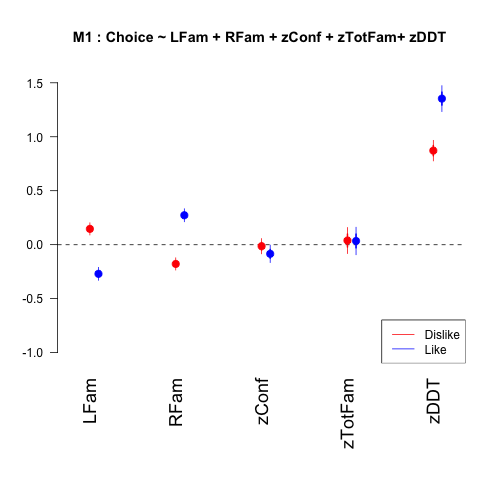

In [43]:
%%R

#attach(mtcars)
#layout(matrix(c(1,2), 1, 1, byrow = FALSE), widths=c(5,5), heights=c(5,5))

# regression for choice and familiarity
title_plot = "M1 : Choice ~ LFam + RFam + zConf + zTotFam+ zDDT "

ModelChoiceL_Fam1 <- glm(Choice ~ LFam + RFam + zConf + zTotFam+ zDDT , data=data_exp1_Like, family=binomial(link="logit"))
ModelChoiceD_Fam1 <- glm(Choice ~ LFam + RFam + zConf + zTotFam+ zDDT, data=data_exp1_DisLike, family=binomial(link="logit"))

BIC1 = BIC(ModelChoiceL_Fam1)
BIC2 = BIC(ModelChoiceD_Fam1)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelChoiceD_Fam1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-1.0, 1.5) ,main=title_plot)
coefplot(ModelChoiceL_Fam1, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("bottomright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 4188.392
[1] "DisLike BIC:"
[1] 4550.891


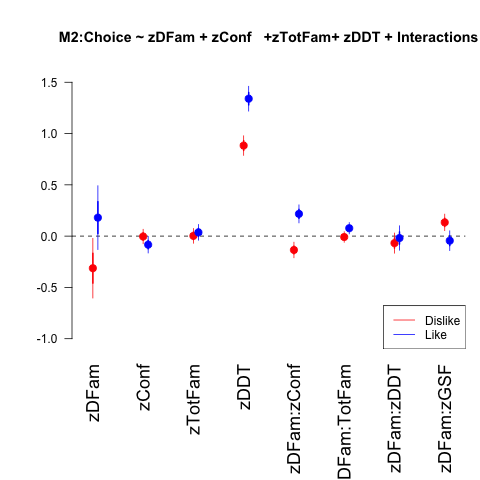

In [44]:
%%R
#regression for confidence and familiarity
title_plot = ("M2:Choice ~ zDFam + zConf   +zTotFam+ zDDT + Interactions")
ModelChoiceL_Fam2 <- glm(Choice ~ zDFam + zConf   +zTotFam+ zDDT + zDFam:zConf + zDFam:TotFam + zDFam:zDDT + zDFam:zGSF, data=data_exp1_Like, family=binomial(link="logit"))
ModelChoiceD_Fam2 <- glm(Choice ~ zDFam + zConf   +zTotFam+ zDDT + zDFam:zConf + zDFam:TotFam + zDFam:zDDT + zDFam:zGSF, data=data_exp1_DisLike, family=binomial(link="logit"))

BIC1 = BIC(ModelChoiceL_Fam2)
BIC2 = BIC(ModelChoiceD_Fam2)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelChoiceD_Fam2,intercept=FALSE, vertical = FALSE, col.pts="red", cex.var=1.5, cex.pts=2, offset = 0.05, mar = c(8,5,5,1), ylim=c(-1.0, 1.5), main=title_plot)
coefplot(ModelChoiceL_Fam2, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1),main="RegEstim")
legend("bottomright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

<a id='ConfregressionFam'></a>
## 3.3.2 Confidence regressions

[1] "Like BIC:"
[1] 9778.273
[1] "DisLike BIC:"
[1] 10381.66


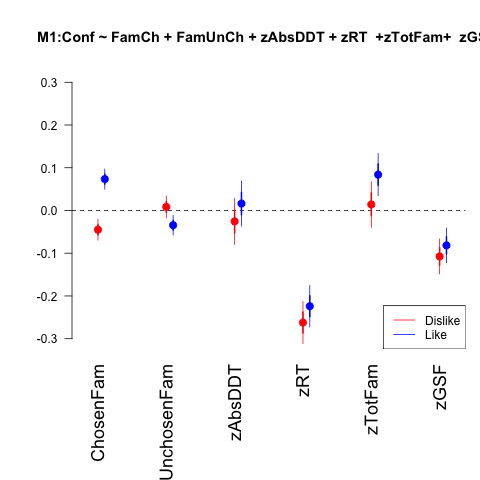

In [45]:
%%R
#regression for confidence and familiarity
title_plot = ("M1:Conf ~ FamCh + FamUnCh + zAbsDDT + zRT  +zTotFam+  zGSF ")

ModelConfidenceL_M1 <- glm(zConf ~ ChosenFam + UnchosenFam + zAbsDDT + zRT  +zTotFam+  zGSF  , data=data_exp1_Like)
ModelConfidenceD_M1 <- glm(zConf ~ ChosenFam + UnchosenFam + zAbsDDT + zRT  +zTotFam+  zGSF , data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_M1)
BIC2 = BIC(ModelConfidenceD_M1)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_M1,intercept=FALSE, vertical = FALSE, col.pts="red", cex.var=1.5, cex.pts=2, offset = 0.05, mar = c(8,5,5,1), ylim=c(-0.3, 0.3), main=title_plot)
coefplot(ModelConfidenceL_M1, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1),main="RegEstim")
legend("bottomright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 9820.629
[1] "DisLike BIC:"
[1] 10389.97


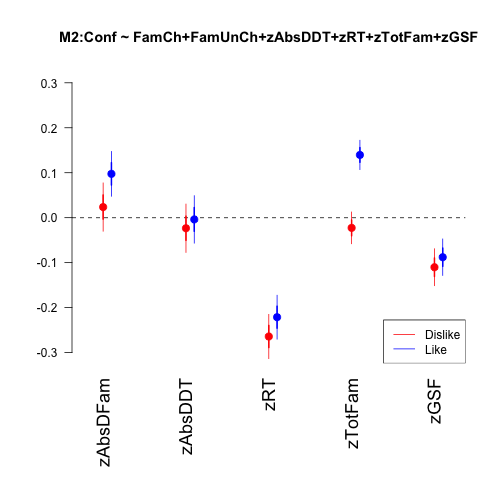

In [46]:
%%R
#regression for confidence and familiarity
title_plot = ("M2:Conf ~ FamCh+FamUnCh+zAbsDDT+zRT+zTotFam+zGSF")

ModelConfidenceL_M2 <- glm(zConf ~ zAbsDFam + zAbsDDT + zRT  +zTotFam+  zGSF  , data=data_exp1_Like)
ModelConfidenceD_M2 <- glm(zConf ~ zAbsDFam  + zAbsDDT + zRT  +zTotFam+  zGSF , data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_M2)
BIC2 = BIC(ModelConfidenceD_M2)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_M2,intercept=FALSE, vertical = FALSE, col.pts="red", cex.var=1.5, cex.pts=2, offset = 0.05, mar = c(8,5,5,1), ylim=c(-0.3, 0.3), main=title_plot)
coefplot(ModelConfidenceL_M2, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1),main="RegEstim")
legend("bottomright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

<a id='VplusFregressionFam'></a>
## 3.3.3. Value + Familiarity regressions

[1] "Like BIC:"
[1] 3612.572
[1] "DisLike BIC:"
[1] 3999.6


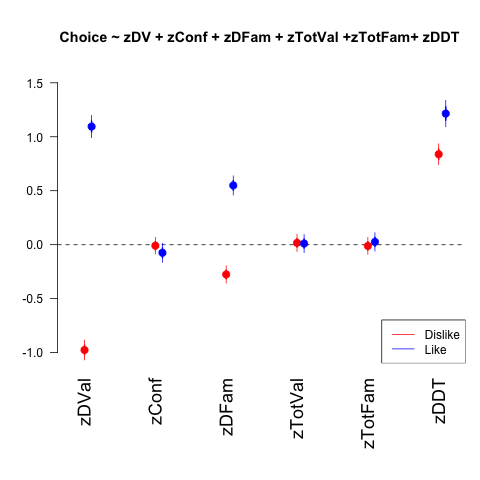

In [47]:
%%R
# regression for choice and familiarity
title_plot = "Choice ~ zDV + zConf + zDFam + zTotVal +zTotFam+ zDDT "

ModelChoiceL_2 <- glm(Choice ~ zDVal + zConf + zDFam + zTotVal +zTotFam+ zDDT , data=data_exp1_Like, family=binomial(link="logit"))
ModelChoiceD_2 <- glm(Choice ~ zDVal + zConf + zDFam + zTotVal+ zTotFam+ zDDT, data=data_exp1_DisLike, family=binomial(link="logit"))

BIC1 = BIC(ModelChoiceL_2)
BIC2 = BIC(ModelChoiceD_2)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelChoiceD_2,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-1.0, 1.5) ,main=title_plot)
coefplot(ModelChoiceL_2, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("bottomright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 9714.937
[1] "DisLike BIC:"
[1] 10221.78


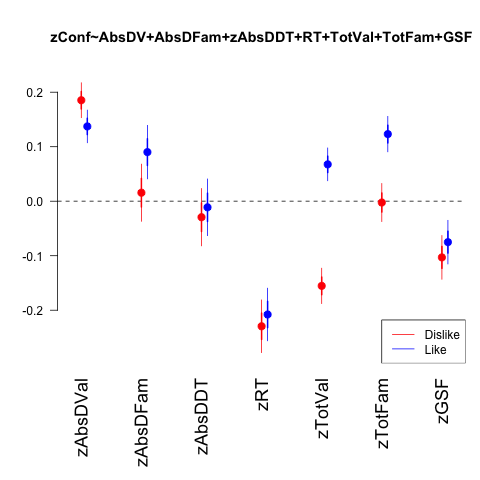

In [48]:
%%R
#regression for confidence and familiarity
title_plot = ("zConf~AbsDV+AbsDFam+zAbsDDT+RT+TotVal+TotFam+GSF")

ModelConfidenceL_M3 <- glm(zConf ~ zAbsDVal + zAbsDFam + zAbsDDT + zRT  + zTotVal +zTotFam+  zGSF , data=data_exp1_Like)
ModelConfidenceD_M3 <- glm(zConf ~ zAbsDVal  +zAbsDFam + zAbsDDT + zRT + zTotVal +zTotFam+ zGSF, data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_M3)
BIC2 = BIC(ModelConfidenceD_M3)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_M3,intercept=FALSE, vertical = FALSE, col.pts="red", cex.var=1.5, cex.pts=2, offset = 0.05, mar = c(8,4,5,1) ,main=title_plot)
coefplot(ModelConfidenceL_M3, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1),main="RegEstim")
legend("bottomright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 9712.877
[1] "DisLike BIC:"
[1] 10231.78


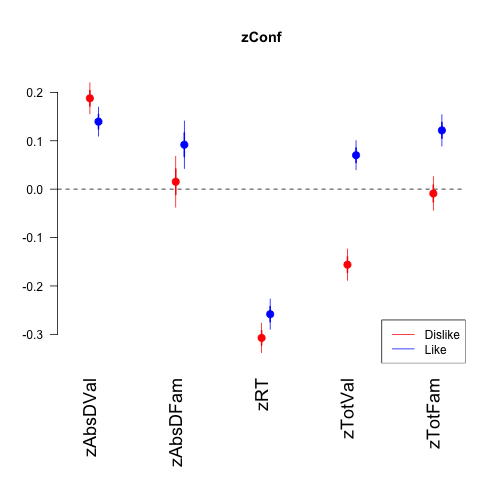

In [49]:
%%R
#regression for confidence and familiarity
title_plot = ("zConf")

ModelConfidenceL_M3 <- glm(zConf ~ zAbsDVal + zAbsDFam +  zRT  + zTotVal +zTotFam , data=data_exp1_Like)
ModelConfidenceD_M3 <- glm(zConf ~ zAbsDVal  +zAbsDFam +  zRT + zTotVal +zTotFam, data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_M3)
BIC2 = BIC(ModelConfidenceD_M3)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_M3,intercept=FALSE, vertical = FALSE, col.pts="red", cex.var=1.5, cex.pts=2, offset = 0.05, mar = c(8,4,5,1) ,main=title_plot)
coefplot(ModelConfidenceL_M3, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1),main="RegEstim")
legend("bottomright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

In [50]:
## ** We don't observe an inversion for TotFam

[1] "Like BIC:"
[1] 10121.56
[1] "DisLike BIC:"
[1] 10698.46


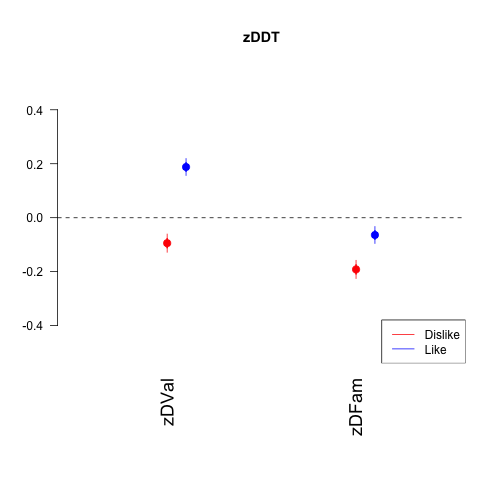

In [51]:
%%R
#regression for confidence and familiarity
title_plot = ("zDDT")

ModelConfidenceL_M3 <- glm(zDDT ~ zDVal + zDFam, data=data_exp1_Like)
ModelConfidenceD_M3 <- glm(zDDT ~ zDVal + zDFam, data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_M3)
BIC2 = BIC(ModelConfidenceD_M3)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_M3,intercept=FALSE, vertical = FALSE, col.pts="red", cex.var=1.5, cex.pts=2, offset = 0.05, mar = c(8,4,5,1),ylim=c(-0.5, 0.5)  ,main=title_plot)
coefplot(ModelConfidenceL_M3, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1),main="RegEstim")
legend("bottomright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 10132.9
[1] "DisLike BIC:"
[1] 10885.55


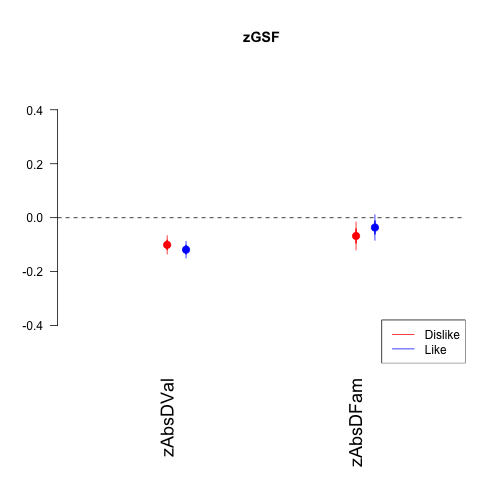

In [52]:
%%R
#regression for confidence and familiarity
title_plot = ("zGSF")

ModelConfidenceL_M3 <- glm(zGSF ~ zAbsDVal + zAbsDFam, data=data_exp1_Like)
ModelConfidenceD_M3 <- glm(zGSF ~ zAbsDVal + zAbsDFam, data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_M3)
BIC2 = BIC(ModelConfidenceD_M3)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_M3,intercept=FALSE, vertical = FALSE, col.pts="red", cex.var=1.5, cex.pts=2, offset = 0.05, mar = c(8,4,5,1),ylim=c(-0.5, 0.5)  ,main=title_plot)
coefplot(ModelConfidenceL_M3, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1),main="RegEstim")
legend("bottomright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 7955.189
[1] "DisLike BIC:"
[1] 8443.596


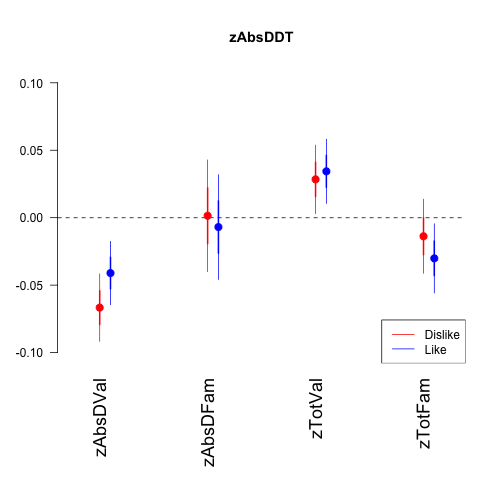

In [55]:
%%R
#regression for confidence and familiarity
title_plot = ("zAbsDDT")

ModelConfidenceL_M3 <- glm(zAbsDDT ~ zAbsDVal + zAbsDFam + zTotVal +zTotFam, data=data_exp1_Like)
ModelConfidenceD_M3 <- glm(zAbsDDT ~ zAbsDVal + zAbsDFam + zTotVal +zTotFam, data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_M3)
BIC2 = BIC(ModelConfidenceD_M3)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_M3,intercept=FALSE, vertical = FALSE, col.pts="red", cex.var=1.5, cex.pts=2, offset = 0.05, mar = c(8,4,5,1),ylim=c(-0.1, 0.1)  ,main=title_plot)
coefplot(ModelConfidenceL_M3, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1),main="RegEstim")
legend("bottomright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

<a id='ChoicFactregressionFam'></a>
## 3.3.4. Choice factors familiarity regressions

[1] "Like BIC:"
[1] 10469.74
[1] "DisLike BIC:"
[1] 10495.12


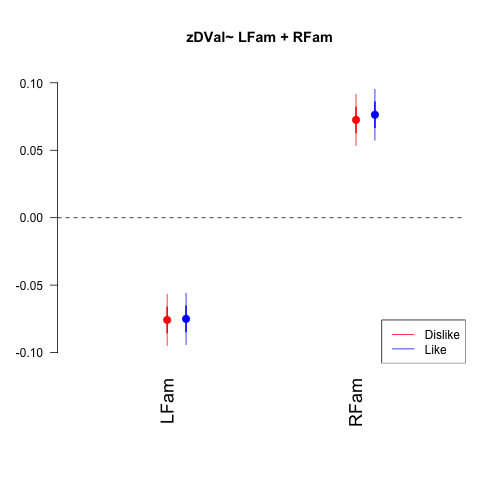

In [94]:
%%R
#regression for confidence and familiarity
title_plot = ("zDVal~ LFam + RFam ")

ModelConfidenceL_M3 <- glm(zDVal~ LFam + RFam  , data=data_exp1_Like)
ModelConfidenceD_M3 <- glm(zDVal~ LFam + RFam , data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_M3)
BIC2 = BIC(ModelConfidenceD_M3)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_M3,intercept=FALSE, vertical = FALSE, col.pts="red", cex.var=1.5, cex.pts=2, offset = 0.05, mar = c(8,4,5,1), ylim=c(-0.1, 0.1),main=title_plot)
coefplot(ModelConfidenceL_M3, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1),main="RegEstim")
legend("bottomright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 10144.2
[1] "DisLike BIC:"
[1] 10715.66


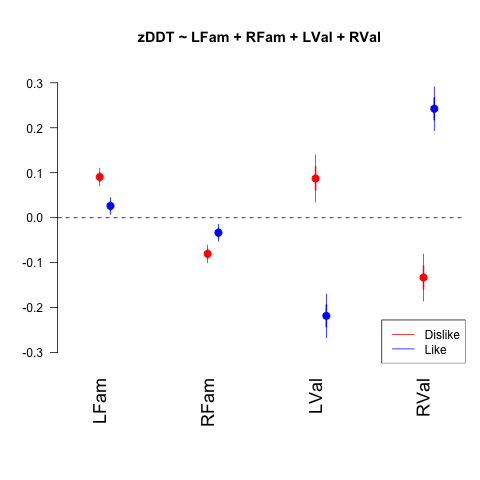

In [95]:
%%R
#regression for confidence and familiarity
title_plot = ("zDDT ~ LFam + RFam + LVal + RVal ")

ModelConfidenceL_M3 <- glm(zDDT ~ LFam + RFam + LVal + RVal, data=data_exp1_Like)
ModelConfidenceD_M3 <- glm(zDDT ~ LFam + RFam + LVal + RVal, data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_M3)
BIC2 = BIC(ModelConfidenceD_M3)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_M3,intercept=FALSE, vertical = FALSE, col.pts="red", cex.var=1.5, cex.pts=2, offset = 0.05, mar = c(8,4,5,1), ylim=c(-0.3, 0.3),main=title_plot)
coefplot(ModelConfidenceL_M3, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1),main="RegEstim")
legend("bottomright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 10128.6
[1] "DisLike BIC:"
[1] 10881.44


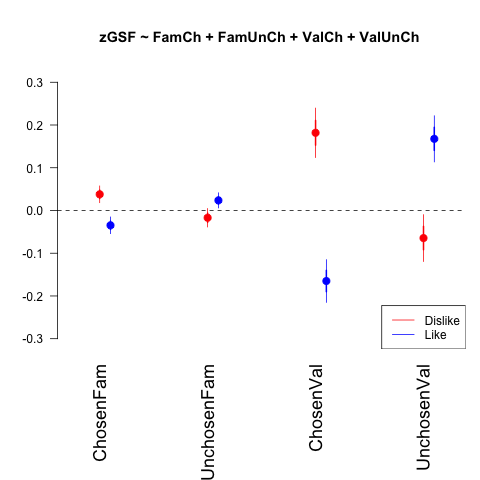

In [96]:
%%R
#regression for confidence and familiarity
title_plot = ("zGSF ~ FamCh + FamUnCh + ValCh + ValUnCh ")

ModelConfidenceL_M3 <- glm(zGSF ~ ChosenFam + UnchosenFam + ChosenVal + UnchosenVal, data=data_exp1_Like)
ModelConfidenceD_M3 <- glm(zGSF ~ ChosenFam + UnchosenFam + ChosenVal + UnchosenVal, data=data_exp1_DisLike)

#ModelConfidenceL_M3 <- glm(zGSF ~ abszDFam  + absDV, data=data_exp1_Like)
#ModelConfidenceD_M3 <- glm(zGSF ~ abszDFam  + absDV, data=data_exp1_DisLike)



BIC1 = BIC(ModelConfidenceL_M3)
BIC2 = BIC(ModelConfidenceD_M3)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_M3,intercept=FALSE, vertical = FALSE, col.pts="red" , cex.var=1.5, cex.pts=2, offset = 0.05, mar = c(8,4,5,1), ylim=c(-0.3, 0.3),main=title_plot)
coefplot(ModelConfidenceL_M3, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1),main="RegEstim")
legend("bottomright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

<a id='RequestregressionFam'></a>
## 3.3.5 BdM Familiarity-Value requested regressions

[1] "Like BIC:"
[1] 3605.288
[1] "DisLike BIC:"
[1] 3990.586


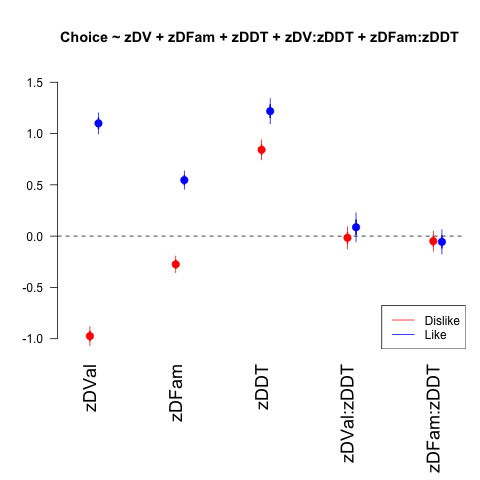

In [97]:
%%R
# regression for choice and familiarity
title_plot = "Choice ~ zDV + zDFam + zDDT + zDV:zDDT + zDFam:zDDT "

ModelChoiceL_2 <- glm(Choice ~ zDVal + zDFam + zDDT + zDVal:zDDT + zDFam:zDDT, data=data_exp1_Like, family=binomial(link="logit"))
ModelChoiceD_2 <- glm(Choice ~ zDVal + zDFam + zDDT + zDVal:zDDT + zDFam:zDDT, data=data_exp1_DisLike, family=binomial(link="logit"))

BIC1 = BIC(ModelChoiceL_2)
BIC2 = BIC(ModelChoiceD_2)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelChoiceD_2,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-1.0, 1.5) ,main=title_plot)
coefplot(ModelChoiceL_2, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("bottomright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 4043.644
[1] "DisLike BIC:"
[1] 4299.853


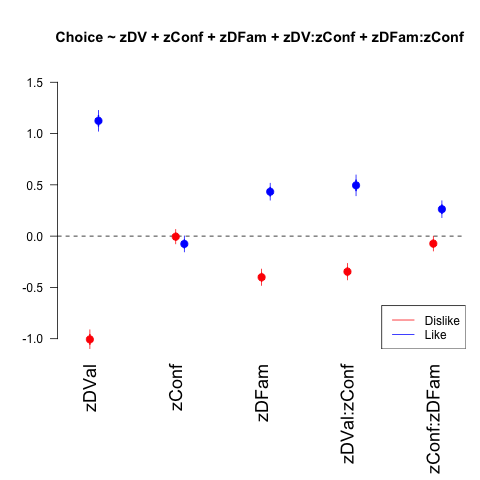

In [98]:
%%R
# regression for choice and familiarity
title_plot = "Choice ~ zDV + zConf + zDFam + zDV:zConf + zDFam:zConf "

ModelChoiceL_2 <- glm(Choice ~ zDVal + zConf + zDFam + zDVal:zConf + zDFam:zConf, data=data_exp1_Like, family=binomial(link="logit"))
ModelChoiceD_2 <- glm(Choice ~ zDVal + zConf + zDFam + zDVal:zConf + zDFam:zConf, data=data_exp1_DisLike, family=binomial(link="logit"))

BIC1 = BIC(ModelChoiceL_2)
BIC2 = BIC(ModelChoiceD_2)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelChoiceD_2,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-1.0, 1.5) ,main=title_plot)
coefplot(ModelChoiceL_2, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("bottomright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 9788.542
[1] "DisLike BIC:"
[1] 10392.84


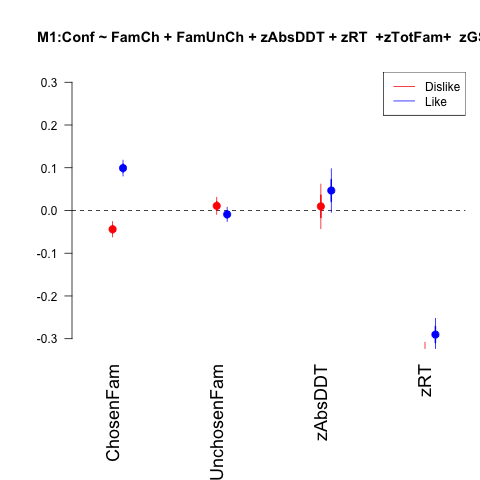

In [99]:
%%R
#regression for confidence and familiarity
title_plot = ("M1:Conf ~ FamCh + FamUnCh + zAbsDDT + zRT  +zTotFam+  zGSF ")

ModelConfidenceL_M1 <- glm(zConf ~ ChosenFam + UnchosenFam + zAbsDDT + zRT   , data=data_exp1_Like)
ModelConfidenceD_M1 <- glm(zConf ~ ChosenFam + UnchosenFam + zAbsDDT + zRT  , data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_M1)
BIC2 = BIC(ModelConfidenceD_M1)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_M1,intercept=FALSE, vertical = FALSE, col.pts="red", cex.var=1.5, cex.pts=2, offset = 0.05, mar = c(8,5,5,1), ylim=c(-0.3, 0.3), main=title_plot)
coefplot(ModelConfidenceL_M1, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1),main="RegEstim")
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 9793.572
[1] "DisLike BIC:"
[1] 10318.75


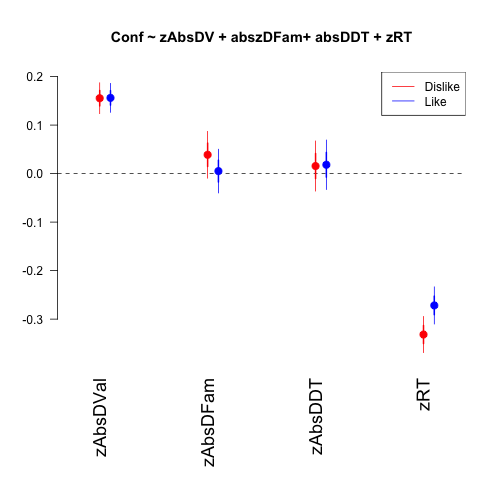

In [100]:
%%R
#regression for confidence and familiarity
title_plot = ("Conf ~ zAbsDV + abszDFam+ absDDT + zRT")

ModelConfidenceL_M3 <- glm(zConf ~ zAbsDVal + zAbsDFam+ zAbsDDT + zRT , data=data_exp1_Like)
ModelConfidenceD_M3 <- glm(zConf ~ zAbsDVal  +zAbsDFam+ zAbsDDT + zRT , data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_M3)
BIC2 = BIC(ModelConfidenceD_M3)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_M3,intercept=FALSE, vertical = FALSE, col.pts="red", cex.var=1.5, cex.pts=2, offset = 0.05, mar = c(8,4,5,1) ,main=title_plot)
coefplot(ModelConfidenceL_M3, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1),main="RegEstim")
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

## 3.4 Reaction time regression

[1] "Like BIC:"
[1] 10081.68
[1] "DisLike BIC:"
[1] 10812.89


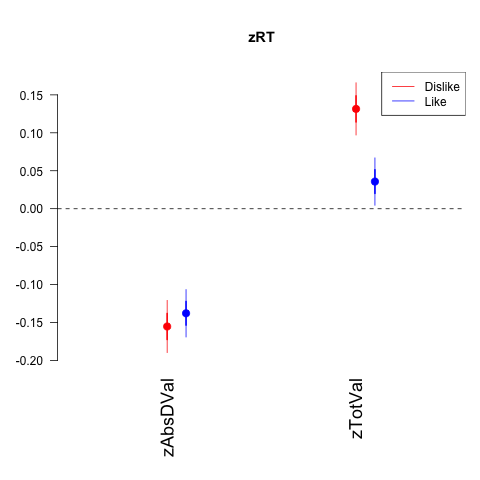

In [101]:
%%R
#regression for confidence and familiarity
title_plot = ("zRT")

ModelConfidenceL_M3 <- glm(zRT ~ zAbsDVal + zTotVal, data=data_exp1_Like)
ModelConfidenceD_M3 <- glm(zRT ~ zAbsDVal + zTotVal , data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_M3)
BIC2 = BIC(ModelConfidenceD_M3)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_M3,intercept=FALSE, vertical = FALSE, col.pts="red", cex.var=1.5, cex.pts=2, offset = 0.05, mar = c(8,4,5,1) ,main=title_plot)
coefplot(ModelConfidenceL_M3, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1),main="RegEstim")
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 10024.68
[1] "DisLike BIC:"
[1] 10599.73


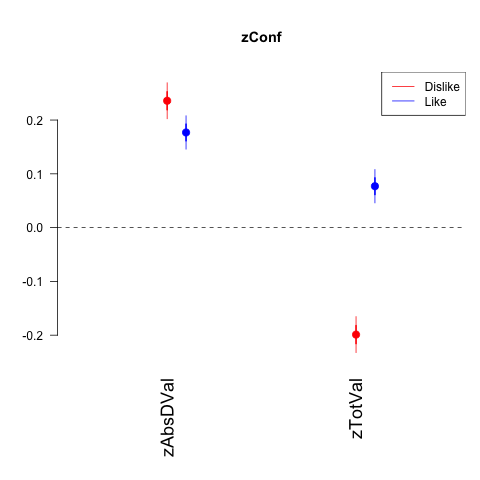

In [102]:
%%R
#regression for confidence and familiarity
title_plot = ("zConf")

ModelConfidenceL_M3 <- glm(zConf ~ zAbsDVal + zTotVal, data=data_exp1_Like)
ModelConfidenceD_M3 <- glm(zConf ~ zAbsDVal + zTotVal , data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_M3)
BIC2 = BIC(ModelConfidenceD_M3)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_M3,intercept=FALSE, vertical = FALSE, col.pts="red", cex.var=1.5, cex.pts=2, offset = 0.05, mar = c(8,4,5,1) ,main=title_plot)
coefplot(ModelConfidenceL_M3, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1),main="RegEstim")
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

## 3.5 Idea: more familiar items are linked to one of the contexts (does not seems to be the case)

[1] "Like BIC:"
[1] 9720.238
[1] "DisLike BIC:"
[1] 10213.91


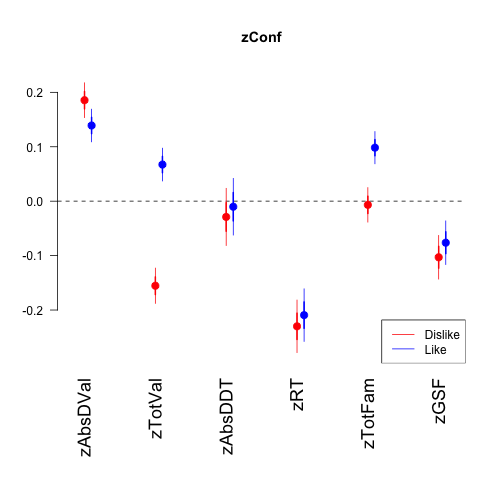

In [107]:
%%R
#regression for confidence and familiarity
title_plot = ("zConf")

ModelConfidenceL_M3 <- glm(zConf ~ zAbsDVal + zTotVal + zAbsDDT + zRT  + zTotVal +zTotFam+  zGSF , data=data_exp1_Like)
ModelConfidenceD_M3 <- glm(zConf ~ zAbsDVal  +zTotVal + zAbsDDT + zRT + zTotVal +zTotFam+ zGSF, data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_M3)
BIC2 = BIC(ModelConfidenceD_M3)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_M3,intercept=FALSE, vertical = FALSE, col.pts="red", cex.var=1.5, cex.pts=2, offset = 0.05, mar = c(8,4,5,1) ,main=title_plot)
coefplot(ModelConfidenceL_M3, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1),main="RegEstim")
legend("bottomright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 10075.54
[1] "DisLike BIC:"
[1] 10818.85


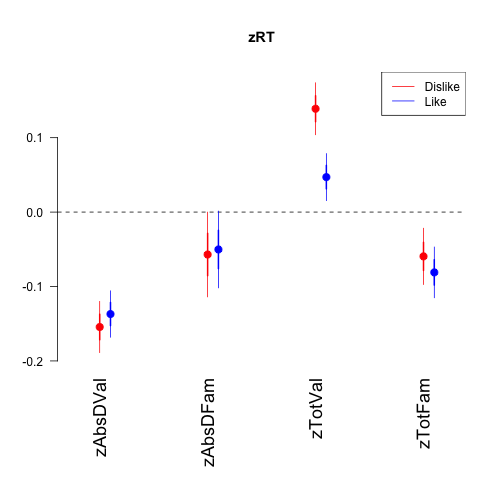

In [116]:
%%R
#regression for confidence and familiarity
title_plot = ("zRT")

ModelConfidenceL_M3 <- glm(zRT ~ zAbsDVal + zAbsDFam + zTotVal   + zTotVal +zTotFam , data=data_exp1_Like)
ModelConfidenceD_M3 <- glm(zRT ~ zAbsDVal  + zAbsDFam +zTotVal   + zTotVal +zTotFam, data=data_exp1_DisLike)

BIC1 = BIC(ModelConfidenceL_M3)
BIC2 = BIC(ModelConfidenceD_M3)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelConfidenceD_M3,intercept=FALSE, vertical = FALSE, col.pts="red", cex.var=1.5, cex.pts=2, offset = 0.05, mar = c(8,4,5,1) ,main=title_plot)
coefplot(ModelConfidenceL_M3, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1),main="RegEstim")
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 3924.269
[1] "DisLike BIC:"
[1] 4136.784


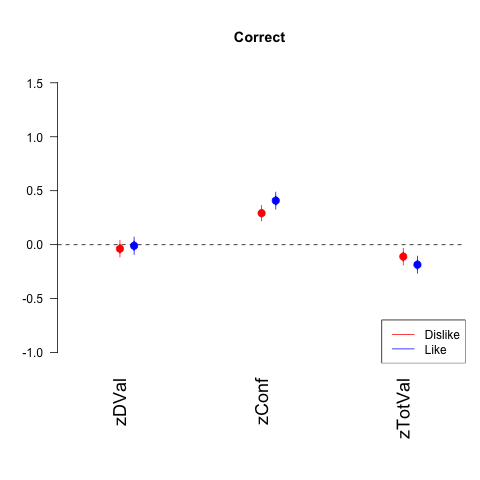

In [106]:
%%R
# regression for choice and familiarity
title_plot = "Correct "

ModelChoiceL_2 <- glm(Correct ~ zDVal + zConf + zTotVal  , data=data_exp1_Like, family=binomial(link="logit"))
ModelChoiceD_2 <- glm(Correct ~ zDVal + zConf + zTotVal , data=data_exp1_DisLike, family=binomial(link="logit"))

BIC1 = BIC(ModelChoiceL_2)
BIC2 = BIC(ModelChoiceD_2)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelChoiceD_2,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-1.0, 1.5) ,main=title_plot)
coefplot(ModelChoiceL_2, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("bottomright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

# Hierarchical model

## Choice ~ BehavioralParams + DDT

### Dislike condition model

In [1]:
%%R

if (file.exists('SavedModels/HModel_Choice_Dislike_31_m1.rda')){
    load('SavedModels/HModel_Choice_Dislike_31_m1.rda')   
    print('  Found old parameter estimates in "SavedModels/". Skipping estimation...')
}
else{
# Fit binomial hierarchical model
Choice_Dislike_hmodel =  glmer(Choice ~  zDVal + zConf + zTotVal + zDDT + zDVal:zConf + zDVal:zTotVal  + zConf:zDDT + (zDVal + zConf + zTotVal + zDDT + zDVal:zConf + zDVal:TotVal  + zConf:zDDT | Part), data=data_exp1_DisLike, family='binomial',
                    control=glmerControl(optimizer="optimx", optCtrl=list(method="nlminb")))
display (Choice_Dislike_hmodel)
}

UsageError: Cell magic `%%R` not found.


In [2]:
%%R
# If we want to see individually the value of each coefficient for the participants
#coef(Choice_Dislike_hmodel)

UsageError: Cell magic `%%R` not found.


In [3]:
%%R
#Extract parameters
fix_Choice_Dislike_hmodel <- fixef(Choice_Dislike_hmodel)
fix_se_Choice_Dislike_hmodel <- sqrt(diag(vcov(Choice_Dislike_hmodel)))
names_Choice_Dislike_hmodel <- names(fix_Choice_Dislike_hmodel)

# Extract mixed effect paramters
mix_Choice_Dislike_model <- coef(Choice_Dislike_hmodel)

summary(Choice_Dislike_hmodel)

UsageError: Cell magic `%%R` not found.


In [4]:
%R -o fix_Choice_Dislike_hmodel -o fix_se_Choice_Dislike_hmodel -o names_Choice_Dislike_hmodel -o mix_Choice_Dislike_model

#Generate table with parameters to plot
Choice_Dislike_hmodel_table = regtable(fix_Choice_Dislike_hmodel, fix_se_Choice_Dislike_hmodel, names_Choice_Dislike_hmodel)
Choice_Dislike_hmodel_table.columns = [ 'ΔVal', 'Confidence', "ΣVal", "DDT", "ΔVal\n x   \nConf", " ΔVal\n x   \nΣVal", "Conf\n x   \nDDT"]

# Extract table containing mixed effects for the model
mix_Choice_Dislike_model = mix_Choice_Dislike_model[0]

#Coefpresplot(Choice_Dislike_hmodel_table, title='', ticklabsize=16, size='narrow', ymultiple=0.5, n_ET_predictors=2)
#[i.set_color('#03719c') for i in plt.gca().get_xticklabels()[4:]]
#plt.savefig('../../figures/CoM_cut_slow_1.png', dpi=600, bbox_inches='tight')

UsageError: Line magic function `%R` not found.


### Like Condition

In [5]:
%%R
if (file.exists('SavedModels/HModel_Choice_Like_31_m1.rda')){
    load('SavedModels/HModel_Choice_Like_31_m1.rda')   
    print('  Found old parameter estimates in "SavedModels/". Skipping estimation...')
}
else{
# Fit binomial hierarchical model
Choice_Like_hmodel =  glmer(Choice ~  zDVal + zConf + zTotVal + zDDT + zDVal:zConf + zDVal:zTotVal  + zConf:zDDT + (zDVal + zConf + zTotVal + zDDT + zDVal:zConf + zDVal:TotVal  + zConf:zDDT | Part), data=data_exp1_Like, family='binomial',
                    control=glmerControl(optimizer="optimx", optCtrl=list(method="nlminb")))
display (Choice_Like_hmodel)
}

UsageError: Cell magic `%%R` not found.


In [6]:
%%R
#Extract regression parameters
fix_Choice_Like_hmodel <- fixef(Choice_Like_hmodel)
# Calculate standard error for paramters
fix_se_Choice_Like_hmodel <- sqrt(diag(vcov(Choice_Like_hmodel)))
names_Choice_Like_hmodel <- names(Choice_Like_hmodel)
summary(Choice_Like_hmodel)

UsageError: Cell magic `%%R` not found.


In [ ]:
# Extract mixed effect paramters
mix_Choice_Like_model <- coef(Choice_Like_hmodel)

In [ ]:
%R -o fix_Choice_Like_hmodel -o fix_se_Choice_Like_hmodel -o mix_Choice_Like_model
 #-o names_Choice_Like_hmodel 

# we use the same names that were defined for the predictors that in the dislike case, since they are the same in both cases
Choice_Like_hmodel_table = regtable(fix_Choice_Like_hmodel, fix_se_Choice_Like_hmodel, names_Choice_Dislike_hmodel)
Choice_Like_hmodel_table.columns = [ 'ΔVal', 'Confidence', "ΣVal", "DDT", "ΔVal\n x   \nConf", " ΔVal\n x   \nΣVal", "Conf\n x   \nDDT"]
mix_Choice_Like_model = mix_Choice_Like_model[0]

#Coefpresplot(Choice_Like_hmodel_table, title='', ticklabsize=16, size='narrow', ymultiple=0.5, n_ET_predictors=2)
#[i.set_color('#03719c') for i in plt.gca().get_xticklabels()[4:]]
#plt.savefig('../../figures/CoM_cut_slow_1.png', dpi=600, bbox_inches='tight')


### Plotting both conditions

In [ ]:
Coefpresplot2(Choice_Like_hmodel_table,Choice_Dislike_hmodel_table, title='Choice', intercept=True, ticklabsize=16, size='big', n_ET_predictors=0)

In [ ]:
Coefpresplot_bar(Choice_Dislike_hmodel_table, mix_Choice_Dislike_model, barcol ='#AC5255' ,title='Choice', intercept=True, ticklabsize=16, size='big', n_ET_predictors=0, ylimits = (-3,4))
Coefpresplot_bar(Choice_Like_hmodel_table, mix_Choice_Like_model, barcol ='#4F6A9A' ,title='Choice', intercept=True, ticklabsize=16, size='big', n_ET_predictors=0, ylimits = (-3,4))

In [ ]:
Choice_Like_hmodel_table

In [ ]:
mix_Choice_Like_model

In [ ]:
Choice_Dislike_hmodel_table

In [ ]:
mix_Choice_Dislike_model

In [ ]:
Coefpresplot_bar2(Choice_Like_hmodel_table, mix_Choice_Like_model,Choice_Dislike_hmodel_table, mix_Choice_Dislike_model, barcol1='#4F6A9A',barcol2='#AC5255', title='Choice', size='big',ymultiple=1, ticklabsize=20)
#plt.savefig('SavedFigures/Choice_Regression_Model.svg', format='svg', dpi = 500 )

### Save the results of the model

In [104]:
%%R
save(Choice_Like_hmodel, file = "SavedModels/HModel_Choice_Like_31_m1.rda")
save(Choice_Dislike_hmodel, file = "SavedModels/HModel_Choice_Dislike_31_m1.rda")



## Choice2 ~ BehavioralParams + DDT

### Dislike condition model

In [ ]:
%%R

if (file.exists('SavedModels/HModel_Choice_Dislike_31_m2.rda')){
    load('SavedModels/HModel_Choice_Dislike_31_m2.rda')   
    print('  Found old parameter estimates in "SavedModels/". Skipping estimation...')
}
else{
# Fit binomial hierarchical model
Choice_Dislike_hmodel =  glmer(Choice ~  zDVal + zConf + zTotVal + zDDT + zDVal:zConf  + (zDVal + zConf + zTotVal + zDDT + zDVal:zConf | Part), data=data_exp1_DisLike, family='binomial',
                    control=glmerControl(optimizer="optimx", optCtrl=list(method="nlminb")))
display (Choice_Dislike_hmodel)
}

In [ ]:
%%R
# If we want to see individually the value of each coefficient for the participants
#coef(Choice_Dislike_hmodel)

In [ ]:
%%R
#Extract parameters
fix_Choice_Dislike_hmodel <- fixef(Choice_Dislike_hmodel)
fix_se_Choice_Dislike_hmodel <- sqrt(diag(vcov(Choice_Dislike_hmodel)))
names_Choice_Dislike_hmodel <- names(fix_Choice_Dislike_hmodel)

# Extract mixed effect paramters
mix_Choice_Dislike_model <- coef(Choice_Dislike_hmodel)

summary(Choice_Dislike_hmodel)

In [ ]:
%R -o fix_Choice_Dislike_hmodel -o fix_se_Choice_Dislike_hmodel -o names_Choice_Dislike_hmodel -o mix_Choice_Dislike_model

#Generate table with parameters to plot
Choice_Dislike_hmodel_table = regtable(fix_Choice_Dislike_hmodel, fix_se_Choice_Dislike_hmodel, names_Choice_Dislike_hmodel)
Choice_Dislike_hmodel_table.columns = [ 'ΔVal', 'Confidence', "ΣVal", "DDT", "ΔVal\n x   \nConf"]

# Extract table containing mixed effects for the model
mix_Choice_Dislike_model = mix_Choice_Dislike_model[0]

#Coefpresplot(Choice_Dislike_hmodel_table, title='', ticklabsize=16, size='narrow', ymultiple=0.5, n_ET_predictors=2)
#[i.set_color('#03719c') for i in plt.gca().get_xticklabels()[4:]]
#plt.savefig('../../figures/CoM_cut_slow_1.png', dpi=600, bbox_inches='tight')

### Like Condition

In [ ]:
%%R
if (file.exists('SavedModels/HModel_Choice_Like_31_m2.rda')){
    load('SavedModels/HModel_Choice_Like_31_m2.rda')   
    print('  Found old parameter estimates in "SavedModels/". Skipping estimation...')
}
else{
# Fit binomial hierarchical model
Choice_Like_hmodel =  glmer(Choice ~ zDVal + zConf + zTotVal + zDDT + zDVal:zConf  + (zDVal + zConf + zTotVal + zDDT + zDVal:zConf | Part), data=data_exp1_Like, family='binomial',
                    control=glmerControl(optimizer="optimx", optCtrl=list(method="nlminb")))
display (Choice_Like_hmodel)
}

In [ ]:
%%R
#Extract regression parameters
fix_Choice_Like_hmodel <- fixef(Choice_Like_hmodel)
# Calculate standard error for paramters
fix_se_Choice_Like_hmodel <- sqrt(diag(vcov(Choice_Like_hmodel)))
names_Choice_Like_hmodel <- names(Choice_Like_hmodel)
summary(Choice_Like_hmodel)

# Extract mixed effect paramters
mix_Choice_Like_model <- coef(Choice_Like_hmodel)


In [ ]:
%R -o fix_Choice_Like_hmodel -o fix_se_Choice_Like_hmodel -o mix_Choice_Like_model
 #-o names_Choice_Like_hmodel 

# we use the same names that were defined for the predictors that in the dislike case, since they are the same in both cases
Choice_Like_hmodel_table = regtable(fix_Choice_Like_hmodel, fix_se_Choice_Like_hmodel, names_Choice_Dislike_hmodel)
Choice_Like_hmodel_table.columns = [ 'ΔVal', 'Confidence', "ΣVal", "DDT", "ΔVal\n x   \nConf"]
mix_Choice_Like_model = mix_Choice_Like_model[0]

#Coefpresplot(Choice_Like_hmodel_table, title='', ticklabsize=16, size='narrow', ymultiple=0.5, n_ET_predictors=2)
#[i.set_color('#03719c') for i in plt.gca().get_xticklabels()[4:]]
#plt.savefig('../../figures/CoM_cut_slow_1.png', dpi=600, bbox_inches='tight')


### Plotting both conditions

In [ ]:
Coefpresplot2(Choice_Like_hmodel_table,Choice_Dislike_hmodel_table, title='Choice', intercept=True, ticklabsize=16, size='big', n_ET_predictors=0)

In [ ]:
Coefpresplot_bar(Choice_Dislike_hmodel_table, mix_Choice_Dislike_model, barcol ='#AC5255' ,title='Choice', intercept=True, ticklabsize=16, size='big', n_ET_predictors=0, ylimits = (-3,4))
Coefpresplot_bar(Choice_Like_hmodel_table, mix_Choice_Like_model, barcol ='#4F6A9A' ,title='Choice', intercept=True, ticklabsize=16, size='big', n_ET_predictors=0, ylimits = (-3,4))

In [ ]:
Coefpresplot_bar2(Choice_Like_hmodel_table, mix_Choice_Like_model,Choice_Dislike_hmodel_table, mix_Choice_Dislike_model, barcol1='#4F6A9A',barcol2='#AC5255', title='Choice', size='big',ymultiple=1, ticklabsize=20)
#plt.savefig('SavedFigures/Choice_Regression_Model.svg', format='svg', dpi = 500 )

### Save the results of the model

In [ ]:
%%R
save(Choice_Like_hmodel, file = "SavedModels/HModel_Choice_Like_31_m2.rda")
save(Choice_Dislike_hmodel, file = "SavedModels/HModel_Choice_Dislike_31_m2.rda")



## Confidence1 ~ BehavioralParams + GSF

### Dislike condition model

In [ ]:
%%R
# Fit the multilevel linear model

if (file.exists('SavedModels/HModel_Confidence_Dislike_31_m1.rda')){
    load('SavedModels/HModel_Confidence_Dislike_31_m1.rda')   
    print('  Found old parameter estimates in "SavedModels/estimates". Skipping estimation...')
}
else{
    confidence_Dislike_hmodel <- lmer(zConf ~ zAbsDVal +zRT +  zTotVal + zGSF + ( zAbsDVal + zRT  + zTotVal + zGSF| Part), data=data_exp1_DisLike, control=lmerControl(optimizer="optimx", optCtrl=list(method="nlminb")))
    display (confidence_Dislike_hmodel)
}



In [ ]:
%%R

# Extract mixed effect paramters
mix_Confidence_Dislike_model <- coef(confidence_Dislike_hmodel)

## Estimating DFs and p-values
# get the coefficients for the best fitting model
coefs <- data.frame(coef(summary(confidence_Dislike_hmodel)))
coefs
# Use the Kenward-Roger approximation to get approximate degrees of freedom
df.KR <- get_ddf_Lb(confidence_Dislike_hmodel, fixef(confidence_Dislike_hmodel))
coefs$df.KR <-(rep(df.KR, each=4))

# Calculate confidence intervals from the estimates and the standard errors
coefs$semax <- coefs$Estimate + (coefs$Std..Error)
coefs$semin <- coefs$Estimate - (coefs$Std..Error)

# get p-values from the t-distribution using the t-values and approximated
# degrees of freedom
coefs$p.KR <- 2 * (1 - pt(abs(coefs$t.value), df.KR))

# use normal distribution to approximate p-value (tends to be anti-conservative with small sample sizes)
coefs$p.z <- 2 * (1 - pnorm(abs(coefs$t.value)))

In [ ]:
%%R
summary(confidence_Dislike_hmodel)

In [ ]:
#%%R 
#coef(confidence_Dislike_hmodel)

In [ ]:
%R -o coefs -o mix_Confidence_Dislike_model
# extract
mix_Confidence_Dislike_model = mix_Confidence_Dislike_model[0]

conf_table_exp1 = coefs
conf_table_exp1

#Generate table with paramters to later plot
conf_table_exp1.columns = ['coefficient', 'se', 't', 'DF','CImax', 'CImin', 'p', 'p2' ]
conf_table_exp1 = conf_table_exp1.iloc[:, 0:-1].copy(); conf_table_exp1.loc[:, 'SEmax'] = conf_table_exp1['coefficient'] + conf_table_exp1['se']*2
conf_table_exp1.loc[:, 'SEmin'] = conf_table_exp1['coefficient'] - conf_table_exp1['se']*2
conf_table_exp1 = conf_table_exp1.transpose()
conf_table_exp1.columns = [ '|ΔVal|', 'RT', 'ΣVal','GSF']
conf_table_exp1.loc['p'] = np.round(conf_table_exp1.loc['p'], 4)
conf_table_exp1 = conf_table_exp1[['|ΔVal|', 'RT', 'ΣVal','GSF']]
conf_table_Dislike = conf_table_exp1

conf_table_Dislike

### Like Condition

In [ ]:
%%R
# Fit the multilevel linear model
if (file.exists('SavedModels/HModel_Confidence_Like_31_m1.rda')){
    print('  Found old parameter estimates in "SavedModels". Skipping estimation...')
    load('SavedModels/HModel_Confidence_Like_31_m1.rda')   
}
else{
confidence_Like_hmodel <- lmer(zConf ~ zAbsDVal +zRT +  zTotVal + zGSF + ( zAbsDVal + zRT  + zTotVal + zGSF| Part), data=data_exp1_Like, control=lmerControl(optimizer="optimx", optCtrl=list(method="nlminb")))
display (confidence_Like_hmodel)
}

In [ ]:
%%R

# Extract mixed effect paramters
mix_Confidence_Like_model <- coef(confidence_Like_hmodel)

## Estimating DFs and p-values
# get the coefficients for the best fitting model
coefs <- data.frame(coef(summary(confidence_Like_hmodel)))
coefs
# Use the Kenward-Roger approximation to get approximate degrees of freedom
df.KR <- get_ddf_Lb(confidence_Like_hmodel, fixef(confidence_Like_hmodel))
coefs$df.KR <-(rep(df.KR, each=4))

# Calculate confidence intervals from the estimates and the standard errors
coefs$semax <- coefs$Estimate + (coefs$Std..Error)
coefs$semin <- coefs$Estimate - (coefs$Std..Error)

# get p-values from the t-distribution using the t-values and approximated
# degrees of freedom
coefs$p.KR <- 2 * (1 - pt(abs(coefs$t.value), df.KR))

# use normal distribution to approximate p-value (tends to be anti-conservative with small sample sizes)
coefs$p.z <- 2 * (1 - pnorm(abs(coefs$t.value)))

In [ ]:
%%R
summary(confidence_Like_hmodel)

In [ ]:
%%R
coefs

In [ ]:
%R -o coefs -o mix_Confidence_Like_model

mix_Confidence_Like_model = mix_Confidence_Like_model[0]

conf_table_exp1 = coefs
conf_table_exp1

#Generate table with paramters to later plot
conf_table_exp1.columns = ['coefficient', 'se', 't', 'DF','CImax', 'CImin', 'p', 'p2' ]
conf_table_exp1 = conf_table_exp1.iloc[:, 0:-1].copy(); conf_table_exp1.loc[:, 'SEmax'] = conf_table_exp1['coefficient'] + conf_table_exp1['se']*2
conf_table_exp1.loc[:, 'SEmin'] = conf_table_exp1['coefficient'] - conf_table_exp1['se']*2
conf_table_exp1 = conf_table_exp1.transpose()
conf_table_exp1.columns = [ '|ΔVal|', 'RT', 'ΣVal','GSF']
conf_table_exp1.loc['p'] = np.round(conf_table_exp1.loc['p'], 4)
conf_table_exp1 = conf_table_exp1[['|ΔVal|','RT', 'ΣVal','GSF']]
conf_table_Like = conf_table_exp1
conf_table_Like

### Plotting both conditions

In [ ]:
Coefpresplot2(conf_table_Like,conf_table_Dislike, title='Confidence', intercept=True, ticklabsize=16, size='big', n_ET_predictors=0)

In [ ]:
Coefpresplot_bar(conf_table_Dislike, mix_Confidence_Dislike_model, barcol ='#AC5255' ,title='Confidence', intercept=True, ticklabsize=16, size='big', n_ET_predictors=0,ylimits = (-0.5,0.5))
Coefpresplot_bar(conf_table_Like, mix_Confidence_Like_model, barcol ='#4F6A9A' ,title='Confidence', intercept=True, ticklabsize=16, size='big', n_ET_predictors=0,ylimits = (-0.5,0.5))

In [ ]:
Coefpresplot_bar2(conf_table_Like, mix_Confidence_Like_model,conf_table_Dislike, mix_Confidence_Dislike_model, barcol1='#4F6A9A',barcol2='#AC5255', title='Confidence', size='big',ymultiple=0.3, ticklabsize=20)

fig.savefig(str('SavedFigures/Confidence_31_m1.png'), dpi = 200 )


### Save the results of the model

In [ ]:
%%R
save(confidence_Like_hmodel, file = "SavedModels/HModel_Confidence_Like_m1.rda")
save(confidence_Dislike_hmodel, file = "SavedModels/HModel_Confidence_Dislike_m1.rda")


## Confidence model 2

## Confidence ~ BehavioralParams + GSF

### Dislike condition model

In [ ]:
%%R
# Fit the multilevel linear model

if (file.exists('SavedModels/HModel_Confidence_Dislike_m2.rda')){
    load('SavedModels/HModel_Confidence_Dislike_m2.rda')   
    print('  Found old parameter estimates in "SavedModels/estimates". Skipping estimation...')
}
else{
    confidence_Dislike_hmodel <- lmer(zConf ~  zAbsDVal +zRT +  zTotVal + zGSF +zAbsDDT + ( zAbsDVal + zRT  + zTotVal + zGSF + zAbsDDT| Part), data=data_exp1_DisLike, control=lmerControl(optimizer="optimx", optCtrl=list(method="nlminb")))
    display (confidence_Dislike_hmodel)
}



In [ ]:
%%R
# Extract mixed effect paramters
mix_Confidence_Dislike_model <- coef(confidence_Dislike_hmodel)

## Estimating DFs and p-values
# get the coefficients for the best fitting model
coefs <- data.frame(coef(summary(confidence_Dislike_hmodel)))
coefs
# Use the Kenward-Roger approximation to get approximate degrees of freedom
df.KR <- get_ddf_Lb(confidence_Dislike_hmodel, fixef(confidence_Dislike_hmodel))
coefs$df.KR <-(rep(df.KR, each=5))

# Calculate confidence intervals from the estimates and the standard errors
coefs$semax <- coefs$Estimate + (coefs$Std..Error)
coefs$semin <- coefs$Estimate - (coefs$Std..Error)

# get p-values from the t-distribution using the t-values and approximated
# degrees of freedom
coefs$p.KR <- 2 * (1 - pt(abs(coefs$t.value), df.KR))

# use normal distribution to approximate p-value (tends to be anti-conservative with small sample sizes)
coefs$p.z <- 2 * (1 - pnorm(abs(coefs$t.value)))

In [ ]:
%R -o coefs -o mix_Confidence_Dislike_model
# extract mixed effect paramters
mix_Confidence_Dislike_model = mix_Confidence_Dislike_model[0]

conf_table_exp1 = coefs
conf_table_exp1

#Generate table with paramters to later plot
conf_table_exp1.columns = ['coefficient', 'se', 't', 'DF','CImax', 'CImin', 'p', 'p2' ]
conf_table_exp1 = conf_table_exp1.iloc[:, 0:-1].copy(); conf_table_exp1.loc[:, 'SEmax'] = conf_table_exp1['coefficient'] + conf_table_exp1['se']*2
conf_table_exp1.loc[:, 'SEmin'] = conf_table_exp1['coefficient'] - conf_table_exp1['se']*2
conf_table_exp1 = conf_table_exp1.transpose()
conf_table_exp1.columns = [ '|DVal|', 'RT', 'TotVal','GSF','|DDT|']
conf_table_exp1.loc['p'] = np.round(conf_table_exp1.loc['p'], 4)
conf_table_exp1 = conf_table_exp1[['|DVal|', 'RT', 'TotVal','GSF','|DDT|']]
conf_table_Dislike = conf_table_exp1
conf_table_Dislike

### Like Condition

In [ ]:
%%R
# Fit the multilevel linear model
if (file.exists('SavedModels/HModel_Confidence_Like_m2.rda')){
    print('  Found old parameter estimates in "SavedModels". Skipping estimation...')
    load('SavedModels/HModel_Confidence_Like_m2.rda')   
}
else{
confidence_Like_hmodel <- lmer(zConf ~ zAbsDVal +zRT +  zTotVal + zGSF +zAbsDDT + ( zAbsDVal + zRT  + zTotVal + zGSF + zAbsDDT| Part), data=data_exp1_Like, control=lmerControl(optimizer="optimx", optCtrl=list(method="nlminb")))
display (confidence_Like_hmodel)
}

In [ ]:
%%R

# Extract mixed effect paramters
mix_Confidence_Like_model <- coef(confidence_Like_hmodel)

## Estimating DFs and p-values
# get the coefficients for the best fitting model
coefs <- data.frame(coef(summary(confidence_Like_hmodel)))
coefs
# Use the Kenward-Roger approximation to get approximate degrees of freedom
df.KR <- get_ddf_Lb(confidence_Like_hmodel, fixef(confidence_Like_hmodel))
coefs$df.KR <-(rep(df.KR, each=5))

# Calculate confidence intervals from the estimates and the standard errors
coefs$semax <- coefs$Estimate + (coefs$Std..Error)
coefs$semin <- coefs$Estimate - (coefs$Std..Error)

# get p-values from the t-distribution using the t-values and approximated
# degrees of freedom
coefs$p.KR <- 2 * (1 - pt(abs(coefs$t.value), df.KR))

# use normal distribution to approximate p-value (tends to be anti-conservative with small sample sizes)
coefs$p.z <- 2 * (1 - pnorm(abs(coefs$t.value)))

In [ ]:
%%R
coefs

In [ ]:
%R -o coefs -o mix_Confidence_Like_model
mix_Confidence_Like_model = mix_Confidence_Like_model[0]

conf_table_exp1 = coefs
conf_table_exp1

#Generate table with paramters to later plot
conf_table_exp1.columns = ['coefficient', 'se', 't', 'DF','CImax', 'CImin', 'p', 'p2' ]
conf_table_exp1 = conf_table_exp1.iloc[:, 0:-1].copy(); conf_table_exp1.loc[:, 'SEmax'] = conf_table_exp1['coefficient'] + conf_table_exp1['se']*2
conf_table_exp1.loc[:, 'SEmin'] = conf_table_exp1['coefficient'] - conf_table_exp1['se']*2
conf_table_exp1 = conf_table_exp1.transpose()
conf_table_exp1.columns = [ '|DVal|', 'RT', 'TotVal','GSF','|DDT|']
conf_table_exp1.loc['p'] = np.round(conf_table_exp1.loc['p'], 4)
conf_table_exp1 = conf_table_exp1[['|DVal|','RT', 'TotVal','GSF','|DDT|']]
conf_table_Like = conf_table_exp1
conf_table_Like

### Plotting both conditions

In [ ]:
Coefpresplot2(conf_table_Like,conf_table_Dislike, title='Confidence', intercept=True, ticklabsize=16, size='big', n_ET_predictors=0)

In [ ]:
Coefpresplot_bar(conf_table_Dislike, mix_Confidence_Dislike_model, barcol ='#AC5255' ,title='Confidence', intercept=True, ticklabsize=16, size='big', n_ET_predictors=0,ylimits = (-0.5,0.5))
Coefpresplot_bar(conf_table_Like, mix_Confidence_Like_model, barcol ='#4F6A9A' ,title='Confidence', intercept=True, ticklabsize=16, size='big', n_ET_predictors=0,ylimits = (-0.5,0.5))

### Save the results of the model

In [ ]:
%%R
save(confidence_Like_hmodel, file = "SavedModels/HModel_Confidence_Like_m2.rda")
save(confidence_Dislike_hmodel, file = "SavedModels/HModel_Confidence_Dislike_m2.rda")


# Appendix
_____________________________________________________________________________________________________________________

<a id='ImpPkg'></a>
# 1. Import Packages

In [1]:
import numpy as np
import pandas as pd
from pandas.core.frame import DataFrame as DF

import seaborn as sns
sns.set(color_codes=True)
#np.random.seed(sum(map(ord, "distributions")))
from sklearn import linear_model  # packages for the logistic regression function to plot the logistic regression 
from sklearn.linear_model import LogisticRegression # packages for the logistic regression function to plot the logistic regression 
import scipy
from scipy import stats, integrate
from scipy.stats import mode
from scipy.stats.stats import pearsonr # Pearson's correlation
from copy import copy as copy
import operator as operator
import pylab

# Plotting tools
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
%pylab inline
figsize(5, 5)

import glob

import os
# Added to avoid OMP:error#15
os.environ['KMP_DUPLICATE_LIB_OK']='True'

Populating the interactive namespace from numpy and matplotlib


/Users/pradyumna/anaconda/lib/python3.5/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['copy', 'pylab']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [2]:
import rpy2

%load_ext rpy2.ipython
# Set up interface with R
# Make it easy to set and find values in a multi-index DF
idx = pd.IndexSlice
# Set up interface with R
%config InlineBackend.figure_format = 'retina'
import warnings
from rpy2.rinterface import RRuntimeWarning
warnings.filterwarnings("ignore", category=RRuntimeWarning)


TypeError: consoleWarn() missing 1 required positional argument: 'x'

/Users/pradyumna/anaconda/lib/python3.5/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: Warning messages:

  warnings.warn(x, RRuntimeWarning)
/Users/pradyumna/anaconda/lib/python3.5/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: 1: Setting LC_COLLATE failed, using "C" 

  warnings.warn(x, RRuntimeWarning)
/Users/pradyumna/anaconda/lib/python3.5/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: 2: Setting LC_TIME failed, using "C" 

  warnings.warn(x, RRuntimeWarning)
/Users/pradyumna/anaconda/lib/python3.5/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: 3: Setting LC_MESSAGES failed, using "C" 

  warnings.warn(x, RRuntimeWarning)
/Users/pradyumna/anaconda/lib/python3.5/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: 4: Setting LC_MONETARY failed, using "C" 

  warnings.warn(x, RRuntimeWarning)


In [3]:
%%R
# Use in case the libraries are not available in the system
#install.packages('lme4')
#install.packages("car")
#install.packages("ggplot2")
#install.packages("broom")
#install.packages("arm") # arm is required for coefplot
#install.packages("ggplot2")
#install.packages("optimx")
#install.packages("multcomp")


NULL


<a id='LoadFunc'></a>
# 2. Defining Functions

#### Taken from Folke et al. (2016)

### Plot distributions

In [4]:
def participant_densities(data, var, xlim=(0,100), rug=True):
    # a counter that tells us where a given participant's data should be plotted
    order = 1

    # a list of all the participants in the dataset
    participants = data.loc[:, 'Part'].unique()

    # defining the figure size
    sns.set_style('white')
    fig = figure(figsize=(15,70))

    for x in participants:
        # defining the sub figures
            sub={}
            sub['%s' % x] = plt.subplot(len(participants)/2, 3, order)
            sns.kdeplot(data.loc[data['Part'] == x, var].values, ax = sub['%s' % x], shade=True)
            #if rug==True:
            #    sns.rugplot(data.loc[data['Part'] == x, var].values, ax = sub['%s' % x])
            sub['%s' % x].set_title('participant %s' % x)
            #sub['%s' % x].set_xlim(xlim)
            order += 1

### Split variable into participantwise quantiles

In [5]:
def parsplit(DF, input, quantiles):
    qvalues = pd.qcut(DF[input], quantiles, labels = range(1, quantiles+1))
    return qvalues

### Full simple logistic graph

In [6]:
def logisticplot_all (moderator, modhigh, modlow, data, xaxis='zDV', yaxis='G_choice', ylab='P(Chose Reference Item)', xlab='DV (Z-score)',
                 modhighcol='#000000', modlowcol='#AAAAAA', title='empty', parvar='SubNo'):
    
    sns.set(font_scale=1.5, style='white')
    fig = figure(figsize=(8,7))
    fig.set_facecolor('white')
    
    # defining the sigmoid function
    def model(x):
        y = 1 / (1 + np.exp(-x))
        return y
    
    sub = plt.subplot()


    #run the classifier
    clf = linear_model.LogisticRegression(C=1e5)

    # Paula used these dictionaries to store the values of the predictive lines for all the participants.
    logit_low = {}
    logit_high = {}

    # I think this defines the problem space
    X_test = np.linspace(-5,10,300)

    # fitting the predictive logistic model for the low_confidence trials, for a participant specified by x
    # first I specify the value difference right - left, then I specify the choices, left or right
    clf.fit(data.loc[data[(data[moderator]==0)].index, xaxis][:, np.newaxis],
            data.loc[data[(data[moderator]==0)].index, yaxis])
    logit_low = model(X_test*clf.coef_ + clf.intercept_).ravel()

    print ('Low measure:logit coef =',clf.coef_, '; Intercept: ', clf.intercept_)


    # fitting the predictive logistic model for the high_confidence trials, for a participant specified by x
    # first I specify the value difference right - left, then I specify the choices, left or right
    clf.fit(data.loc[data[(data[moderator]==1)].index, xaxis][:, np.newaxis],
            data.loc[data[(data[moderator]==1)].index, yaxis])
    logit_high = model(X_test * clf.coef_ + clf.intercept_).ravel()
    
    print ('high measure:logit coef =',clf.coef_, '; Intercept: ', clf.intercept_)

    
    
    #Plotting the predictive lines
    line_high = sub.plot(X_test, logit_high, color=modhighcol, linewidth=5, label=modhigh, zorder=6)
    line_low = sub.plot(X_test, logit_low, color=modlowcol, linewidth=5, label=modlow, zorder=5)


    #Plotting the binned data
    data['DVBin2'] = data.groupby(parvar).apply(parsplit, input=xaxis, quantiles=4).values
    
    # determine the x coordinates
    x_cords= data.groupby('DVBin2')[xaxis].mean()
    
    # determine low y coordinates
    y_cords_low = data.loc[(data[moderator]==0), :].groupby('DVBin2')[yaxis].mean().values
    
    # determine low y standard errors
    test = pd.DataFrame(data.loc[(data[moderator]==0), :].groupby(['DVBin2', parvar])[yaxis].mean()).reset_index()
    y_low_error = test.groupby('DVBin2')[yaxis].std()/np.sqrt(len(test[parvar].unique()))
    
    
    # determine high y coordinates
    y_cords_high = data.loc[(data[moderator]==1), :].groupby('DVBin2')[yaxis].mean().values
    
    # determine high y standard errors
    test2 = pd.DataFrame(data.loc[data[moderator]==1, :].groupby(['DVBin2', parvar])[yaxis].mean()).reset_index()
    y_high_error = test2.groupby('DVBin2')[yaxis].std()/np.sqrt(len(test[parvar].unique()))
    
    # plot the low points
    plt.scatter(x_cords, y_cords_low, c=modlowcol, marker='D', s=60, zorder=1)
    # plot low error bars
    plt.errorbar(x_cords, y_cords_low, yerr=y_low_error, fmt='o', zorder=3, c=modlowcol)
    
    # plot the high points
    plt.scatter(x_cords, y_cords_high, c=modhighcol, marker='o', s=60, zorder=2)
    # plot high error bars
    plt.errorbar(x_cords, y_cords_high, yerr=y_high_error, fmt='o', zorder=4, c=modhighcol)
    
    
    # Set Labels
    sub.set_ylabel(ylab, fontsize=30)
    sub.set_xlabel(xlab, fontsize=30)

    # Set Ticks
    sub.set_xticks((-5,-3,-1,1,3,5))
    sub.set_yticks((0,0.25,0.5,0.75,1))
    sub.tick_params(axis='both', which='major', labelsize=20)

    # Set Limits
    sub.set_ylim(-0.01, 1.01)
    sub.set_xlim(-5, 5)

    # Set Title
    if title == 'empty':
        sub.set_title('')
    else:
        sub.set_title(title)
    
    leg = sub.legend(loc=0, prop={'size':20})
    leg.get_frame().set_linewidth(0.0)

    sns.despine()

### Full simple logistic graph (no bins)

In [7]:
def logisticplot_simpl (moderator, modhigh, modlow, data, xaxis='zDV', yaxis='G_choice', ylab='P(Chose Reference Item)', xlab='DV (Z-score)',
                 modhighcol='#000000', modlowcol='#AAAAAA', title='empty', parvar='SubNo'):
    
    sns.set(font_scale=1.5, style='white')
    fig = figure(figsize=(8,7))
    fig.set_facecolor('white')
    
    # defining the sigmoid function
    def model(x):
        y = 1 / (1 + np.exp(-x))
        return y
    
    sub = plt.subplot()


    #run the classifier
    clf = linear_model.LogisticRegression(C=1e5)

    # Paula used these dictionaries to store the values of the predictive lines for all the participants.
    logit_low = {}
    logit_high = {}

    # I think this defines the problem space
    X_test = np.linspace(-5,10,300)

    # fitting the predictive logistic model for the low_confidence trials, for a participant specified by x
    # first I specify the value difference right - left, then I specify the choices, left or right
    clf.fit(data.loc[data[(data[moderator]==0)].index, xaxis][:, np.newaxis],
            data.loc[data[(data[moderator]==0)].index, yaxis])
    logit_low = model(X_test*clf.coef_ + clf.intercept_).ravel()
    print ('Low measure coef',clf.coef_)
    
    # fitting the predictive logistic model for the high_confidence trials, for a participant specified by x
    # first I specify the value difference right - left, then I specify the choices, left or right
    clf.fit(data.loc[data[(data[moderator]==1)].index, xaxis][:, np.newaxis],
            data.loc[data[(data[moderator]==1)].index, yaxis])
    logit_high = model(X_test * clf.coef_ + clf.intercept_).ravel()
    print ('High measure coef',clf.coef_)



    #Plotting the predictive lines
    line_high = sub.plot(X_test, logit_high, color=modhighcol, linewidth=5, label=modhigh, zorder=6)
    line_low = sub.plot(X_test, logit_low, color=modlowcol, linewidth=5, label=modlow, zorder=5) 
    
    # Set Labels
    sub.set_ylabel(ylab, fontsize=30)
    sub.set_xlabel(xlab, fontsize=30)

    # Set Ticks
    sub.set_xticks((-5,-3,-1,1,3,5))
    sub.set_yticks((0,0.25,0.5,0.75,1))
    sub.tick_params(axis='both', which='major', labelsize=20)

    # Set Limits
    sub.set_ylim(-0.01, 1.01)
    sub.set_xlim(-5, 5)

    # Set Title
    if title == 'empty':
        sub.set_title('')
    else:
        sub.set_title(title)
    
    leg = sub.legend(loc=0, prop={'size':20})
    leg.get_frame().set_linewidth(0.0)

    
    sns.despine()

### Regression Coefficients Plot

In [8]:
def Coefpresplot(regtable, intercept=False, title='Regression Coefficients', size='big', ylimits=(), ymultiple=0.5, ticklabsize=25, n_ET_predictors = 0):

    # Import itertools so that we can iterate through the colours
    import itertools
    
    # Import locators so that we can tidy up the yaxis
    from matplotlib.ticker import MultipleLocator, FormatStrFormatter
    
    # rounding function to get edges to even 0.5 values
    def round_to(n, precision):
        correction = 0.5 if n >= 0 else -0.5
        return int( n/precision+correction ) * precision

    def round_to_5(n):
        return round_to(n, 0.5)

    # Set seaborn style for the plot
    sns.set(style='white')
    
    # Generate the figure
    if size=='big':
        fig = plt.figure(figsize=[20,8])
    elif size=='long':
        fig = plt.figure(figsize=[20,4])
    elif size=='narrow':
        fig = plt.figure(figsize=[10,4])
        
    fig.suptitle(title, fontsize=20)
    gs = GridSpec(1,1,bottom=0.18,left=0.18,right=0.82)
    ax = fig.add_subplot(gs[0,0])
    
    # Set axis limits based on whether to include the intercept or not    
    if intercept == True:
        XLim = (0.75, len(regtable.columns) + 0.25)
        YLim = (round_to_5(regtable.loc['CImin', :].min()-0.1), round_to_5(regtable.loc['CImax', :].max()+0.2))
    else:
        XLim = (0.75, len(regtable.columns) - 0.75)
        YLim = (round_to_5(regtable.loc['CImin', regtable.columns[1]:].min()-0.2), round_to_5(regtable.loc['CImax', regtable.columns[1]:].max()+0.2))
    if ylimits != ():
        YLim = ylimits
    ax.set_xlim(XLim)
    ax.set_ylim(YLim)
    
    # Draw a line through the 0-value on the y-axis
    line = ax.plot(XLim, [0, 0], color='black', ls='--', alpha = 0.5, lw=3)
    
    
    # If intercept is true, plot the coefficient for the intercept
    if intercept == True:
        Coefficients = regtable.columns
    else:
        Coefficients = regtable.columns[1:]
        
    # Determine the colours for the coefficients based on the n_ET_variable
    n_predictors = len(Coefficients)
    n_non_ET_predictors = n_predictors - n_ET_predictors
    
    colourlist = ['#000000'] * n_non_ET_predictors + ['#03719c'] * n_ET_predictors
    
        
    # Plot all the coefficients with 95% CI
    position = 0
    for Coefficient in Coefficients:
        position += 1
        ax.plot(position, regtable.loc['coefficient', Coefficient], marker='o', ms=8, color=colourlist[position-1],)
        ax.errorbar(position, regtable.loc['coefficient', Coefficient],
                    yerr=regtable.loc['se', Coefficient]*1.96, lw=2, color=colourlist[position-1])

    # Setting the x-axis major tick's location
    ax.set_xticks(range(1, position+1))
    
    # set the y-axis major tick position
    ax.yaxis.set_major_locator(MultipleLocator(ymultiple))


    # Setting the x-axis major tick's label
    if intercept == True:
        ax.set_xticklabels(regtable.columns, rotation=40)
    else: 
        ax.set_xticklabels(regtable.columns[1:], rotation=40)
    
    ax.tick_params(axis='both', which='major', labelsize=ticklabsize)
    ax.set_ylabel('Fixed Effects Coefficients', fontsize=18)
    
    # Autoformats the ticklabels for the xaxis
    fig.autofmt_xdate()
    
    sns.despine()

In [9]:
def Coefpresplot2(regtable,regtable2, intercept=False, title='Regression Coefficients', size='big', ylimits=(), ymultiple=0.5, ticklabsize=25, n_ET_predictors = 0):

    # Import itertools so that we can iterate through the colours
    import itertools
    
    # Import locators so that we can tidy up the yaxis
    from matplotlib.ticker import MultipleLocator, FormatStrFormatter
    
    # rounding function to get edges to even 0.5 values
    def round_to(n, precision):
        correction = 0.5 if n >= 0 else -0.5
        return int( n/precision+correction ) * precision

    def round_to_5(n):
        return round_to(n, 0.5)

    # Set seaborn style for the plot
    sns.set(style='white')
    
    # Generate the figure
    if size=='big':
        fig = plt.figure(figsize=[20,8])
    elif size=='long':
        fig = plt.figure(figsize=[20,4])
    elif size=='narrow':
        fig = plt.figure(figsize=[10,4])
        
    fig.suptitle(title, fontsize=20)
    gs = GridSpec(1,1,bottom=0.18,left=0.18,right=0.82)
    ax = fig.add_subplot(gs[0,0])
    

    # Set axis limits based on whether to include the intercept or not    
    
       
    
    if intercept == True:
        
        XLim = (0.75, len(regtable.columns) + 0.25)
        
        #Determine the Ymax and Ymin for both regresions results
        if round_to_5(regtable.loc['CImin', :].min()) < round_to_5(regtable2.loc['CImin', :].min()):
            Ymin = round_to_5(regtable.loc['CImin', :].min()-0.5)
        else :
            Ymin = round_to_5(regtable2.loc['CImin',:].min()-0.5)
        if round_to_5(regtable.loc['CImax', :].max()) > round_to_5(regtable2.loc['CImax', :].max()):
            Ymax = round_to_5(regtable.loc['CImax', :].max()+0.5)
        else :
            Ymax = round_to_5(regtable2.loc['CImax', :].max()+0.5)      

        YLim = (Ymin, Ymax)    
    else:
        XLim = (0.75, len(regtable.columns) - 0.75)
        
        #Determine the Ymax and Ymin for both regresions results
        if round_to_5(regtable.loc['CImin', regtable.columns[1]:].min()) < round_to_5(regtable2.loc['CImin', regtable.columns[1]:].min()):
            Ymin = round_to_5(regtable.loc['CImin', regtable.columns[1]:].min()-0.5)
        else :
            Ymin = round_to_5(regtable2.loc['CImin',regtable.columns[1]:].min()-0.5)
        if round_to_5(regtable.loc['CImax', regtable.columns[1]:].max()) > round_to_5(regtable2.loc['CImax', regtable.columns[1]:].max()):
            Ymax = round_to_5(regtable.loc['CImax', regtable.columns[1]:].max()+0.5)
        else :
            Ymax = round_to_5(regtable2.loc['CImax', regtable.columns[1]:].max()+0.5)      
        
        YLim = (Ymin, Ymax)
    
    if ylimits != ():
        YLim = ylimits
    ax.set_xlim(XLim)
    ax.set_ylim(YLim)
    
    # Draw a line through the 0-value on the y-axis
    line = ax.plot(XLim, [0, 0], color='black', ls='--', alpha = 0.5, lw=3)
    
    
    # If intercept is true, plot the coefficient for the intercept
    # both regtable should have the same regressors (and in the same order)

    if intercept == True:
        Coefficients = regtable.columns
 #       Coefficients2 = regtable2.columns
    else:
        Coefficients = regtable.columns[1:]
#        Coefficients2 = regtable2.columns[1:]
        
    # Determine the colours for the coefficients based on the n_ET_variable
    n_predictors = len(Coefficients)
    n_non_ET_predictors = n_predictors - n_ET_predictors
    
    colourlist = ['#000000'] * n_non_ET_predictors + ['#03719c'] * n_ET_predictors
    
        
    # Plot all the coefficients with 95% CI
    position = 0
    for Coefficient in Coefficients:
        position += 1
        ax.plot(position-0.1, regtable.loc['coefficient', Coefficient], marker='o', ms=8, color='blue',label = 'Like')
        ax.plot(position+0.1, regtable2.loc['coefficient', Coefficient], marker='X', ms=8, color='red', label = 'Dislike')


        ax.errorbar(position-0.1, regtable.loc['coefficient', Coefficient],
                    yerr=regtable.loc['se', Coefficient]*1.96, lw=2, color='blue')
        ax.errorbar(position+0.1, regtable2.loc['coefficient', Coefficient],
                    yerr=regtable2.loc['se', Coefficient]*1.96, lw=2, color='red')
        
        if position == 1:
            ax.legend( prop={'size': 20})

 
    # Setting the x-axis major tick's location
    ax.set_xticks(range(1, position+1))
    
    # set the y-axis major tick position
    ax.yaxis.set_major_locator(MultipleLocator(ymultiple))

    # Setting the x-axis major tick's label
    if intercept == True:
        ax.set_xticklabels(regtable.columns, rotation=40)
    else: 
        ax.set_xticklabels(regtable.columns[1:], rotation=40)
    
    ax.tick_params(axis='both', which='major', labelsize=ticklabsize)
    ax.set_ylabel('Fixed Effects Coefficients', fontsize=18)
    
    # Autoformats the ticklabels for the xaxis
    fig.autofmt_xdate()

    sns.despine()
    fig.savefig(str('SavedFigures/'+title +'.png'), dpi = 200 )

In [10]:
def Coefpresplot_bar(regtable, mixtable, intercept=False, barcol='#000000', title='Regression Coefficients', size='big', ylimits=(), ymultiple=0.5, ticklabsize=25, n_ET_predictors = 0 ):

    # Import itertools so that we can iterate through the colours
    import itertools
    
    # Import locators so that we can tidy up the yaxis
    from matplotlib.ticker import MultipleLocator, FormatStrFormatter
    
    # rounding function to get edges to even 0.5 values
    def round_to(n, precision):
        correction = 0.5 if n >= 0 else -0.5
        return int( n/precision+correction ) * precision

    def round_to_5(n):
        return round_to(n, 0.5)
            
    # Set seaborn style for the plot
    sns.set(style='white')
    
    # Generate the figure
    if size=='big':
        fig = plt.figure(figsize=[20,8])
    elif size=='long':
        fig = plt.figure(figsize=[20,4])
    elif size=='narrow':
        fig = plt.figure(figsize=[10,4])
        
    fig.suptitle(title, fontsize=20)
    gs = GridSpec(1,1,bottom=0.18,left=0.18,right=0.82)
    ax = fig.add_subplot(gs[0,0])
    
    # Set axis limits based on whether to include the intercept or not    
    if intercept == True:
        XLim = (0, len(regtable.columns) + 1)
        YLim = (round_to_5(np.min(mixtable)-0.2), round_to_5(np.max(mixtable)+0.2))
    else:
        XLim = (0, len(regtable.columns) )
        YLim = (round_to_5(np.min(mixtable)-0.2), round_to_5(np.max(mixtable)+0.2))
    if ylimits != ():
        YLim = ylimits
    ax.set_xlim(XLim)
    ax.set_ylim(YLim)
    
    # Draw a line through the 0-value on the y-axis
    line = ax.plot(XLim, [0, 0], color='black', ls='--', alpha = 0.5, lw=3)
    
    
    # If intercept is true, plot the coefficient for the intercept
    if intercept == True:
        Coefficients = regtable.columns
    else:
        Coefficients = regtable.columns[1:]
        
    # Determine the colours for the coefficients based on the n_ET_variable
    n_predictors = len(Coefficients)
    n_non_ET_predictors = n_predictors - n_ET_predictors
    
    colourlist = [barcol] * n_non_ET_predictors + ['#03719c'] * n_ET_predictors
    
        
    # Plot all the coefficients with 95% CI
    position = 0
    for Coefficient in Coefficients:
        position += 1
        ax.bar(position, regtable.loc['coefficient', Coefficient], width=0.8,color=colourlist[position-1],)
        ax.errorbar(position, regtable.loc['coefficient', Coefficient],
                    yerr=regtable.loc['se', Coefficient]*1.96, lw=2, color='#000000')
        
   # Plot dots for the individual coefficients
    coef_num = len(mixtable)
    for i in range(1,coef_num):
        part_coefs = mixtable[i]
        position_parts= np.full(len(part_coefs), i, dtype=int)
        jittr = np.random.uniform(low=-0.5,high=0.5,size=len(part_coefs))/2
        ax.plot(position_parts+jittr, part_coefs, marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")

        

    # Setting the x-axis major tick's location
    ax.set_xticks(range(1, position+1))
    
    # set the y-axis major tick position
    ax.yaxis.set_major_locator(MultipleLocator(ymultiple))


    # Setting the x-axis major tick's label
    if intercept == True:
        ax.set_xticklabels(regtable.columns, rotation=40)
    else: 
        ax.set_xticklabels(regtable.columns[1:], rotation=40)
    
    ax.tick_params(axis='both', which='major', labelsize=ticklabsize)
    ax.set_ylabel('Regression Coefficients', fontsize=18)
    
    # Autoformats the ticklabels for the xaxis
    fig.autofmt_xdate()
    
    sns.despine()

In [11]:
def Coefpresplot_bar2(regtable1, mixtable1,regtable2, mixtable2, intercept=False, barcol1='#000000',barcol2='#000000', title='Regression Coefficients', size='big', ylimits=(), ymultiple=0.5, ticklabsize=25, n_ET_predictors = 0 ):

    # Import itertools so that we can iterate through the colours
    import itertools
    
    # Import locators so that we can tidy up the yaxis
    from matplotlib.ticker import MultipleLocator, FormatStrFormatter
    
    # rounding function to get edges to even 0.5 values
    def round_to(n, precision):
        correction = 0.5 if n >= 0 else -0.5
        return int( n/precision+correction ) * precision

    def round_to_5(n):
        return round_to(n, 0.5)
            
    # Set seaborn style for the plot
    sns.set(style='white')
    
    # Generate the figure
    if size=='big':
        fig = plt.figure(figsize=[20,8])
    elif size=='long':
        fig = plt.figure(figsize=[20,4])
    elif size=='narrow':
        fig = plt.figure(figsize=[10,4])
        
    fig.suptitle(title, fontsize=20)
    gs = GridSpec(1,1,bottom=0.18,left=0.18,right=0.82)
    ax = fig.add_subplot(gs[0,0])
    
    # Set axis limits based on whether to include the intercept or not   
    # Assumuing that regtable1 and regtable2 have exactly the same number of coefficients
    if intercept == True:
        XLim = (0, len(regtable1.columns) + 2)
        YLim = (round_to_5(np.min([mixtable1,mixtable2]))-0.2, round_to_5(np.max([mixtable1,mixtable2]))+0.2)
    else:
        XLim = (0, len(regtable1.columns) +1)
        YLim = (round_to_5(np.min([mixtable1,mixtable2]))-0.2, round_to_5(np.max([mixtable1,mixtable2]))+0.2)
    if ylimits != ():
        YLim = ylimits
    ax.set_xlim(XLim)
    ax.set_ylim(YLim)
    
    # Draw a line through the 0-value on the y-axis
    line = ax.plot(XLim, [0, 0], color='black', ls='--', alpha = 0.5, lw=3)
    
    
    # If intercept is true, plot the coefficient for the intercept
    # Assumuing that regtable1 and regtable2 have exactly the same number of coefficients

    if intercept == True:
        Coefficients = regtable1.columns
    else:
        if len(regtable1.columns)<len(mixtable1):
            Coefficients = regtable1.columns
        else:
            Coefficients = regtable1.columns[1:]
        
    # Determine the colours for the coefficients based on the n_ET_variable
    n_predictors = len(Coefficients)
    n_non_ET_predictors = n_predictors - n_ET_predictors
    
    # Color for conditions 1 and 2
    colourlist1 = [barcol1] * n_non_ET_predictors + ['#03719c'] * n_ET_predictors
    colourlist2 = [barcol2] * n_non_ET_predictors + ['#03719c'] * n_ET_predictors
    
        
    # Plot all the coefficients with 95% CI
    position = 0
    for Coefficient in Coefficients:
        position += 1
        # Plot condition 1
        ax.bar(position-0.2, regtable1.loc['coefficient', Coefficient], width=0.4,color=colourlist1[position-1],)
        ax.errorbar(position-0.2, regtable1.loc['coefficient', Coefficient],
                    yerr=regtable1.loc['se', Coefficient]*1.96, lw=2, color='#000000')

        # Plot condition 2
        ax.bar(position+0.2, regtable2.loc['coefficient', Coefficient], width=0.4,color=colourlist2[position-1],)
        ax.errorbar(position+0.2, regtable2.loc['coefficient', Coefficient],
                    yerr=regtable2.loc['se', Coefficient]*1.96, lw=2, color='#000000')

        
   # Plot dots for the individual coefficients
    # Assumuing that mixtable1 and mixtable2 have exactly the same number of elements 
    
    if intercept == True:
        coef_num = range(0,len(mixtable1)) 
    else:
        coef_num = range(1,len(mixtable1))
        
    for i in coef_num:
        # Plot dots condition 1
        part_coefs = mixtable1[i]
        position_parts= np.full(len(part_coefs), i, dtype=int)
        jittr = np.random.uniform(low=-0.2,high=0.2,size=len(part_coefs))/2
        ax.plot(position_parts-0.2+jittr, part_coefs, marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")

        # Plot dots condition 1
        part_coefs = mixtable2[i]
        position_parts= np.full(len(part_coefs), i, dtype=int)
        jittr = np.random.uniform(low=-0.2,high=0.2,size=len(part_coefs))/2
        ax.plot(position_parts+0.2+jittr, part_coefs, marker='o', ms=8, color='#000000',alpha=0.3,linestyle="None")
        

    # Setting the x-axis major tick's location
    ax.set_xticks(range(1, position+1))
    
    # set the y-axis major tick position
    ax.yaxis.set_major_locator(MultipleLocator(ymultiple))


    # Setting the x-axis major tick's label
    if intercept == True:
        ax.set_xticklabels(regtable1.columns, rotation=0)        
    else:
        if len(regtable1.columns)<len(mixtable1):
            ax.set_xticklabels(regtable1.columns, rotation=0)
        else:    
            ax.set_xticklabels(regtable1.columns[1:], rotation=0)
    
    ax.tick_params(axis='both', which='major', labelsize=ticklabsize)
    ax.set_ylabel('Regression Coefficients', fontsize=18)
    
    # Autoformats the ticklabels for the xaxis
    fig.autofmt_xdate()
    
    sns.despine()

In [12]:
def regtable(fix, fix_se, names):
    fixed_betas = DF(np.array(fix)); fixed_betas = fixed_betas.transpose(); fixed_betas.columns = names
    fixed_betas.loc[1] = np.array(fix_se)
    fixed_betas.loc[2] = fixed_betas.loc[0] - (fixed_betas.loc[1]*1.96)
    fixed_betas.loc[3] = fixed_betas.loc[0] + (fixed_betas.loc[1]*1.96)
    fixed_betas.index = ['coefficient', 'se', 'CImin', 'CImax']
    return fixed_betas

In [13]:
def correl_plot2 (data_all,data_all2,x_variable,y_variable,color1 = '#000000',color2 = '#000000',x_varlabel = "x_variable" ,y_varlabel = "y_variable", data_label =('Correct', 'Error'), ylims=(0,0),xlims=(0,0), title = "Pretty PLot"):

    f = plt.figure(figsize=(8, 8))
    sns.set(style='white', font_scale=1.8)
    ax = sns.regplot(data=data_all, x= x_variable, y=y_variable, fit_reg=False, ci=0, color= color1, scatter_kws={'s':20,'alpha':0.1},)
    ax = sns.regplot(data=data_all2, x= x_variable, y=y_variable, fit_reg=False, ci=0, color= color2, scatter_kws={'s':20,'alpha':0.1})
    ax.set(ylabel=y_varlabel, xlabel=x_varlabel)

    # For data 1
    x=data_all[x_variable]
    y=data_all[y_variable]
    fit = np.polyfit(x, y, deg=1)
    future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
    fit_fn = np.poly1d(fit)
    future_fit = np.polyval(fit_fn, future)
    p1 = ax.plot(future, future_fit, color=color1, lw=3, label = data_label[0])
    
    results = pearsonr(data_all[x_variable], data_all[y_variable])
    print ("Data 1: Pearson's r = {0}".format(np.round(results[0], 3)), ", p = ", np.round(results[1], 3), ", slope = ", np.round(results[1], 3) )
    
    # For data 2
    x=data_all2[x_variable]
    y=data_all2[y_variable]
    fit = np.polyfit(x, y, deg=1)
    future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
    fit_fn = np.poly1d(fit)
    future_fit = np.polyval(fit_fn, future)
    p2 = ax.plot(future, future_fit, color=color2, lw=3,label = data_label[1] )
    sns.despine()
    #ax.set_title(title)    
    results = pearsonr(data_all2[x_variable], data_all2[y_variable])
    print ("Data 2: Pearson's r = {0}".format(np.round(results[0], 3)), ", p = ", np.round(results[1], 3))
    
    ax.legend()
    ax.set_title(title)
    
    if ylims[0] !=0 and ylims[0] != 0: 
                ax.set_ylim(ylims[0],ylims[1])
            
    if xlims[0] !=0 and xlims[0] != 0: 
                ax.set_xlim(xlims[0],xlims[1])

    
    plt.show()

In [14]:
def logisticplot_all_sbj_slope(moderator, modhigh, modlow, data, xaxis='zDV', yaxis='G_choice', ylab='P(Chose Reference Item)', xlab='DV (Z-score)',
                 modhighcol='#000000', modlowcol='#AAAAAA', title='empty', parvar='SubNo'):
    
#inputs example   
#logisticplot_all('DDTSplit', 'High DDT', 'Low DDT', data=data_expL, xaxis='zDVal', yaxis='Choice', ylab='P(Right Item)', xlab='Difference in Value (DVal)',
#                 modhighcol='#4F6A9A', modlowcol='#B5C8E9', title='empty', parvar='Part')


    # Counter to know where to plot the particpant
    order = 1
    # Initialize the array to store coefs
    coefs_all = []

   # a list of all the participants in the dataset
    participants = data.loc[:, 'Part'].unique()

    # defining the figure size
    sns.set_style('white')
    fig = figure(figsize=(50,70))

    for x in participants:
        # defining the sub figures
            sub={}
            sub['%s' % x] = plt.subplot(int(len(participants)/5+1), 5, order)
            
            
            # Extract dataframe for that particualt participant
            data_in = data.loc[data['Part'] == x]
           
            sns.set(font_scale=1.5, style='white')
           
            # defining the sigmoid function
            def model(x):
                y = 1 / (1 + np.exp(-x))
                return y

            #sub = plt.subplot()
            sub['%s' % x].set_title('participant %s' % x)


            #run the classifier
            clf = linear_model.LogisticRegression(C=1e5)

            # Paula used these dictionaries to store the values of the predictive lines for all the participants.
            logit_low = {}
            logit_high = {}
            logit_all = {}

            
            # I think this defines the problem space
            X_test = np.linspace(-5,10,300)

            # fitting the predictive logistic model for the low_confidence trials, for a participant specified by x
            # first I specify the value difference right - left, then I specify the choices, left or right
            clf.fit(data_in.loc[data_in[(data[moderator]==0)].index, xaxis][:, np.newaxis],
                    data_in.loc[data_in[(data[moderator]==0)].index, yaxis])
            logit_low = model(X_test*clf.coef_ + clf.intercept_).ravel()

            #print ('Part: ',x , ' Low measure:logit coef =',clf.coef_, '; Intercept: ', clf.intercept_)

            low_coef = clf.coef_
            low_intercept = clf.intercept_
            
            # fitting the predictive logistic model for the high_confidence trials, for a participant specified by x
            # first I specify the value difference right - left, then I specify the choices, left or right
            clf.fit(data_in.loc[data_in[(data_in[moderator]==1)].index, xaxis][:, np.newaxis],
                    data_in.loc[data_in[(data_in[moderator]==1)].index, yaxis])
            logit_high = model(X_test * clf.coef_ + clf.intercept_).ravel()

            #print ('Part: ',x ,' High measure:logit coef =',clf.coef_, '; Intercept: ', clf.intercept_)
            
            high_coef = clf.coef_
            high_intercept = clf.intercept_
            
            
            # fitting the predictive logistic model for all the trials, for a participant specified by x
            # first I specify the value difference right - left, then I specify the choices, left or right
            clf.fit(data_in[xaxis][:, np.newaxis],
                    data_in[yaxis])
            logit_all = model(X_test * clf.coef_ + clf.intercept_).ravel()

            #print ('Part: ',x ,' High measure:logit coef =',clf.coef_, '; Intercept: ', clf.intercept_)
            
            all_coef = clf.coef_
            all_intercept = clf.intercept_
    
            #Plotting the predictive lines
            line_high = sub['%s' % x].plot(X_test, logit_high, color=modhighcol, linewidth=5, label=modhigh, zorder=6)
            line_low = sub['%s' % x].plot(X_test, logit_low, color=modlowcol, linewidth=5, label=modlow, zorder=5)
            line_all = sub['%s' % x].plot(X_test, logit_all, color="#000000", linewidth=3, label=modlow, zorder=5,linestyle='--')
            
            coefs_part= np.column_stack((x,low_coef,low_intercept,high_coef,high_intercept,all_coef,all_intercept))
            coefs_all.append(coefs_part[0])

            
            #Plotting the binned data
            data_in['DVBin2'] = data_in.groupby(parvar).apply(parsplit, input=xaxis, quantiles=4).values[0]

            # determine the x coordinates
            x_cords= data.groupby('DVBin2')[xaxis].mean()

            # determine low y coordinates
            y_cords_low = data_in.loc[(data_in[moderator]==0), :].groupby('DVBin2')[yaxis].mean().values

            # determine low y standard errors
            test = pd.DataFrame(data_in.loc[(data_in[moderator]==0), :].groupby(['DVBin2', parvar])[yaxis].mean()).reset_index()
            y_low_error = test.groupby('DVBin2')[yaxis].std()/np.sqrt(len(test[parvar].unique()))

    
            # determine high y coordinates
            y_cords_high = data_in.loc[(data_in[moderator]==1), :].groupby('DVBin2')[yaxis].mean().values

            # determine high y standard errors
            test2 = pd.DataFrame(data_in.loc[data_in[moderator]==1, :].groupby(['DVBin2', parvar])[yaxis].mean()).reset_index()
            y_high_error = test2.groupby('DVBin2')[yaxis].std()/np.sqrt(len(test[parvar].unique()))

            # plot the low points
            plt.scatter(x_cords, y_cords_low, c=modlowcol, marker='D', s=60, zorder=1)
            # plot low error bars
            plt.errorbar(x_cords, y_cords_low, yerr=y_low_error, fmt='o', zorder=3, c=modlowcol)

            # plot the high points
            plt.scatter(x_cords, y_cords_high, c=modhighcol, marker='o', s=60, zorder=2)
            # plot high error bars
            plt.errorbar(x_cords, y_cords_high, yerr=y_high_error, fmt='o', zorder=4, c=modhighcol)

    
            # Set Labels
           # sub['%s' % x].set_ylabel(ylab, fontsize=30)
           # sub['%s' % x].set_xlabel(xlab, fontsize=30)

            # Set Ticks
            sub['%s' % x].set_xticks((-5,-3,-1,1,3,5))
            sub['%s' % x].set_yticks((0,0.25,0.5,0.75,1))
            sub['%s' % x].tick_params(axis='both', which='major', labelsize=20)

            # Set Limits
            sub['%s' % x].set_ylim(-0.01, 1.01)
            sub['%s' % x].set_xlim(-5, 5)
        

            sns.despine()
            
            order += 1
    
    custom_lines = [Line2D([0], [0], color=modhighcol, lw=4),
                Line2D([0], [0], color=modlowcol, lw=4)]
    fig.legend(custom_lines, [modhigh, modlow],loc = 4)       

    fig.text(0.5, 0.0, xlab, ha='center')
    fig.text(0.0, 0.5, ylab, va='center', rotation='vertical')
    
    coefs_all = pd.DataFrame(coefs_all,columns=['Participant','Low Coef','Low Intercept','High Coef','High Intercept','All Coef','All Intercept'])
    return coefs_all

In [15]:
def linealplot_like_dislike (data1,data2,modlow,modhigh, xaxis='zDV', yaxis='G_choice', ylab='P(Chose Reference Item)', xlab='DV (Z-score)',modlowcol='#AAAAAA',modhighcol='#000000', title='empty', parvar='SubNo'):
    
    sns.set(font_scale=1.5, style='white')
    fig = figure(figsize=(8,7))
    fig.set_facecolor('white')
    
    # defining the sigmoid function
    def model(x):
        y = 1 / (1 + np.exp(-x))
        return y
    
    sub = plt.subplot()



    #Plotting the binned data
    data1['DVBin2'] = data1.groupby(parvar).apply(parsplit, input=xaxis, quantiles=5).values
    data2['DVBin2'] = data2.groupby(parvar).apply(parsplit, input=xaxis, quantiles=5).values
    
    # determine the x coordinates
    x_cords1= data1.groupby('DVBin2')[xaxis].mean()
    x_cords2= data2.groupby('DVBin2')[xaxis].mean()
    
    # determine low y coordinates
    y_cords_low = data1.groupby('DVBin2')[yaxis].mean().values
    
    # determine low y standard errors
    test = pd.DataFrame(data1.groupby(['DVBin2', parvar])[yaxis].mean()).reset_index()
    y_low_error = test.groupby('DVBin2')[yaxis].std()/np.sqrt(len(test[parvar].unique()))
    
    
    # determine high y coordinates
    y_cords_high = data2.groupby('DVBin2')[yaxis].mean().values
    
    # determine high y standard errors
    test2 = pd.DataFrame(data1.groupby(['DVBin2', parvar])[yaxis].mean()).reset_index()
    y_high_error = test2.groupby('DVBin2')[yaxis].std()/np.sqrt(len(test[parvar].unique()))
    
    # plot the low points
    plt.scatter(x_cords1, y_cords_low, c=modlowcol, marker='D', s=60, zorder=1,label=modlow)
    # plot low error bars
    plt.errorbar(x_cords1, y_cords_low, yerr=y_low_error, fmt='o', zorder=3, c=modlowcol)
    
    # plot the high points
    plt.scatter(x_cords2, y_cords_high, c=modhighcol, marker='o', s=60, zorder=2,label=modhigh)
    # plot high error bars
    plt.errorbar(x_cords2, y_cords_high, yerr=y_high_error, fmt='o', zorder=4, c=modhighcol)
    
    
    # Set Labels
    sub.set_ylabel(ylab, fontsize=30)
    sub.set_xlabel(xlab, fontsize=30)

    # Set Ticks
  #  sub.set_xticks((-5,-3,-1,1,3,5))
  #  sub.set_yticks((0,0.25,0.5,0.75,1))
  #  sub.tick_params(axis='both', which='major', labelsize=20)

    # Set Limits
  #  sub.set_ylim(-0.01, 1.01)
  #  sub.set_xlim(-5, 5)

    # Set Title
    if title == 'empty':
        sub.set_title('')
    else:
        sub.set_title(title)
    
    sub.legend(loc=8, prop={'size':20})
    sns.despine()

In [16]:
def z_score1(data_all, part_def,z_score_var):
    z_matrix=[]
    z_matrix_aux=[]

    for i in (data_all[part_def].unique()):
        Choicedata = data_all.loc[data_all[part_def] == i]    
    
        pX_A= pd.to_numeric(Choicedata[z_score_var]) 
        pX_zA= (pX_A - np.mean(pX_A))/np.std(pX_A)

        z_matrix_aux= pX_zA.values
    
        for  j in range(len(z_matrix_aux)):    
            z_matrix.append(z_matrix_aux[j])
    return z_matrix